# 学習時の検討

複数のインバータに対してケプストラムを抽出し，相関の高いケプストラムだけを参照することで共通の音色情報のみを学習できないか？

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import librosa
import os
import scipy
import pickle
import math
import random
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from copy import deepcopy
from sep import Functions
import numpy as np
from sep import Functions
import librosa
import os
import scipy
import librosa
import matplotlib.pyplot as plt
import japanize_matplotlib
import scipy.io.wavfile as wav
import tsne
from IPython.display import display, Audio
from sklearn.cluster import MiniBatchKMeans
import mir_eval
import matplotlib.cm as cm
%matplotlib inline

In [3]:
foldername = "mir_eval_data"
train_list = [os.path.join("data","vvvf_seibu6000"), os.path.join(foldername,"keikyu1000(GTO)"), os.path.join(foldername, "209_vvvf_train")]
#vehiclename = os.path.join(foldername, "train.wav")

# 論文用Figure作成

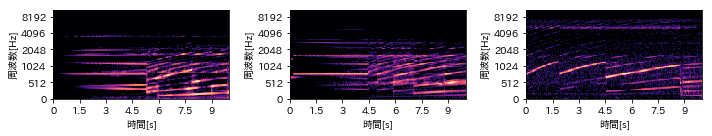

In [19]:
#train音のスペクトログラム集合図出力
plt.figure(figsize=(10,2))
for i,li in enumerate(train_list):
    s, sr_ = librosa.load(li+".wav")
    s = s[:sr_*10]
    plt.subplot(1,3,i+1)
     
#     plt.imshow(s.T, \
#                #vmin = 0, vmax = 1,
#                 #extent = [0, final_time, 0, samplerate], \
#                 aspect = 'auto',\
#                 cmap = 'jet')
#     plt.colorbar()
#     plt.xlabel('Time [s]')
#     plt.ylabel('Frequency [Hz]')
    s = librosa.feature.melspectrogram(s, sr=sr_, n_mels=128)
    s = librosa.amplitude_to_db(s, ref=np.max)
    librosa.display.specshow(s, sr=sr_, x_axis='time', y_axis='mel')
    plt.xlabel("時間[s]")
    plt.ylabel("周波数[Hz]")
    #plt.colorbar(format='%02.0f dB')
    
plt.tight_layout()
fname = "train_spec.eps"
plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)

0 ./Nonspeech/n17.wav
1 ./Nonspeech/16.wav
2 ./Nonspeech/314.wav
3 ./Nonspeech/116.wav
4 ./Nonspeech/n16.wav
5 ./Nonspeech/248.wav
6 ./Nonspeech/n28.wav
7 ./Nonspeech/n14.wav
8 ./Nonspeech/114.wav
9 ./Nonspeech/14.wav
10 ./Nonspeech/n15.wav
11 ./Nonspeech/n29.wav
12 ./Nonspeech/298.wav
13 ./Nonspeech/n11.wav
14 ./Nonspeech/n39.wav
15 ./Nonspeech/10.wav
16 ./Nonspeech/307.wav
17 ./Nonspeech/138.wav
18 ./Nonspeech/110.wav
19 ./Nonspeech/11.wav
20 ./Nonspeech/n38.wav
21 ./Nonspeech/n10.wav
22 ./Nonspeech/n12.wav
23 ./Nonspeech/13.wav
24 ./Nonspeech/12.wav
25 ./Nonspeech/n13.wav
26 ./Nonspeech/n48.wav
27 ./Nonspeech/n74.wav
28 ./Nonspeech/n60.wav
29 ./Nonspeech/61.wav
30 ./Nonspeech/438.wav
31 ./Nonspeech/149.wav
32 ./Nonspeech/48.wav
33 ./Nonspeech/60.wav
34 ./Nonspeech/n61.wav
35 ./Nonspeech/n75.wav
36 ./Nonspeech/n49.wav
37 ./Nonspeech/217.wav
38 ./Nonspeech/n88.wav
39 ./Nonspeech/n63.wav
40 ./Nonspeech/n77.wav
41 ./Nonspeech/62.wav
42 ./Nonspeech/89.wav
43 ./Nonspeech/176.wav
44 ./Nons

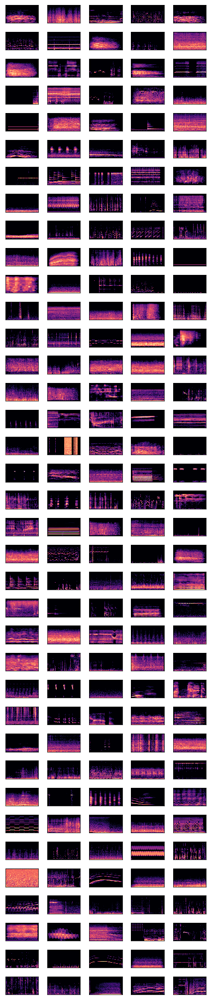

In [32]:
#noise音のスペクトログラム集合図出力
#https://www.youtube.com/watch?time_continue=31&v=-ocADGlyaHc&feature=emb_logo

plt.figure(figsize=(6,28))
#plt.figure()
import glob
noi_list = glob.glob("./Nonspeech/*")
for i,li in enumerate(noi_list):
    print(i,li)
    if li == ".DS_Store" :
        continue
    s, sr_ = librosa.load(li)
    s = s[:sr_*10]
    plt.subplot(37,5,i+1)
    s = librosa.feature.melspectrogram(s, sr=sr_, n_mels=128)
    s = librosa.amplitude_to_db(s, ref=np.max)
    librosa.display.specshow(s, sr=sr_, x_axis='off', y_axis='off')
#     if (i % 5) == 0:
#         plt.ylabel("周波数[Hz]")
#     if i >= 180:
#         plt.xlabel("時間[s]")
    #plt.colorbar(format='%02.0f dB')
plt.tight_layout()
fname = "train_noise.eps"
plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)

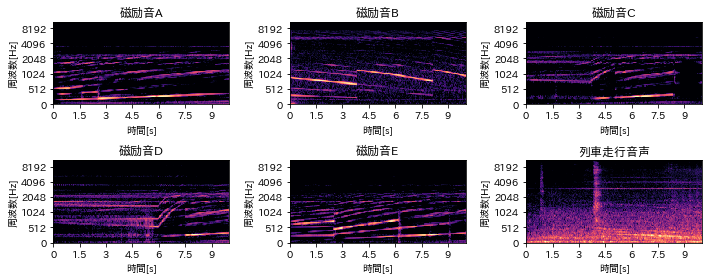

In [24]:
foldername = "mir_eval_data"
test_inv = [os.path.join(foldername,"seibu6000_test"), os.path.join(foldername,"209_test"), os.path.join(foldername, "7000inv_norm"), os.path.join(foldername, "50000inv_norm"),os.path.join(foldername, "9050inv_norm")]
#test音のスペクトログラム集合図出力
plt.figure(figsize=(10,4))
_ = ["A","B","C","D","E"]
for i,li in enumerate(test_inv):
    s, sr_ = librosa.load(li+".wav")
    s = s[:sr_*10]
    plt.subplot(2,3,i+1)
    s = librosa.feature.melspectrogram(s, sr=sr_, n_mels=128)
    s = librosa.amplitude_to_db(s, ref=np.max)
    librosa.display.specshow(s, sr=sr_, x_axis='time', y_axis='mel')
    plt.xlabel("時間[s]")
    plt.ylabel("周波数[Hz]")
    plt.title("磁励音{}".format(_[i]))
    

s, sr_ = librosa.load("./mir_eval_data/train.wav")
s = s[:sr_*10]
plt.subplot(2,3,6)
s = librosa.feature.melspectrogram(s, sr=sr_, n_mels=128)
s = librosa.amplitude_to_db(s, ref=np.max)
librosa.display.specshow(s, sr=sr_, x_axis='time', y_axis='mel')
plt.xlabel("時間[s]")
plt.ylabel("周波数[Hz]")
plt.title("列車走行音声")

#plt.colorbar(format='%02.0f dB')
plt.tight_layout()
fname = "test_spec.eps"
plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)

In [58]:
#.epsで出力するために，sep.pyの内容を全部こっちに書いてる(sepは弄りたくないし，こっちのが何かと拡張しやすい)

def plot_leader_fft(stft, cepstrums, clusta_leader,fname):
    plt.figure(figsize=(10,9))
    Num = len(clusta_leader)
    j = 0
    for i in range(Num):
        j += 1
        plt.subplot(Num,3,j)
        #plt.subplot(1,2,1)
        plt.plot(stft[:,clusta_leader[i]])
        plt.title("クラスタ {}".format(str(i+1)))
        if j > 3:
            plt.xlabel("FFT ビン")
    #plt.suptitle('FFT of each clusta', fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
        
def plot_leader_ceps(stft, cepstrums, clusta_leader,fname):
    plt.figure(figsize=(10,9))
    Num = len(clusta_leader)
    j = 0
    for i in range(Num):
        j += 1
        plt.subplot(Num,3,j)
        #plt.subplot(1,2,2)
        plt.plot(cepstrums.T[:,clusta_leader[i]])
        plt.title("クラスタ {}".format(str(i+1)))
        if j > 3:
            plt.xlabel("FFT ビン")
    #plt.suptitle('Cepstrum of each clusta', fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    
def plot_ceps_tsne(cepstrums,perplexity,fname):
    plt.figure()
    # plt.subplot(xNum, math.ceil(Num/xNum), i+1)
    cnt = perplexity
    print("Now calculating : {}".format(cnt))
    model = tsne.BHTSNE(dimensions=2, perplexity=cnt, theta=0.5, rand_seed=1000)
    tsne_result = model.fit_transform(cepstrums) 
    plt.plot(tsne_result[:,0], tsne_result[:,1], ".")
    plt.title("perplexity:"+str(cnt))
    #plt.savefig('train_tsnes.png')
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    
def plot_nmf_basis(basis, fname):
    plt.figure(figsize=(10,15))
    xs = int(math.gcd(len(basis[0]), 10))
    for k in range(1, len(basis[0]) + 1):
        plt.subplot(xs, math.ceil(len(basis[0]) / xs), k)
        plt.plot(basis[:,k-1])
        plt.title(str(k))
        if k > 27:
            plt.xlabel("FFT ビン")
    #plt.suptitle('NMF basis', fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.935)
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    
def plot_nmfspec(left):
    plt.figure(figsize=(10,4))
    librosa.display.specshow(librosa.amplitude_to_db(left, ref=np.max), y_axis='log')
    plt.title('NMF Power spectrogram')
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

def plot_cost(cost,fname):
    left = np.arange(1, len(cost)+1)
    plt.figure()
    plt.bar(left, cost)
    #plt.title('NMF reconstruction error')
    plt.ylabel('再構成誤差')
    plt.xlabel("更新回数")
    plt.tight_layout()
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    
def calculate_clusta(tsne_fname, numClusta=6):
    tsne_result = np.load(tsne_fname)
    #lsa = TruncatedSVD(2)
    #tsne_result = lsa.fit_transform(cepstrums)
    #loss = round((sum(lsa.explained_variance_ratio_)),2)
    #print("説明できる割合:{}".format(loss))
    kmeans = MiniBatchKMeans(n_clusters=numClusta, max_iter=800, random_state=1000) #k-meansでクラスタリング，クラスタは見て決めた
    kmeans_tsne = kmeans.fit_predict(tsne_result) # ラベル

    return tsne_result, kmeans_tsne, kmeans

def plot_clusta(tsne_fname, numClusta, fname):
    clusta_leader = []
    plt.figure()
    #plt.subplot(numClusta, 1, j+1)
    tsne_result, kmeans_tsne, kmeans = calculate_clusta(tsne_fname, numClusta)
    color = cm.brg(np.linspace(0,1,np.max(kmeans_tsne) - np.min(kmeans_tsne)+1))
    for i in range(np.min(kmeans_tsne), np.max(kmeans_tsne)+1):
        plt.plot(tsne_result[kmeans_tsne == i][:,0],
                tsne_result[kmeans_tsne == i][:,1],
                ".",
                color=color[i]
                )
        ret = serch_neighbourhood(kmeans.cluster_centers_[i], tsne_result[kmeans_tsne == i]) #各クラスタの重心の最近傍点を探索
        plt.text(ret[0],
                ret[1],
                str(i+1), color="gold", size=40,fontweight="extra bold"
                )
        clusta_leader.append(np.where(tsne_result == ret)[0][0])
        print('{}:{}'.format((i+1), clusta_leader[i])) #重心の最近傍点の添字番号をprint
    #plt.show()
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    
def serch_neighbourhood(p0, ps):
    L = np.array([])
    for i in range(ps.shape[0]):
        L = np.append(L,np.linalg.norm(ps[i]-p0))
    return ps[np.argmin(L)]

def extract_ceps(stft):
    cepCoef = 15
    nfft = 2048
    envelope = []
    for i in range(len(stft[0])):
        one_stft = stft[:,i]
        logStft = 20 * np.log10(one_stft+1) #対数振幅スペクトル化(+1はNanを避けるため)
        cps = np.fft.ifft(logStft,nfft)[0:int(nfft/2)] #ケプストラムの導出
        cpsLif = [one if i <= cepCoef else 0 for i, one in enumerate(cps)] # 高周波成分を除く（左右対称なので注意）
        dftSpc = np.real(np.fft.fft(cpsLif, nfft))[0:int(nfft/2)] #ケプストラム領域をフーリエ変換してスペクトル領域に戻す
        dftSpc = dftSpc + np.ceil(-1 * np.min(dftSpc)) #[0,1]正規化
        dftSpc = dftSpc / np.max(dftSpc)
        envelope.append(dftSpc) #各時間での包絡を積んでいる
    cepstrums = np.array(envelope)
    return cepstrums

クラスタリーダーを表示
1:509


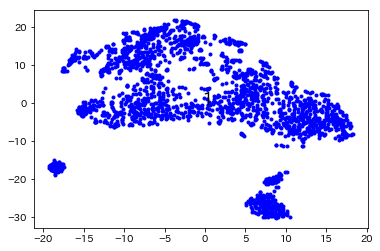

1:1146
2:252


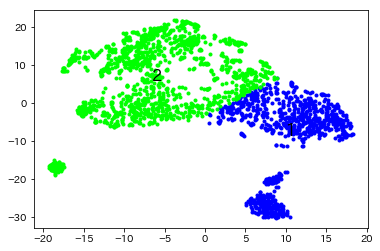

1:1169
2:378
3:627


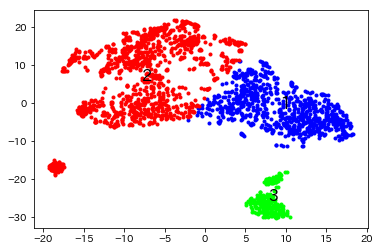

1:1169
2:909
3:627
4:220


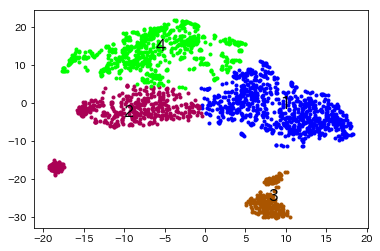

1:627
2:220
3:984
4:1500
5:343


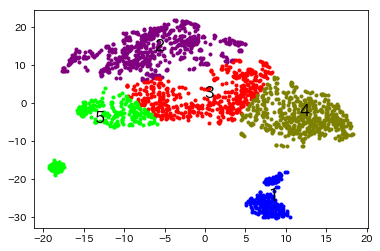

1:2078
2:1133
3:627
4:1857
5:418
6:2175


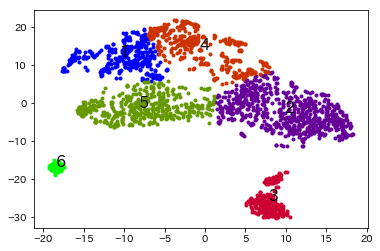

1:2078
2:1133
3:627
4:1857
5:418
6:2175


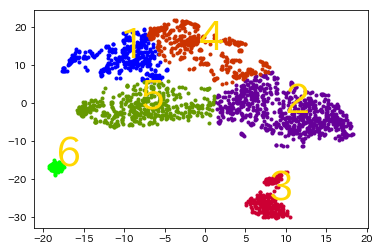

In [59]:
#論文用figure生成
func = Functions(basis=30, iter=100, ss_basis=50, ss_iter=100)

print("クラスタリーダーを表示")
train = train_list[0]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
#fname = "tsne_result_seibu6000"
#func.save_tsne_result(ceps, fname, perNum=160)
tsne_fname = "tsne_result_"
clusta_leader = func.plot_clusta(tsne_fname+".npy", numClusta=6)
plot_clusta(tsne_fname+".npy", 6, "tsne_clusta_6000.eps")
# plot_leader_fft(stft, ceps, clusta_leader)
# plot_leader_ceps(stft, ceps, clusta_leader)

# print("ノイズ成分除去後のtsneを表示")
# a,b,c = func.calculate_clusta("./tsne_result_.npy", numClusta=6)
# rem_stft_6000 = func.remove_noise(stft, a, b, [3,6])
# rem_ceps_6000 = func.extract_ceps(rem_stft_6000)
# plot_ceps_tsne(rem_ceps_6000, 160, "tsne_clusta_rem.eps")

# print("基底行列の基底をそれぞれ表示")
# rem_rem_stft6000 = np.load("./rem_rem_stft6000.npy")
# init_F = []
# for i in range(30):
#     init_F.append(np.load('./npys/rem_common_for_basis_30_'+str(i)+".npy"))
# init_F = np.array(init_F)
# # F.shape=(30, 1025)
# init_G = np.random.rand(init_F.T.shape[1], rem_rem_stft6000.shape[1])
# F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=2)
# basis_ceps = extract_ceps(F).T
# plot_nmf_basis(F "beta2_basis_30.eps")
# plot_nmf_basis(basis_ceps, "beta2_basis_ceps_30.eps")


# print("costを表示")
# cost_list = []
# for i in range(1,51):
#     func = Functions(basis=30, iter=i, ss_basis=50, ss_iter=300)
#     F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=2)
#     cost_list.append(cost)
#     print(str(i))
# plot_cost(cost_list[:50],"nmf_cost.eps")

In [9]:
import librosa
#周波数応答を算出
def amptitude_frequency(x):
    N = len(x)
    win = scipy.signal.hann(N)
    spectrum = scipy.fftpack.fft(x * win)
    #amp = np.abs(spectrum[1:20])
    res = np.array([np.sqrt(c.real ** 2 + c.imag ** 2) for c in spectrum])#[:20]
    res = res / np.max(res)
    return res
    
def mfcc(x_):
    return librosa.feature.mfcc(x_, n_fft=len(x_),hop_length=len(x_),n_mfcc=12).reshape(-1)

In [12]:
#「乗車車両の推定」用のfigure作成
snr_list = [5]
for k in snr_list:
    eval_dic = {}
    SNR =  k
    i = 0
    s_inv, sr_inv = librosa.load(train_list[i])
    s_veh, sr_veh = librosa.load(vehiclename)

    if len(s_veh) != len(s_inv): 
        s_inv, s_veh = time_norm(s_inv, s_veh)
    if sr_inv != sr_veh:
        print("Not muching sampling rate!")

    mix_coef = check_snr(s_inv, s_veh, snr=SNR)
    fake_data = s_inv + mix_coef * s_veh
    fake_stft = librosa.stft(fake_data)
    fake_abs = np.abs(fake_stft)

    F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=2)
    ssnmf_beta = func.extract_vvvf(fake_abs, F=F, beta=2)

SNR:5.095157027244568, mix_coef:1.5780000000000014
NMF extract
Iteration : 150
SSNMF extract


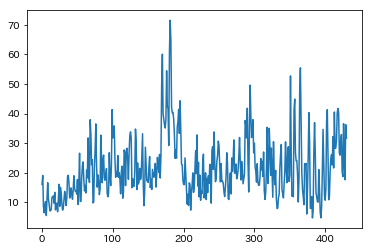

In [28]:
plt.figure()
plt.plot(ssnmf_beta[1].sum(axis=0))
#plt.title("分離後の磁励音音声")
plt.savefig('paper_img/separate_plot.eps', bbox_inches="tight", pad_inches=0.05)

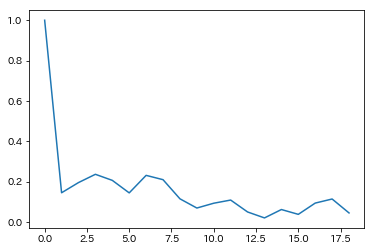

In [29]:
plt.figure()
plt.plot(amptitude_frequency(ssnmf_beta[1].sum(axis=0))[1:20]/max(amptitude_frequency(ssnmf_beta[1].sum(axis=0))[1:20]))
#plt.title("フーリエ変換")
plt.savefig('paper_img/FT_LPF_plot.eps', bbox_inches="tight", pad_inches=0.05)

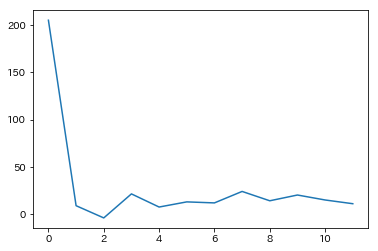

In [30]:
plt.figure()
plt.plot(mfcc(ssnmf_beta[1].sum(axis=0)))#/max(mfcc(ssnmf_beta[1].sum(axis=0))))
#plt.title("MFCC")
plt.savefig('paper_img/MFCC_plot.eps', bbox_inches="tight", pad_inches=0.05)

## seibu6000系

A
A
Now calculating : 50


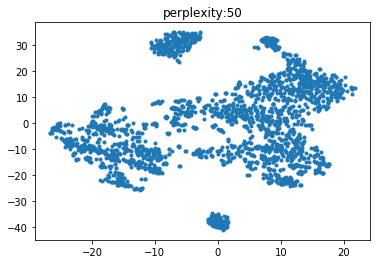

Now calculating : 100


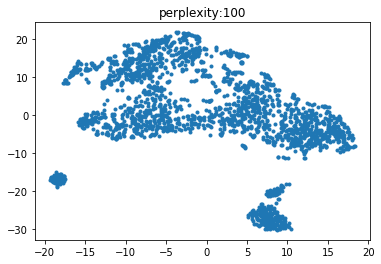

Now calculating : 150


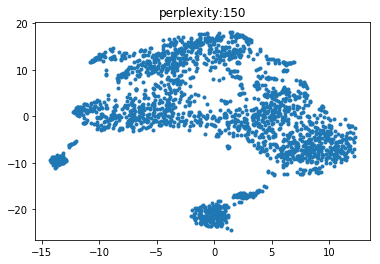

Now calculating : 200


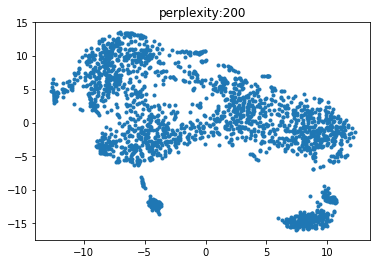

Now calculating : 250


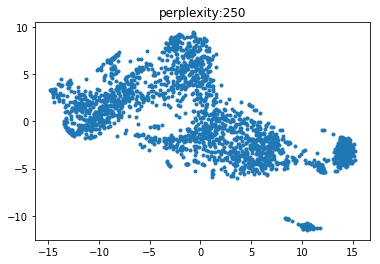

Now calculating : 300


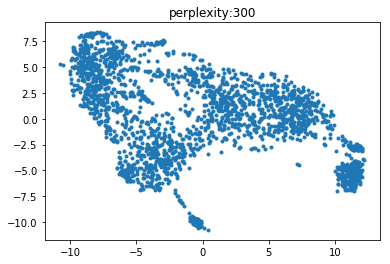

Now calculating : 350


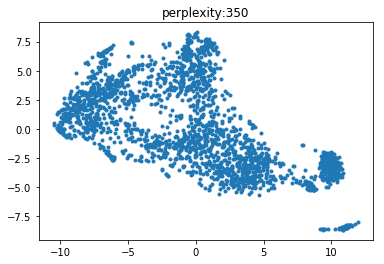

Now calculating : 400


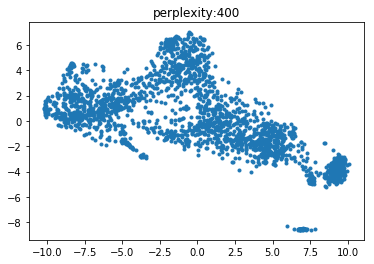

Now calculating : 450


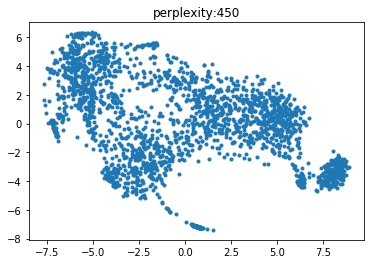

Now calculating : 500


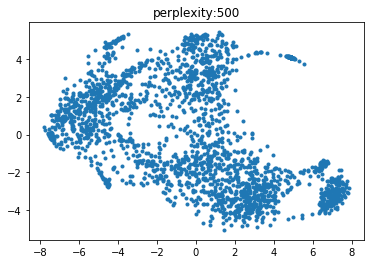

Now calculating : 550


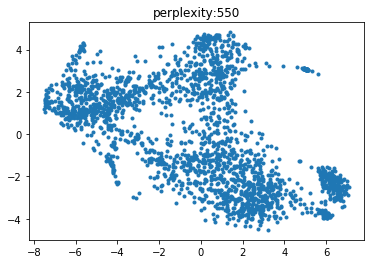

Now calculating : 600


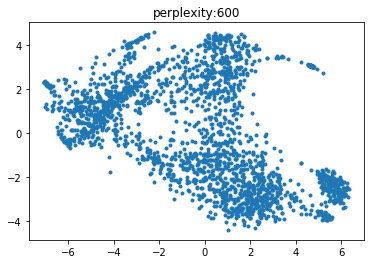

Now calculating : 650


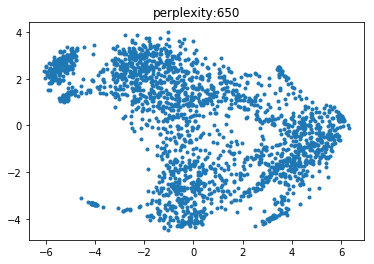

Now calculating : 700


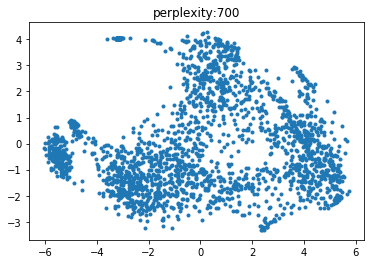

In [ ]:
#perplexityの確認
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[0]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
func.plot_ceps_tsnes(ceps)

1:509


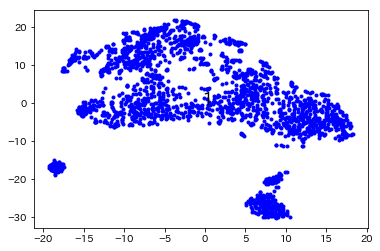

1:1146
2:252


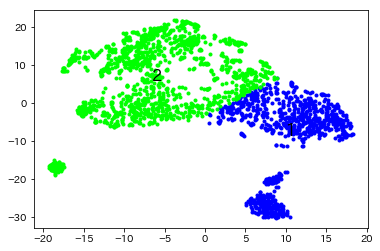

1:1169
2:378
3:627


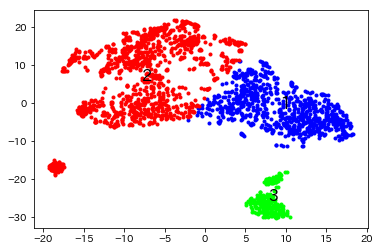

1:1169
2:909
3:627
4:220


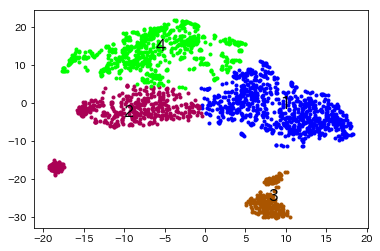

1:627
2:220
3:984
4:1500
5:343


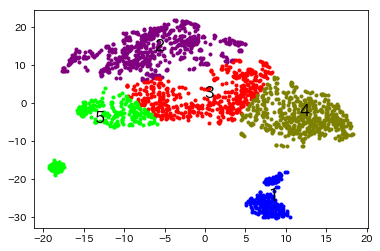

1:2078
2:1133
3:627
4:1857
5:418
6:2175


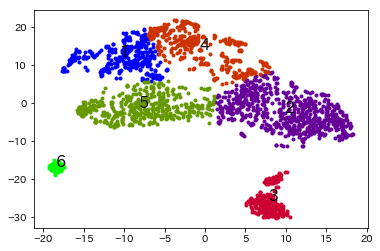

KeyboardInterrupt: 

In [51]:
#ノイジーな成分を除去
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[0]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
#fname = "tsne_result_seibu6000"
#func.save_tsne_result(ceps, fname, perNum=160)
fname = "tsne_result_"
clusta_leader = func.plot_clusta(fname+".npy", numClusta=6)
func.plot_clusta_leader(stft, ceps, clusta_leader)

a,b,c = func.calculate_clusta("./tsne_result_.npy", numClusta=6)
rem_stft_6000 = func.remove_noise(stft, a, b, [3,6])
rem_ceps_6000 = func.extract_ceps(rem_stft_6000)
func.plot_ceps_tsnes(rem_ceps_6000)

## keikyu1000系

Now calculating : 50


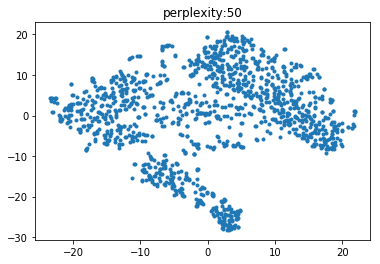

Now calculating : 100


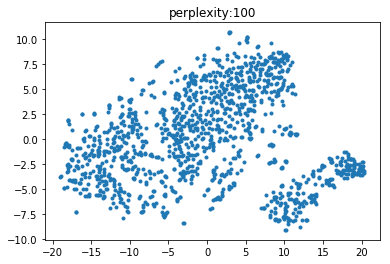

Now calculating : 150


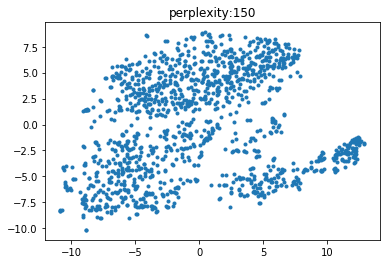

Now calculating : 200


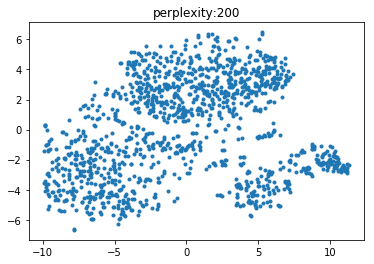

Now calculating : 250


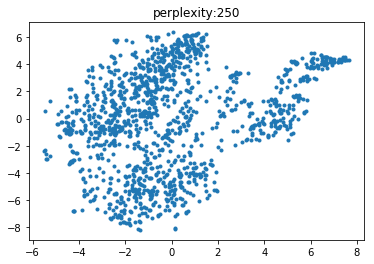

Now calculating : 300


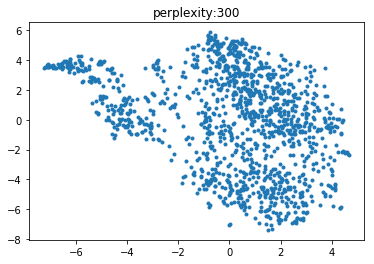

Now calculating : 350


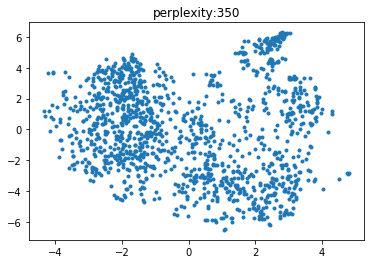

Now calculating : 400


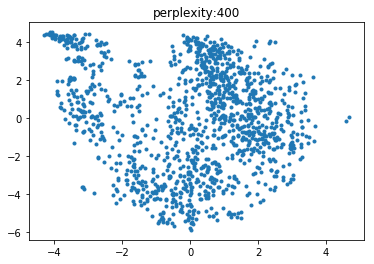

In [ ]:
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[1]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
func.plot_ceps_tsnes(ceps)

1:811


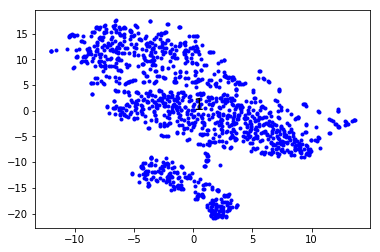

1:660
2:424


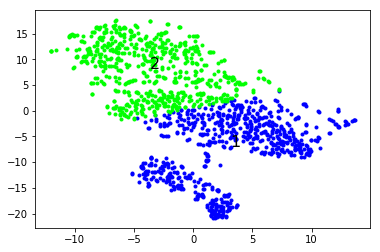

1:752
2:422
3:95


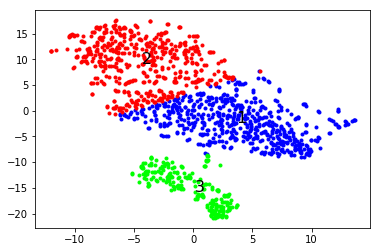

1:930
2:344
3:105
4:767


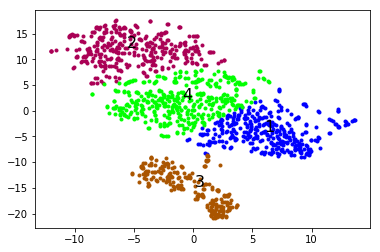

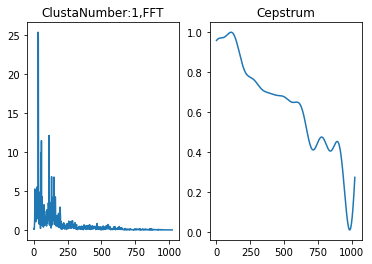

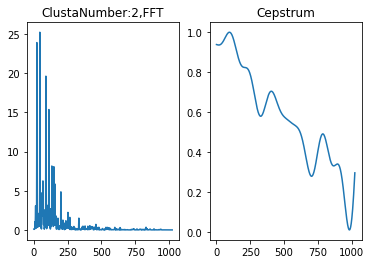

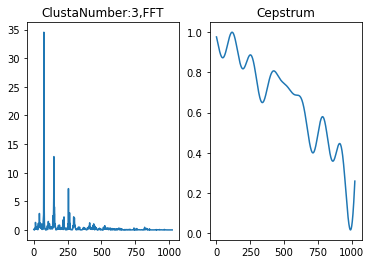

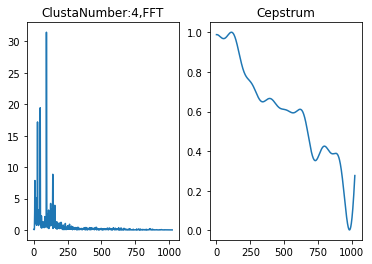

(1025, 1293)
(227,)
(227,)
(1025, 1066)
Now calculating : 50


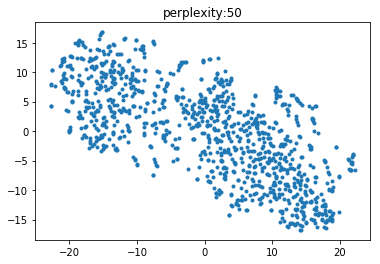

Now calculating : 100


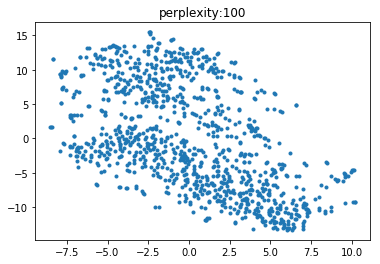

Now calculating : 150


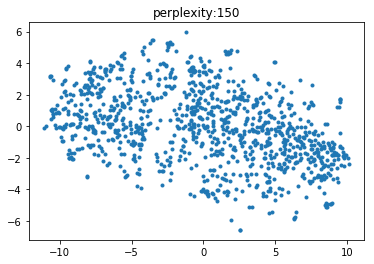

Now calculating : 200


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [4]:
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[1]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
fname = "tsne_result_keikyu1000"
func.save_tsne_result(ceps, fname, perNum=100)
clusta_leader = func.plot_clusta(fname+".npy", numClusta=4)
func.plot_clusta_leader(stft, ceps, clusta_leader)

a,b,c = func.calculate_clusta("./tsne_result_keikyu1000.npy", numClusta=4)
rem_stft_1000 = func.remove_noise(stft, a, b, [3])
rem_ceps_1000 = func.extract_ceps(rem_stft_1000)
#func.plot_ceps_tsnes(rem_ceps_1000)

## 209系

Now calculating : 50


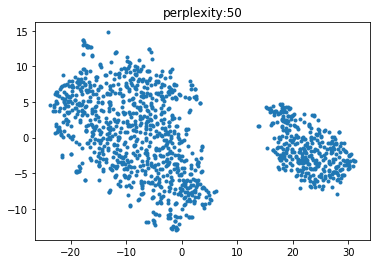

Now calculating : 100


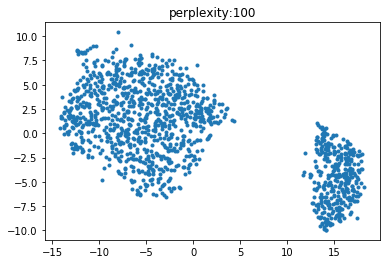

Now calculating : 150


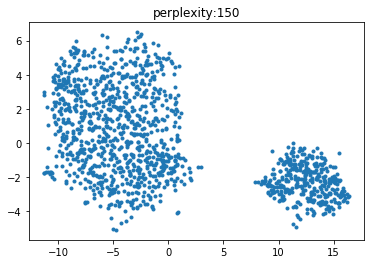

Now calculating : 200


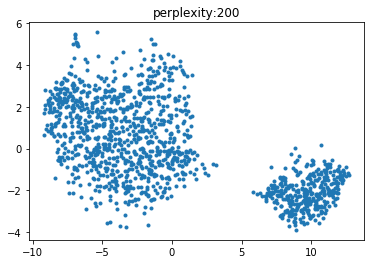

Now calculating : 250


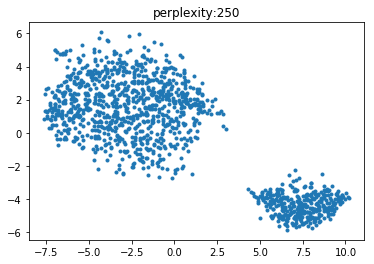

Now calculating : 300


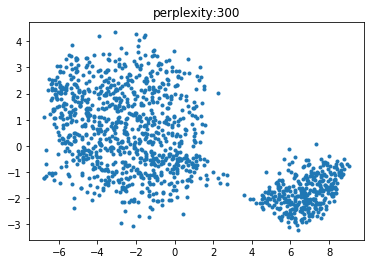

Now calculating : 350


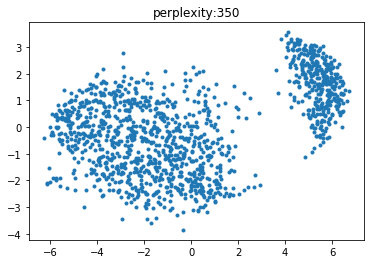

Now calculating : 400


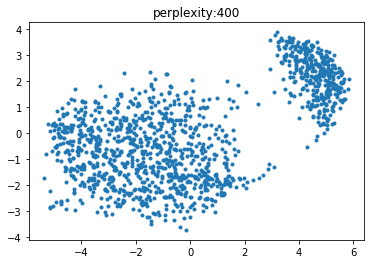

In [ ]:
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[2]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
func.plot_ceps_tsnes(ceps)

1:1098


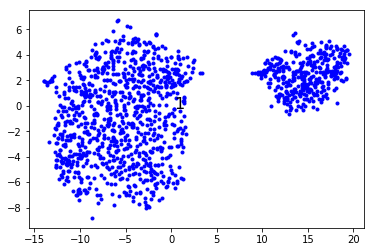

1:432
2:986


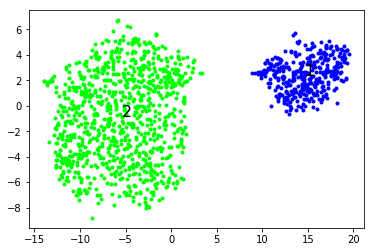

1:432
2:102
3:230


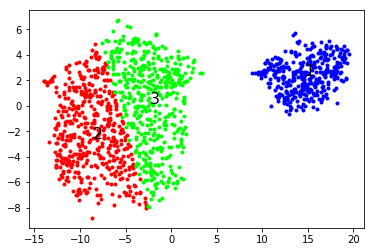

1:983
2:432
3:1265
4:289


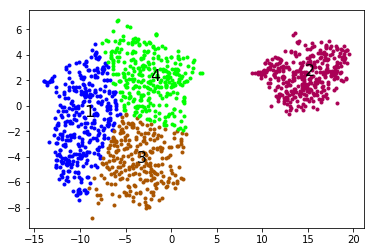

1:247
2:432
3:116
4:311
5:60


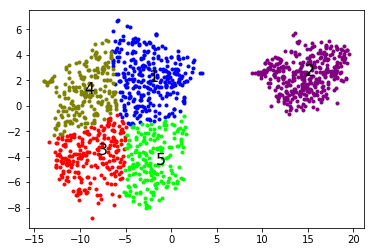

1:580
2:1035
3:1056
4:224
5:625
6:1190


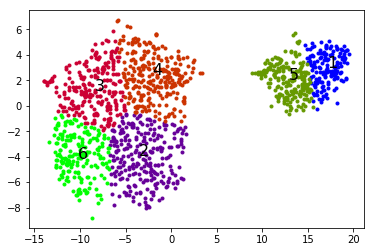

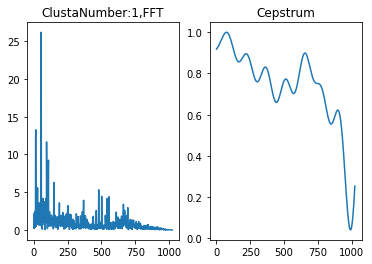

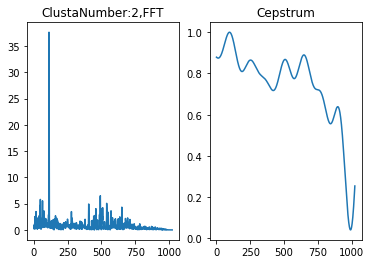

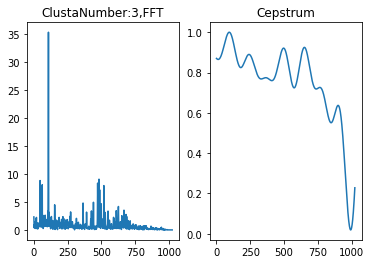

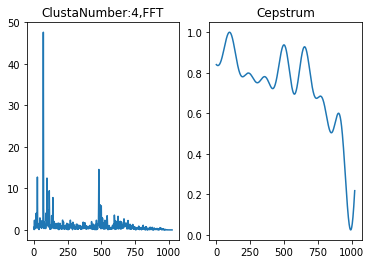

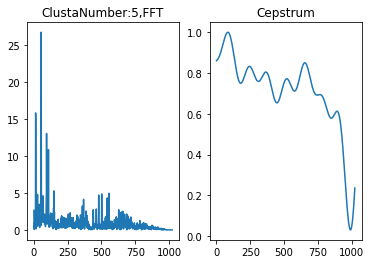

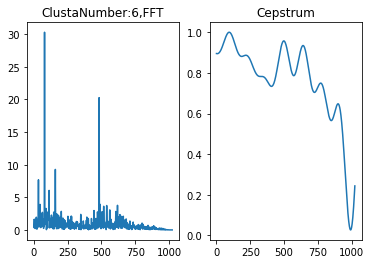

(1025, 1292)
(355,)
(355,)
(1025, 937)
Now calculating : 50


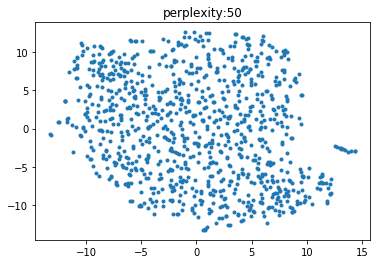

Now calculating : 100


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [8]:
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

train = train_list[2]
stft = func.stft(train)
ceps = func.extract_ceps(stft)
fname = "tsne_result_209"
func.save_tsne_result(ceps, fname, perNum=100)
#fname = "tsne_result_"
clusta_leader = func.plot_clusta(fname+".npy", numClusta=2)
func.plot_clusta_leader(stft, ceps, clusta_leader)

a,b,c = func.calculate_clusta("./tsne_result_209.npy", numClusta=2)
rem_stft_209 = func.remove_noise(stft, a, b, [1])
rem_ceps_209 = func.extract_ceps(rem_stft_209)
func.plot_ceps_tsnes(rem_ceps_209)

In [13]:
#特に毎回処理させる必要はないので保存
np.savez("rem_stft_6000_1000_209", stft6000=rem_stft_6000, stft1000=rem_stft_1000, stft209=rem_stft_209)
np.savez("rem_ceps_6000_1000_209", ceps6000=rem_ceps_6000, ceps1000=rem_ceps_1000, ceps209=rem_ceps_209)

# 共通の音色構造を抽出

In [11]:
#shape = (data number, fftbin)
print(rem_ceps_6000.shape)
print(rem_ceps_209.shape)
print(rem_ceps_1000.shape)

(1860, 1024)
(937, 1024)
(1066, 1024)


In [21]:
#ノイズ処理済みのデータを読み込み
#一度処理したあとならこれを読み出せば良い
stft6000 = np.load("rem_stft_6000_1000_209.npz")["stft6000"]
stft1000 = np.load("rem_stft_6000_1000_209.npz")["stft1000"]
stft209 = np.load("rem_stft_6000_1000_209.npz")["stft209"]
ceps6000 = np.load("rem_ceps_6000_1000_209.npz")["ceps6000"]
ceps1000 = np.load("rem_ceps_6000_1000_209.npz")["ceps1000"]
ceps209 = np.load("rem_ceps_6000_1000_209.npz")["ceps209"]

1:1492


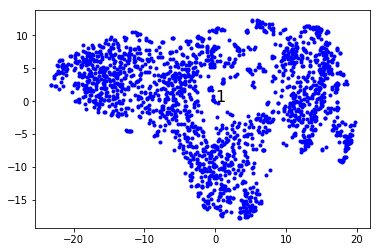

1:971
2:660


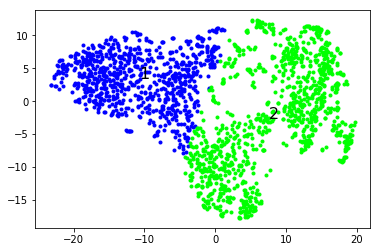

1:971
2:402
3:203


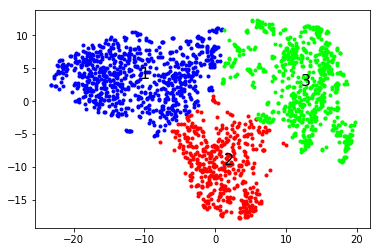

1:965
2:399
3:118
4:1379


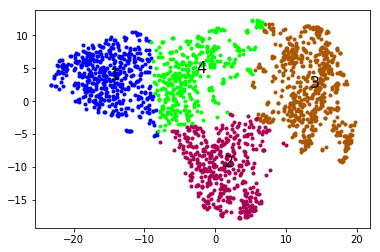

1:849
2:1793
3:415
4:1032
5:1681


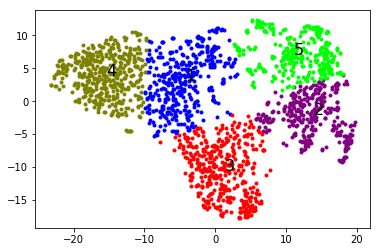

1:993
2:746
3:1636
4:519
5:638
6:1827


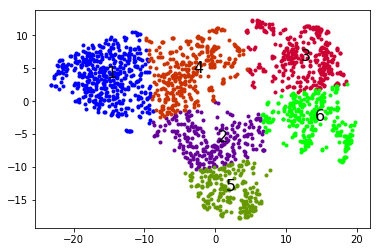

1:1329
2:1629
3:744
4:1301
5:1381
6:1814
7:232


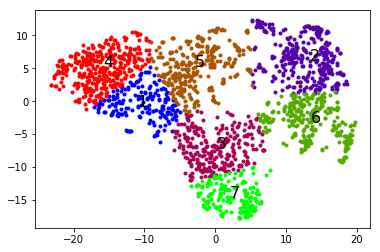

1:873
2:453
3:1468
4:1630
5:1828
6:218
7:1045
8:532


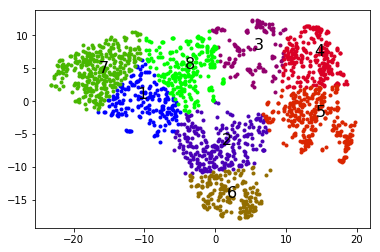

1:1310
2:691
3:1468
4:1630
5:1829
6:337
7:1013
8:532
9:777


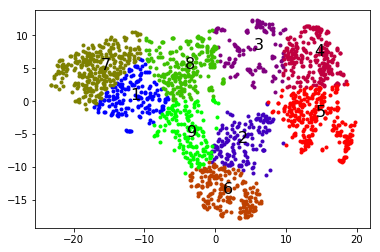

1:1310
2:691
3:1527
4:1663
5:1776
6:337
7:1013
8:522
9:494
10:118


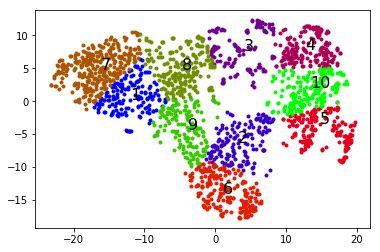

1:930
2:384
3:1533
4:1663
5:1776
6:303
7:1031
8:522
9:537
10:118
11:420


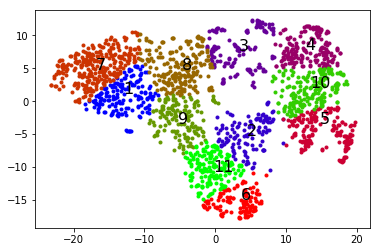

1:1201
2:386
3:1527
4:1656
5:1846
6:265
7:1012
8:843
9:772
10:118
11:685
12:1365


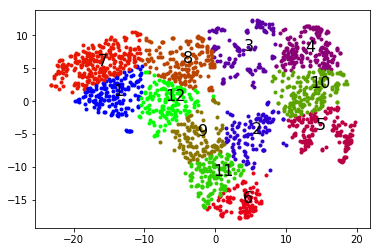

1:970
2:418
3:1527
4:1656
5:1776
6:265
7:1057
8:574
9:462
10:118
11:686
12:1365
13:1040


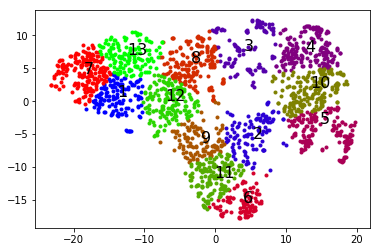

1:930
2:418
3:1573
4:1656
5:1846
6:265
7:1145
8:517
9:772
10:118
11:686
12:528
13:990
14:1005


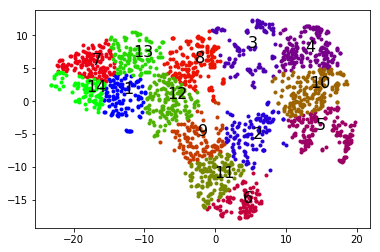

1:1759
2:1367
3:1689
4:1057
5:1538
6:40
7:883
8:386
9:1449
10:1620
11:793
12:714
13:1050
14:165
15:1155


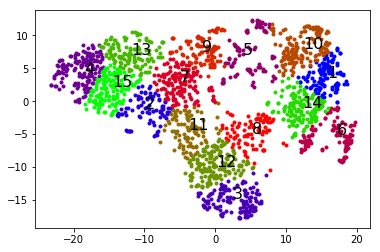

1:1763
2:1232
3:714
4:1440
5:1846
6:973
7:793
8:1599
9:1148
10:816
11:258
12:613
13:900
14:1621
15:640
16:710


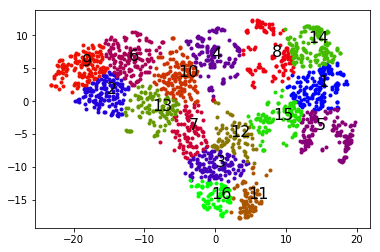

1:1197
2:1497
3:565
4:40
5:539
6:1425
7:713
8:1732
9:1302
10:694
11:1606
12:407
13:255
14:1024
15:1620
16:171
17:990


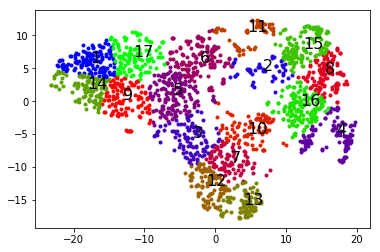

1:1852
2:1245
3:693
4:1674
5:557
6:1689
7:75
8:785
9:1456
10:1144
11:1584
12:903
13:718
14:126
15:1632
16:122
17:991
18:1209


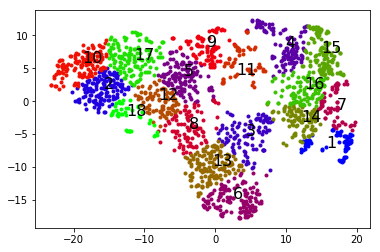

1:1566
2:493
3:1146
4:1696
5:270
6:1364
7:1050
8:38
9:690
10:1012
11:1509
12:134
13:1386
14:358
15:808
16:423
17:947
18:1661
19:335


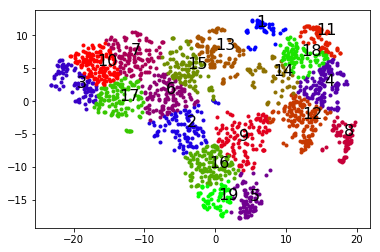

1:1014
2:125
3:537
4:1663
5:302
6:1450
7:1108
8:725
9:990
10:694
11:1756
12:866
13:238
14:1591
15:1278
16:38
17:1330
18:1191
19:1566
20:413


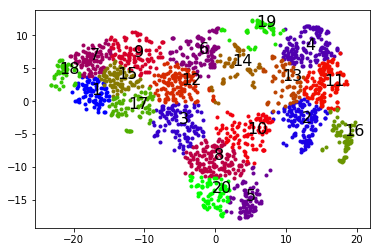

1:862
2:1738
3:401
4:1592
5:938
6:57
7:1262
8:360
9:302
10:1562
11:777
12:652
13:1064
14:413
15:1622
16:1757
17:519
18:1193
19:613
20:870
21:1457


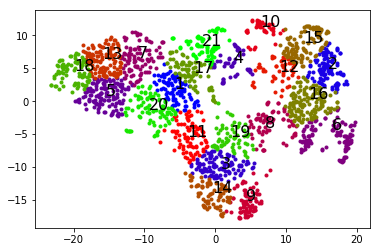

1:192
2:1276
3:394
4:335
5:1413
6:116
7:1049
8:849
9:38
10:565
11:234
12:1588
13:1148
14:1760
15:1281
16:1804
17:1550
18:734
19:270
20:1260
21:346
22:847


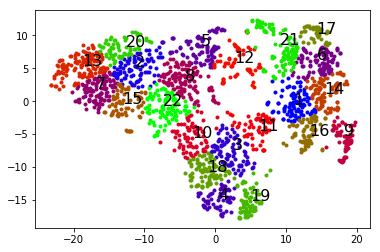

1:1382
2:766
3:938
4:1762
5:302
6:1320
7:1692
8:1705
9:1419
10:693
11:1062
12:889
13:403
14:1607
15:1301
16:1809
17:853
18:38
19:413
20:1193
21:1466
22:802
23:1813


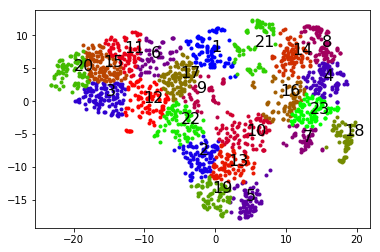

1:1789
2:1261
3:711
4:870
5:1588
6:1724
7:580
8:493
9:38
10:616
11:1138
12:1608
13:185
14:1077
15:697
16:257
17:938
18:1449
19:1759
20:649
21:811
22:1563
23:767
24:1802


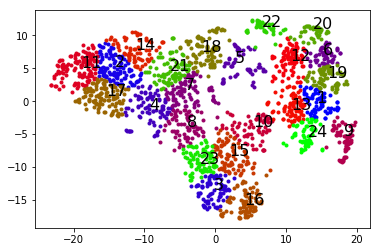

1:1670
2:900
3:398
4:1159
5:1799
6:1268
7:853
8:497
9:302
10:1759
11:1486
12:1574
13:234
14:394
15:1141
16:38
17:1253
18:169
19:1501
20:710
21:1563
22:463
23:1454
24:1012
25:1320


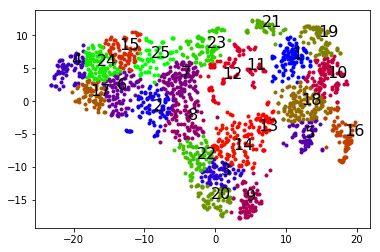

1:1197
2:1840
3:456
4:819
5:1727
6:710
7:930
8:1644
9:779
10:304
11:1387
12:1290
13:1495
14:658
15:38
16:719
17:489
18:123
19:1254
20:1235
21:1177
22:582
23:342
24:84
25:1562
26:1162


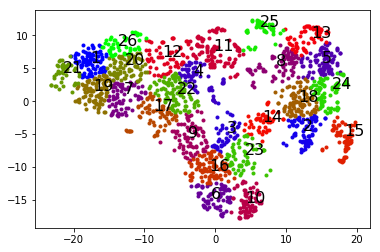

1:631
2:905
3:146
4:1194
5:779
6:1811
7:649
8:1000
9:1224
10:1455
11:658
12:1737
13:847
14:395
15:1561
16:874
17:38
18:1607
19:423
20:1486
21:1708
22:80
23:1121
24:1231
25:820
26:305
27:1339


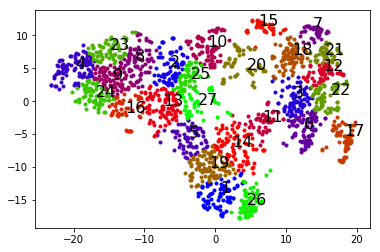

1:1467
2:850
3:401
4:1238
5:171
6:1409
7:292
8:1157
9:1561
10:947
11:38
12:811
13:483
14:220
15:1012
16:1591
17:80
18:1503
19:1800
20:252
21:750
22:671
23:825
24:1644
25:1740
26:1052
27:1014
28:549


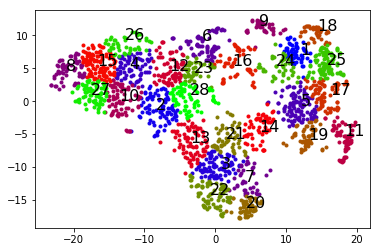

1:888
2:124
3:390
4:1086
5:1457
6:1755
7:770
8:1041
9:358
10:981
11:1799
12:1681
13:234
14:861
15:1500
16:391
17:305
18:91
19:1528
20:992
21:1067
22:35
23:763
24:842
25:1773
26:1581
27:710
28:1564
29:1210


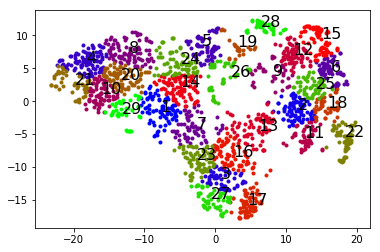

1:175
2:1209
3:1681
4:432
5:1037
6:955
7:305
8:1457
9:507
10:38
11:80
12:1167
13:1742
14:235
15:883
16:1562
17:931
18:607
19:614
20:710
21:1496
22:1550
23:1015
24:626
25:1062
26:1796
27:131
28:867
29:1819
30:570


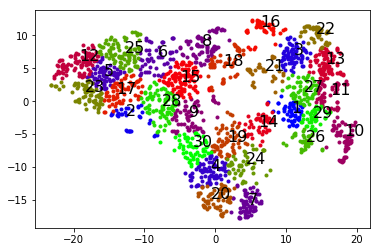

1:1686
2:852
3:378
4:1223
5:1693
6:1588
7:335
8:865
9:1034
10:1770
11:484
12:29
13:1175
14:951
15:658
16:613
17:1563
18:789
19:1299
20:1124
21:108
22:305
23:1788
24:1549
25:1454
26:639
27:1199
28:1331
29:404
30:509
31:192


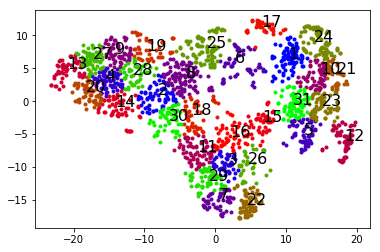

1:68
2:548
3:479
4:1147
5:667
6:1450
7:1693
8:977
9:413
10:1584
11:305
12:1550
13:1314
14:643
15:1563
16:38
17:321
18:1682
19:201
20:1742
21:1146
22:1593
23:234
24:777
25:1234
26:379
27:1367
28:171
29:1784
30:1052
31:915
32:853


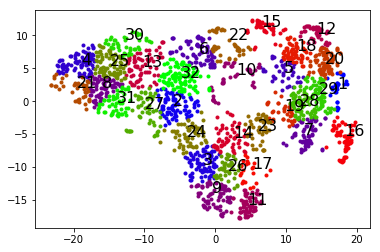

1:235
2:1233
3:1550
4:688
5:529
6:1792
7:1802
8:583
9:1015
10:305
11:1538
12:951
13:1455
14:453
15:1682
16:38
17:582
18:652
19:793
20:1563
21:128
22:905
23:1147
24:1742
25:79
26:1574
27:710
28:1354
29:1299
30:740
31:370
32:1223
33:692


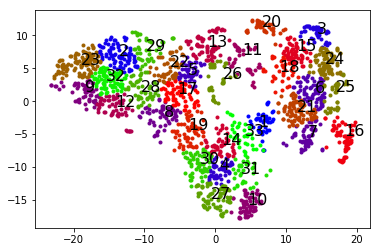

1:955
2:59
3:674
4:1635
5:1015
6:305
7:1458
8:951
9:1121
10:1591
11:124
12:495
13:1742
14:1550
15:613
16:1306
17:1543
18:1147
19:1563
20:720
21:235
22:965
23:340
24:809
25:205
26:1799
27:37
28:880
29:502
30:1696
31:1203
32:1239
33:1593
34:1377


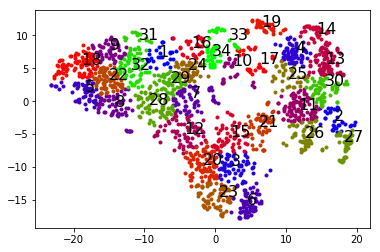

1:499
2:1681
3:1260
4:305
5:1579
6:96
7:585
8:415
9:819
10:220
11:1014
12:1741
13:1345
14:1564
15:1550
16:1219
17:29
18:710
19:1456
20:1157
21:1290
22:789
23:929
24:857
25:155
26:358
27:1091
28:66
29:1491
30:437
31:185
32:1588
33:1802
34:763
35:901


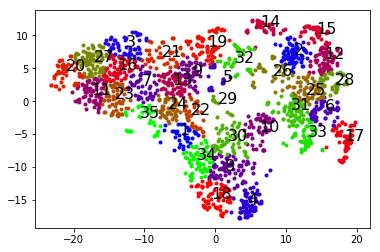

1:571
2:1771
3:1129
4:305
5:887
6:1802
7:1563
8:418
9:764
10:1457
11:1345
12:1728
13:1175
14:1646
15:1550
16:406
17:809
18:777
19:966
20:1486
21:357
22:38
23:433
24:607
25:1014
26:185
27:875
28:955
29:859
30:329
31:1682
32:120
33:80
34:973
35:1091
36:233


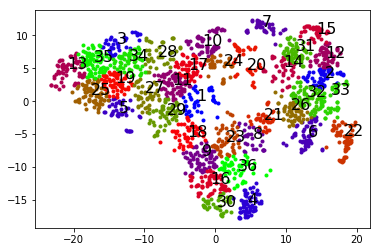

1:1503
2:921
3:763
4:652
5:1141
6:29
7:568
8:252
9:235
10:96
11:1772
12:1146
13:590
14:1564
15:614
16:166
17:710
18:777
19:893
20:1588
21:1799
22:1455
23:1675
24:1154
25:1728
26:365
27:1144
28:175
29:1265
30:490
31:81
32:263
33:1482
34:398
35:1688
36:514
37:583


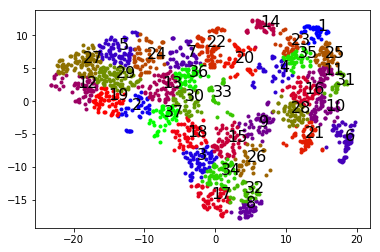

1:910
2:643
3:348
4:370
5:1692
6:1454
7:1075
8:47
9:1697
10:424
11:1076
12:550
13:1015
14:252
15:199
16:652
17:1698
18:1262
19:30
20:1587
21:576
22:462
23:902
24:1564
25:1199
26:1469
27:80
28:1486
29:716
30:134
31:1657
32:486
33:522
34:591
35:1033
36:340
37:234
38:959


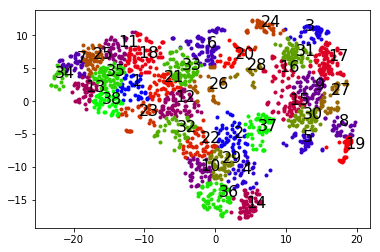

1:910
2:613
3:1550
4:370
5:1796
6:1454
7:1168
8:47
9:118
10:424
11:1129
12:821
13:1015
14:256
15:196
16:652
17:1742
18:1332
19:26
20:1587
21:590
22:462
23:902
24:1563
25:1199
26:1469
27:80
28:1489
29:716
30:160
31:1635
32:499
33:522
34:591
35:1223
36:413
37:235
38:923
39:1039


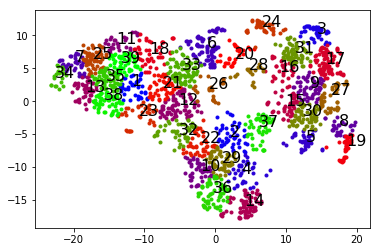

1:263
2:1196
3:1698
4:1254
5:779
6:1588
7:35
8:613
9:128
10:1076
11:490
12:1550
13:869
14:529
15:1675
16:150
17:1799
18:1696
19:660
20:1448
21:1564
22:1578
23:329
24:947
25:1069
26:726
27:272
28:386
29:1661
30:1451
31:752
32:96
33:1238
34:704
35:639
36:1191
37:545
38:553
39:516
40:1647


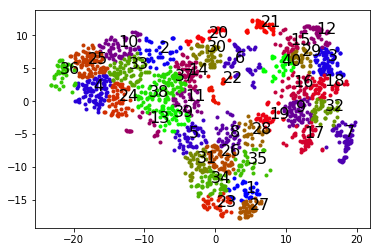

1:1742
2:907
3:305
4:1578
5:46
6:437
7:1015
8:177
9:833
10:734
11:1086
12:1397
13:233
14:1587
15:1299
16:1550
17:1796
18:493
19:1681
20:513
21:1018
22:66
23:1563
24:1209
25:1126
26:4
27:993
28:439
29:1768
30:1810
31:579
32:151
33:484
34:234
35:217
36:924
37:520
38:1497
39:881
40:1185
41:35


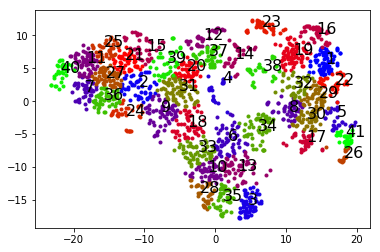

1:1340
2:1788
3:1199
4:622
5:1397
6:958
7:237
8:4
9:251
10:441
11:1062
12:1693
13:1575
14:1550
15:418
16:1373
17:533
18:1563
19:56
20:1217
21:192
22:1741
23:1224
24:359
25:764
26:1196
27:335
28:1587
29:36
30:779
31:1759
32:1652
33:971
34:750
35:1175
36:398
37:1328
38:1548
39:539
40:519
41:382
42:521


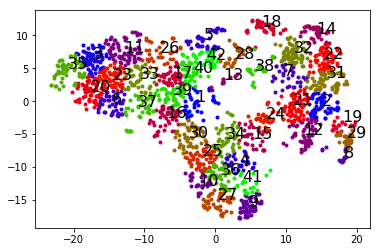

1:910
2:643
3:348
4:370
5:1692
6:1451
7:1159
8:47
9:1697
10:752
11:1129
12:845
13:1015
14:252
15:199
16:652
17:1698
18:1154
19:26
20:1587
21:1341
22:462
23:1210
24:1564
25:1043
26:1469
27:77
28:1486
29:716
30:134
31:1657
32:499
33:522
34:591
35:1223
36:335
37:235
38:923
39:1039
40:1131
41:1448
42:404
43:850


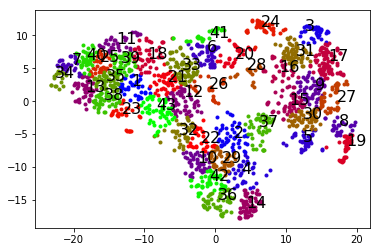

1:910
2:643
3:1550
4:370
5:1796
6:1449
7:1158
8:47
9:131
10:752
11:1129
12:490
13:1006
14:305
15:198
16:652
17:1741
18:1332
19:26
20:1587
21:1342
22:462
23:1209
24:1563
25:1012
26:1469
27:91
28:1489
29:716
30:134
31:1635
32:495
33:532
34:591
35:1223
36:335
37:234
38:923
39:1039
40:1131
41:1448
42:405
43:534
44:71


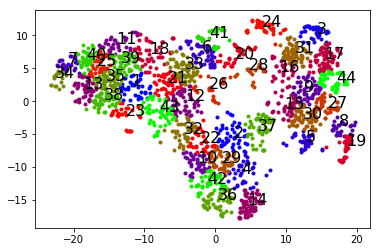

1:1279
2:1822
3:711
4:1294
5:779
6:126
7:892
8:1097
9:1550
10:30
11:234
12:1487
13:1078
14:387
15:251
16:1253
17:1681
18:971
19:1256
20:587
21:1177
22:1393
23:1789
24:423
25:1578
26:605
27:841
28:1288
29:1215
30:1410
31:39
32:184
33:1563
34:327
35:511
36:198
37:437
38:1742
39:668
40:79
41:470
42:1692
43:1144
44:652
45:549


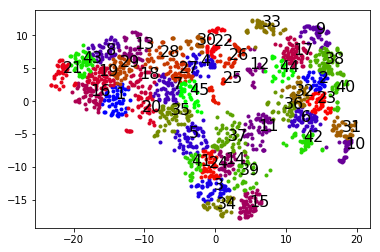

1:910
2:643
3:1550
4:370
5:1796
6:1451
7:1169
8:47
9:131
10:752
11:1071
12:490
13:1015
14:305
15:196
16:652
17:1741
18:1154
19:28
20:1587
21:1342
22:462
23:1210
24:1563
25:1012
26:1469
27:91
28:1489
29:726
30:134
31:1652
32:486
33:532
34:591
35:1223
36:335
37:234
38:957
39:1235
40:1090
41:1448
42:704
43:850
44:71
45:1360
46:1153


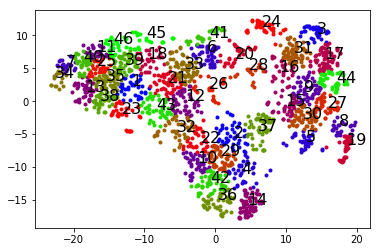

1:910
2:643
3:1550
4:370
5:1796
6:1449
7:1161
8:47
9:113
10:752
11:1071
12:490
13:1015
14:305
15:221
16:652
17:1741
18:1321
19:26
20:1587
21:1342
22:772
23:1210
24:1563
25:1012
26:1469
27:91
28:1498
29:726
30:134
31:1652
32:486
33:532
34:595
35:1223
36:240
37:234
38:924
39:1235
40:1148
41:1393
42:704
43:850
44:71
45:1203
46:1153
47:146


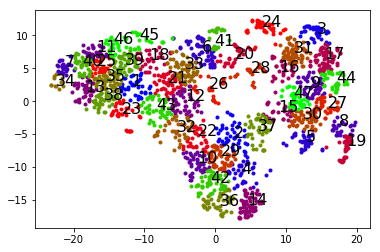

1:1040
2:360
3:251
4:1607
5:856
6:9
7:465
8:1246
9:1409
10:132
11:632
12:1191
13:1741
14:1458
15:1421
16:1785
17:416
18:233
19:1589
20:343
21:1550
22:1150
23:1209
24:1548
25:1563
26:1083
27:194
28:1256
29:1692
30:70
31:1120
32:489
33:139
34:802
35:529
36:1093
37:748
38:39
39:972
40:951
41:327
42:1822
43:1531
44:1275
45:1814
46:955
47:521
48:238


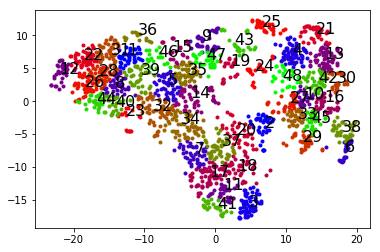

1:91
2:875
3:233
4:1563
5:1427
6:1014
7:371
8:1728
9:1148
10:176
11:820
12:796
13:353
14:1692
15:613
16:1052
17:1323
18:1589
19:39
20:1550
21:878
22:258
23:734
24:1235
25:1607
26:131
27:385
28:64
29:858
30:487
31:538
32:1745
33:932
34:791
35:1345
36:1476
37:628
38:1487
39:1128
40:9
41:743
42:418
43:1597
44:1177
45:1441
46:126
47:1045
48:1397
49:247


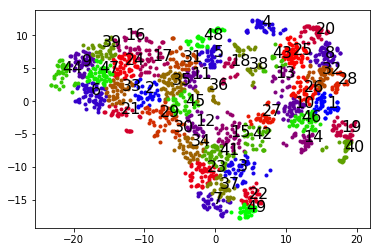

1:472
2:1781
3:1141
4:1374
5:657
6:1743
7:489
8:175
9:341
10:1212
11:39
12:545
13:1548
14:239
15:1563
16:652
17:821
18:1751
19:387
20:1476
21:1177
22:933
23:1196
24:1819
25:290
26:600
27:1796
28:487
29:1117
30:371
31:30
32:1683
33:251
34:613
35:1000
36:1550
37:844
38:1636
39:958
40:431
41:70
42:1587
43:796
44:1037
45:886
46:1581
47:163
48:449
49:1397
50:195


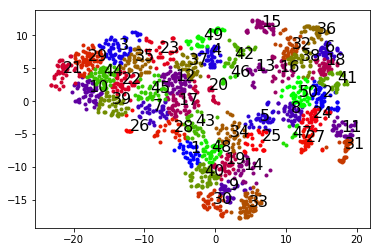

1:580


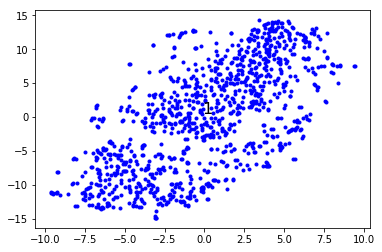

1:150
2:1008


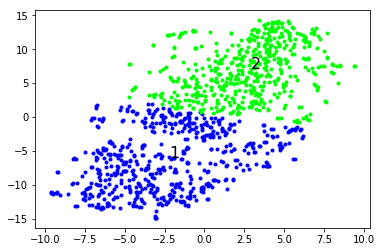

1:658
2:703
3:181


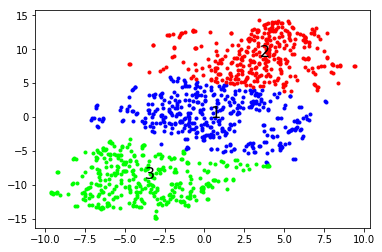

1:703
2:189
3:546
4:439


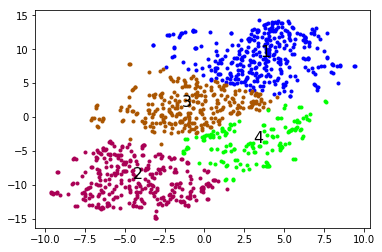

1:944
2:189
3:831
4:377
5:564


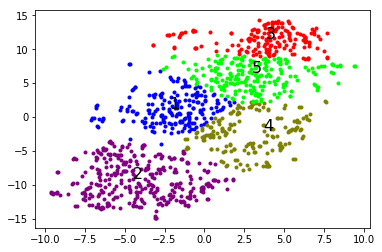

1:948
2:578
3:101
4:753
5:439
6:837


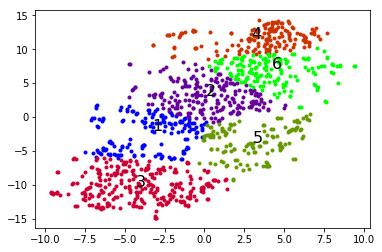

1:456
2:898
3:252
4:587
5:550
6:125
7:1026


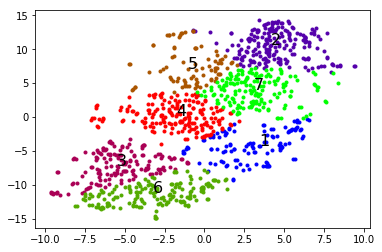

1:436
2:697
3:252
4:1046
5:114
6:996
7:28
8:936


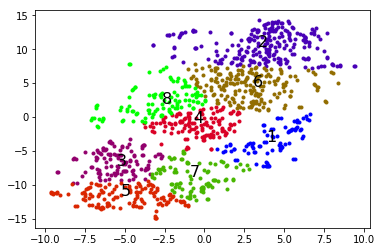

1:436
2:477
3:282
4:1046
5:104
6:996
7:28
8:562
9:802


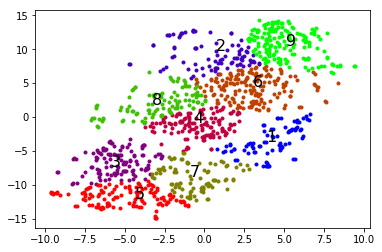

1:436
2:477
3:281
4:1046
5:41
6:996
7:94
8:936
9:802
10:185


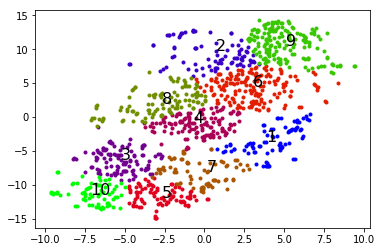

1:470
2:477
3:294
4:1046
5:66
6:996
7:95
8:621
9:802
10:185
11:254


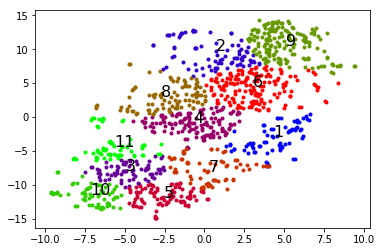

1:620
2:56
3:601
4:748
5:548
6:519
7:83
8:490
9:281
10:456
11:703
12:366


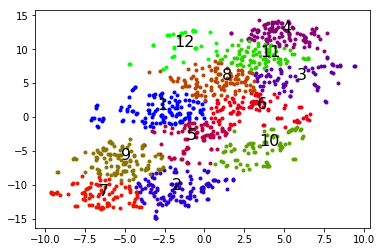

1:457
2:477
3:234
4:1029
5:41
6:859
7:94
8:930
9:720
10:185
11:261
12:707
13:518


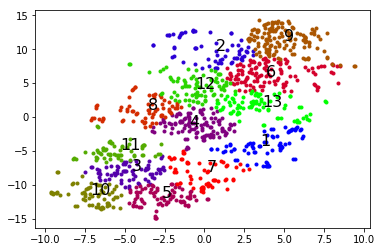

1:457
2:477
3:294
4:1029
5:41
6:976
7:29
8:930
9:846
10:185
11:261
12:707
13:519
14:748


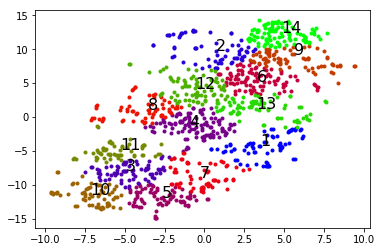

1:457
2:667
3:294
4:964
5:41
6:976
7:29
8:930
9:833
10:185
11:261
12:626
13:518
14:748
15:384


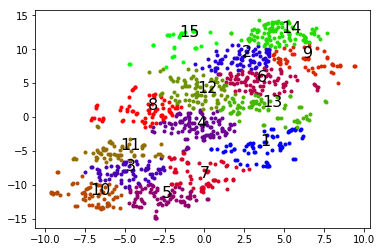

1:457
2:667
3:285
4:1046
5:36
6:976
7:50
8:930
9:833
10:185
11:240
12:707
13:518
14:748
15:384
16:394


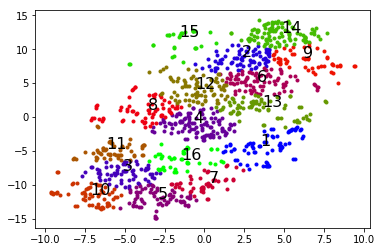

1:387
2:667
3:183
4:1029
5:36
6:976
7:54
8:930
9:833
10:185
11:241
12:707
13:570
14:748
15:384
16:150
17:434


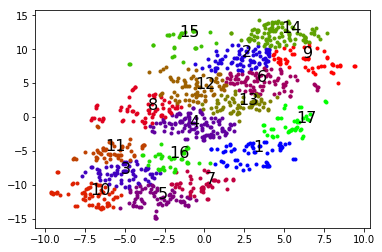

1:387
2:543
3:183
4:1029
5:36
6:913
7:54
8:930
9:698
10:185
11:240
12:707
13:570
14:770
15:384
16:392
17:465
18:432


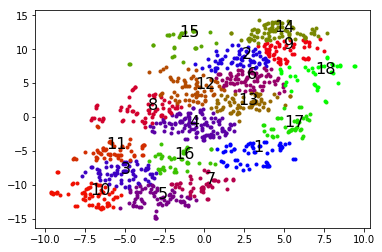

1:387
2:543
3:285
4:1048
5:36
6:608
7:54
8:561
9:832
10:185
11:255
12:707
13:569
14:770
15:384
16:150
17:465
18:432
19:955


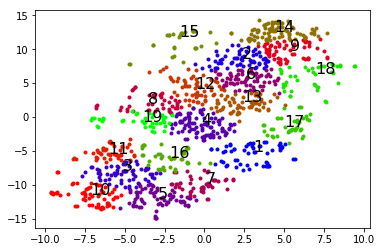

1:387
2:632
3:285
4:1048
5:36
6:976
7:54
8:561
9:698
10:185
11:255
12:666
13:570
14:770
15:384
16:150
17:434
18:433
19:953
20:530


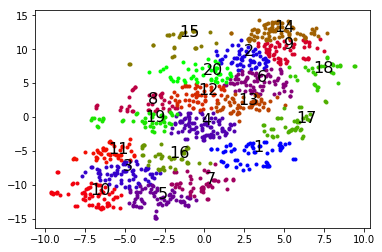

1:387
2:668
3:183
4:1052
5:36
6:569
7:748
8:956
9:185
10:656
11:622
12:236
13:392
14:384
15:53
16:927
17:465
18:978
19:600
20:1012
21:567


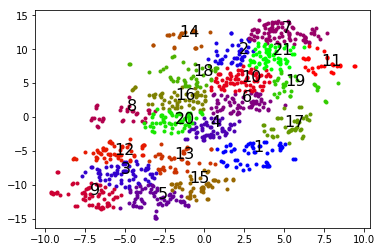

1:387
2:668
3:183
4:965
5:36
6:894
7:748
8:956
9:185
10:609
11:622
12:261
13:392
14:384
15:53
16:642
17:465
18:652
19:600
20:581
21:567
22:603


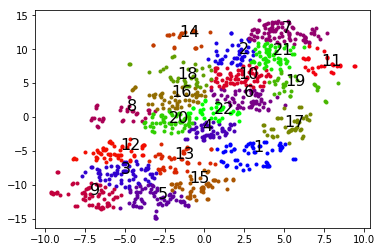

1:387
2:615
3:285
4:966
5:19
6:894
7:748
8:956
9:161
10:609
11:622
12:261
13:392
14:384
15:53
16:642
17:465
18:978
19:600
20:581
21:567
22:547
23:112


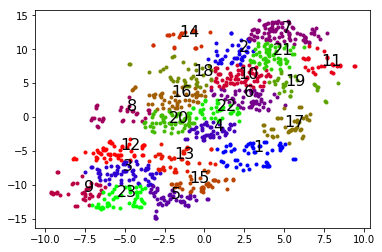

1:387
2:668
3:285
4:965
5:19
6:894
7:747
8:956
9:161
10:609
11:680
12:236
13:392
14:384
15:53
16:642
17:465
18:652
19:600
20:581
21:676
22:547
23:112
24:764


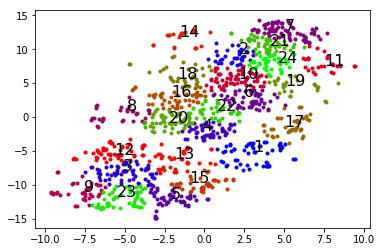

1:387
2:668
3:176
4:965
5:19
6:894
7:727
8:956
9:160
10:609
11:680
12:261
13:393
14:384
15:53
16:642
17:465
18:550
19:600
20:581
21:676
22:547
23:112
24:764
25:271


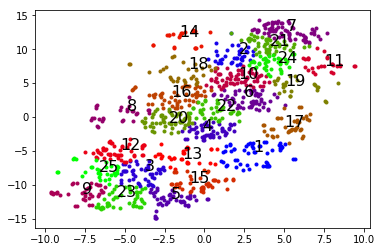

1:354
2:789
3:152
4:579
5:183
6:569
7:340
8:1054
9:736
10:255
11:384
12:46
13:465
14:818
15:622
16:734
17:560
18:1063
19:669
20:314
21:36
22:463
23:210
24:505
25:903
26:976


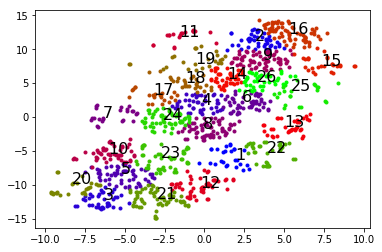

1:6
2:899
3:587
4:293
5:666
6:1056
7:463
8:88
9:384
10:935
11:745
12:888
13:162
14:254
15:465
16:926
17:492
18:149
19:553
20:1021
21:885
22:229
23:1045
24:15
25:243
26:809
27:154


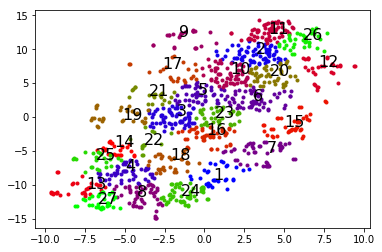

1:695
2:394
3:579
4:36
5:610
6:236
7:365
8:247
9:314
10:884
11:691
12:384
13:607
14:432
15:965
16:800
17:285
18:492
19:416
20:555
21:152
22:641
23:714
24:679
25:467
26:45
27:505
28:510


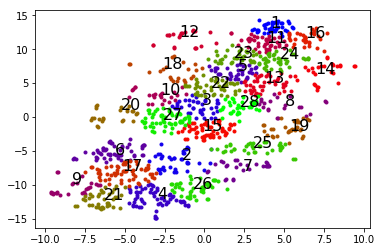

1:387
2:668
3:272
4:965
5:20
6:894
7:769
8:956
9:323
10:609
11:622
12:261
13:393
14:384
15:53
16:621
17:465
18:978
19:600
20:949
21:676
22:1044
23:87
24:911
25:151
26:152
27:613
28:811
29:304


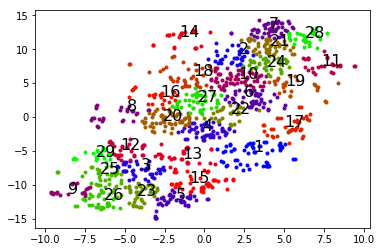

1:353
2:668
3:272
4:965
5:20
6:894
7:769
8:956
9:323
10:609
11:622
12:261
13:392
14:384
15:53
16:884
17:398
18:978
19:600
20:949
21:676
22:1002
23:87
24:911
25:151
26:152
27:613
28:811
29:304
30:472


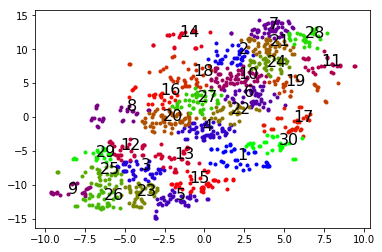

1:1035
2:168
3:756
4:318
5:738
6:465
7:152
8:600
9:336
10:502
11:384
12:36
13:825
14:355
15:512
16:236
17:560
18:1054
19:1063
20:622
21:457
22:161
23:777
24:695
25:714
26:568
27:1022
28:45
29:341
30:493
31:850


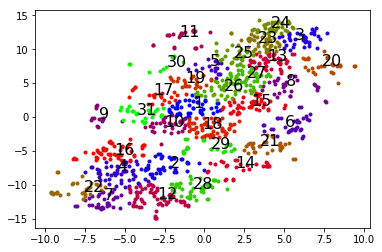

1:353
2:668
3:272
4:1047
5:20
6:894
7:769
8:555
9:323
10:609
11:622
12:261
13:392
14:384
15:53
16:884
17:398
18:652
19:600
20:920
21:676
22:1002
23:87
24:911
25:151
26:152
27:575
28:811
29:304
30:472
31:943
32:969


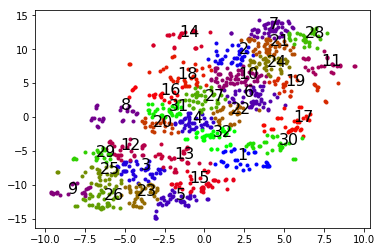

1:560
2:291
3:779
4:966
5:161
6:921
7:617
8:258
9:354
10:320
11:890
12:896
13:507
14:888
15:465
16:825
17:742
18:134
19:384
20:6
21:227
22:609
23:345
24:695
25:318
26:493
27:588
28:152
29:372
30:340
31:38
32:702
33:57


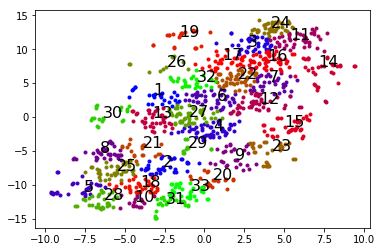

1:507
2:777
3:135
4:415
5:609
6:210
7:341
8:621
9:159
10:978
11:616
12:578
13:433
14:966
15:810
16:241
17:512
18:384
19:1031
20:375
21:47
22:332
23:318
24:320
25:695
26:605
27:60
28:97
29:457
30:340
31:154
32:14
33:461
34:742


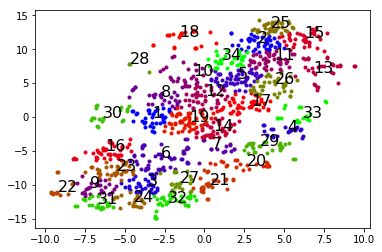

1:779
2:1043
3:77
4:935
5:249
6:456
7:1005
8:500
9:87
10:809
11:248
12:386
13:970
14:308
15:859
16:375
17:703
18:650
19:161
20:415
21:622
22:701
23:210
24:66
25:914
26:340
27:522
28:1040
29:154
30:626
31:460
32:25
33:852
34:383
35:560


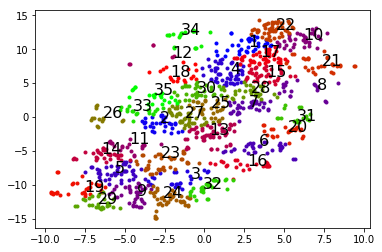

1:1063
2:341
3:161
4:774
5:1020
6:241
7:52
8:991
9:398
10:777
11:183
12:825
13:498
14:36
15:356
16:997
17:440
18:1036
19:627
20:966
21:810
22:292
23:610
24:26
25:506
26:579
27:154
28:457
29:1005
30:751
31:421
32:268
33:385
34:340
35:194
36:622


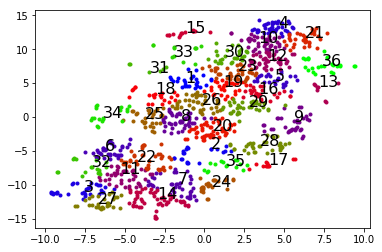

1:468
2:668
3:300
4:539
5:20
6:1056
7:701
8:851
9:323
10:1011
11:680
12:222
13:392
14:384
15:53
16:642
17:398
18:550
19:903
20:920
21:676
22:1002
23:103
24:764
25:151
26:350
27:579
28:811
29:308
30:448
31:943
32:969
33:375
34:154
35:484
36:788
37:336


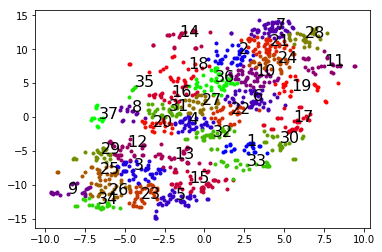

1:1008
2:149
3:672
4:691
5:154
6:903
7:261
8:462
9:33
10:383
11:415
12:710
13:969
14:680
15:268
16:306
17:987
18:156
19:78
20:555
21:799
22:135
23:96
24:615
25:253
26:459
27:1048
28:570
29:607
30:616
31:583
32:67
33:27
34:774
35:502
36:323
37:873
38:650


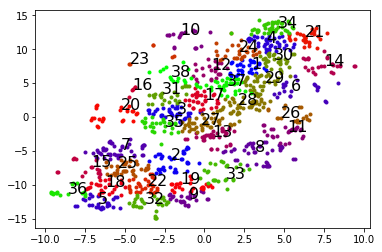

1:1061
2:54
3:714
4:336
5:342
6:154
7:1036
8:691
9:241
10:673
11:1000
12:622
13:415
14:525
15:319
16:23
17:384
18:962
19:958
20:460
21:798
22:97
23:457
24:717
25:283
26:323
27:995
28:375
29:534
30:695
31:671
32:550
33:292
34:903
35:1006
36:135
37:842
38:67
39:168


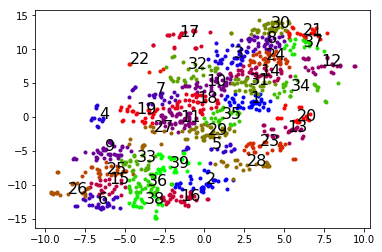

1:468
2:714
3:300
4:539
5:20
6:894
7:774
8:851
9:323
10:1011
11:765
12:261
13:392
14:384
15:78
16:642
17:465
18:550
19:486
20:920
21:678
22:1044
23:103
24:764
25:151
26:350
27:579
28:799
29:307
30:454
31:943
32:970
33:375
34:154
35:484
36:788
37:336
38:30
39:909
40:754


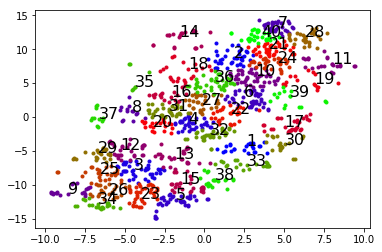

1:468
2:714
3:272
4:539
5:20
6:1056
7:774
8:851
9:323
10:524
11:680
12:261
13:392
14:384
15:53
16:642
17:465
18:550
19:486
20:920
21:678
22:1044
23:87
24:764
25:151
26:84
27:987
28:810
29:257
30:453
31:620
32:970
33:375
34:145
35:484
36:788
37:336
38:30
39:909
40:754
41:540


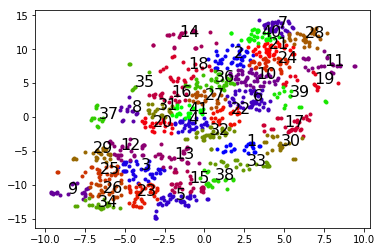

1:468
2:714
3:272
4:539
5:23
6:1056
7:774
8:851
9:323
10:524
11:680
12:261
13:392
14:384
15:53
16:642
17:465
18:550
19:486
20:920
21:678
22:1044
23:67
24:764
25:151
26:350
27:987
28:810
29:257
30:454
31:620
32:970
33:375
34:154
35:484
36:788
37:336
38:30
39:909
40:754
41:540
42:134


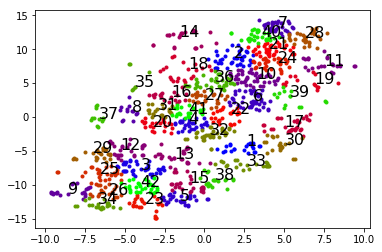

1:468
2:714
3:92
4:539
5:23
6:1056
7:774
8:956
9:323
10:524
11:680
12:245
13:393
14:384
15:53
16:642
17:465
18:493
19:486
20:1043
21:678
22:1044
23:67
24:764
25:151
26:350
27:987
28:800
29:308
30:453
31:620
32:970
33:375
34:154
35:305
36:788
37:336
38:30
39:909
40:754
41:540
42:135
43:299


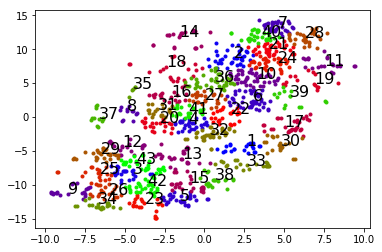

1:468
2:714
3:92
4:539
5:23
6:1056
7:774
8:851
9:323
10:524
11:680
12:244
13:168
14:384
15:53
16:878
17:465
18:550
19:601
20:920
21:678
22:1044
23:67
24:716
25:151
26:84
27:578
28:800
29:304
30:472
31:620
32:597
33:375
34:145
35:306
36:490
37:336
38:30
39:909
40:694
41:540
42:99
43:298
44:373


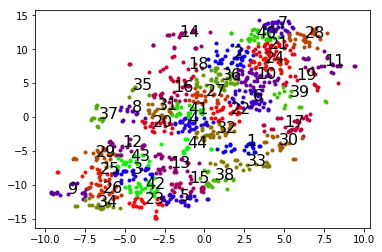

1:468
2:714
3:92
4:539
5:23
6:894
7:774
8:851
9:323
10:524
11:680
12:244
13:168
14:384
15:29
16:642
17:465
18:550
19:486
20:920
21:678
22:1044
23:67
24:764
25:151
26:84
27:987
28:800
29:304
30:472
31:620
32:919
33:375
34:145
35:305
36:788
37:336
38:48
39:909
40:754
41:540
42:99
43:298
44:372
45:55


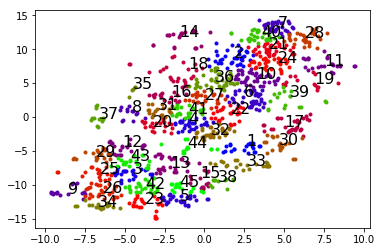

1:468
2:714
3:92
4:539
5:23
6:894
7:774
8:851
9:332
10:524
11:765
12:244
13:168
14:384
15:50
16:878
17:465
18:550
19:601
20:979
21:704
22:1044
23:67
24:741
25:151
26:81
27:578
28:799
29:308
30:472
31:620
32:597
33:375
34:145
35:484
36:788
37:336
38:49
39:909
40:754
41:540
42:99
43:298
44:373
45:55
46:700


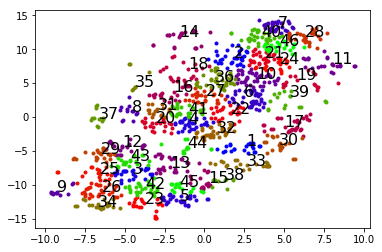

1:505
2:811
3:202
4:1061
5:427
6:367
7:156
8:615
9:671
10:923
11:226
12:416
13:17
14:970
15:242
16:665
17:987
18:545
19:283
20:54
21:356
22:154
23:1031
24:194
25:499
26:461
27:323
28:774
29:736
30:1063
31:393
32:10
33:336
34:421
35:730
36:885
37:859
38:514
39:680
40:627
41:219
42:104
43:1006
44:898
45:446
46:958
47:472


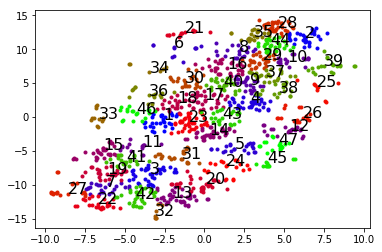

1:586
2:178
3:632
4:415
5:154
6:810
7:919
8:367
9:296
10:20
11:956
12:976
13:47
14:499
15:777
16:234
17:241
18:331
19:356
20:1063
21:375
22:895
23:560
24:975
25:873
26:920
27:718
28:468
29:701
30:157
31:134
32:680
33:464
34:421
35:78
36:341
37:512
38:461
39:860
40:10
41:1062
42:320
43:270
44:864
45:349
46:1031
47:286
48:659


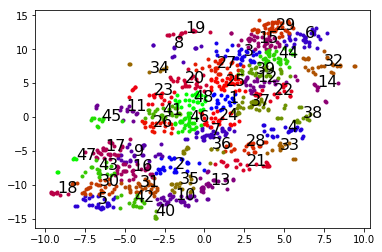

1:468
2:668
3:92
4:539
5:23
6:894
7:774
8:851
9:332
10:527
11:765
12:222
13:168
14:384
15:29
16:642
17:465
18:492
19:486
20:1043
21:758
22:1044
23:67
24:923
25:151
26:81
27:987
28:799
29:308
30:472
31:620
32:919
33:352
34:145
35:305
36:788
37:336
38:48
39:909
40:694
41:540
42:99
43:292
44:373
45:55
46:802
47:1
48:912
49:929


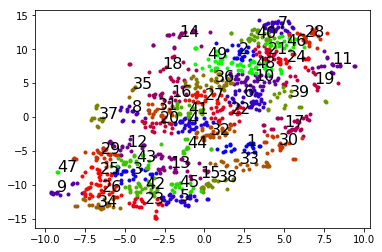

1:468
2:668
3:92
4:539
5:23
6:894
7:774
8:851
9:332
10:524
11:765
12:222
13:168
14:384
15:29
16:621
17:465
18:493
19:601
20:920
21:758
22:1044
23:67
24:923
25:151
26:85
27:578
28:799
29:308
30:472
31:620
32:597
33:375
34:154
35:306
36:490
37:336
38:47
39:909
40:694
41:540
42:99
43:298
44:373
45:55
46:802
47:1
48:900
49:644
50:1063


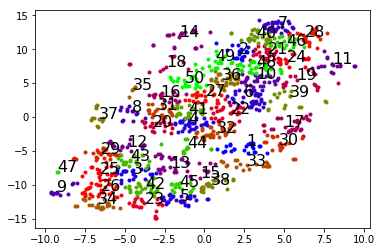

1:764


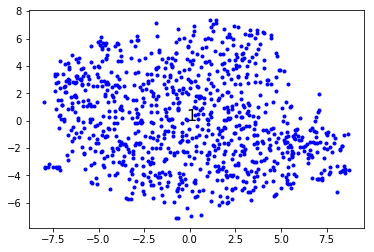

1:108
2:608


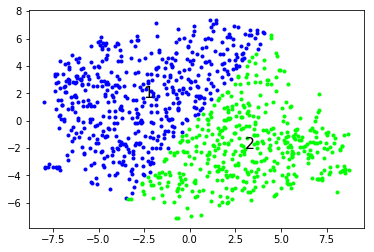

1:809
2:268
3:209


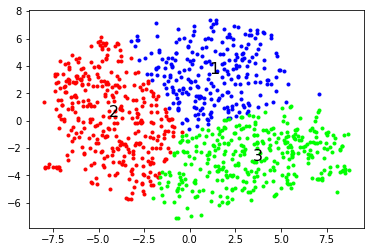

1:750
2:325
3:99
4:278


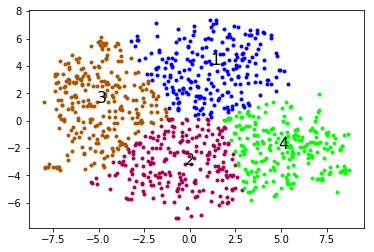

1:90
2:599
3:910
4:427
5:652


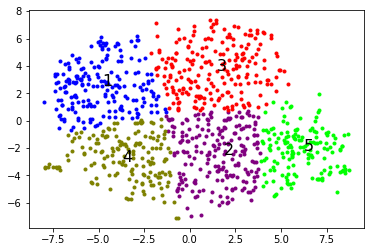

1:837
2:283
3:750
4:374
5:652
6:495


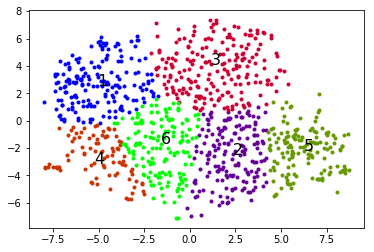

1:664
2:240
3:142
4:768
5:749
6:554
7:436


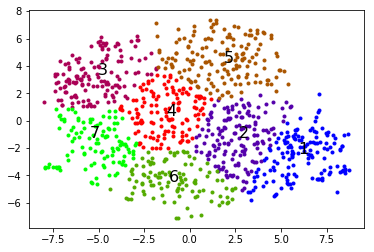

1:495
2:62
3:838
4:300
5:441
6:438
7:637
8:92


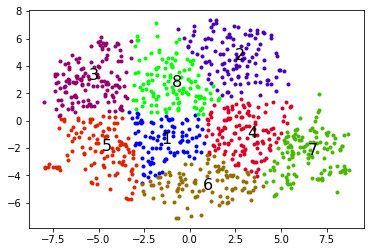

1:838
2:574
3:893
4:680
5:367
6:648
7:881
8:780
9:334


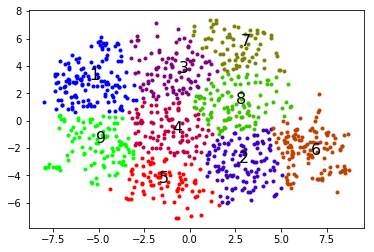

1:838
2:574
3:736
4:680
5:367
6:648
7:872
8:780
9:334
10:151


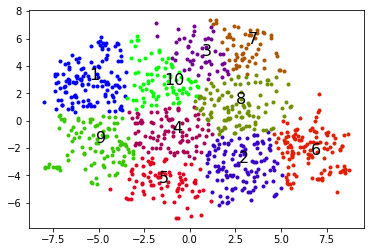

1:838
2:461
3:736
4:680
5:367
6:875
7:872
8:780
9:334
10:148
11:595


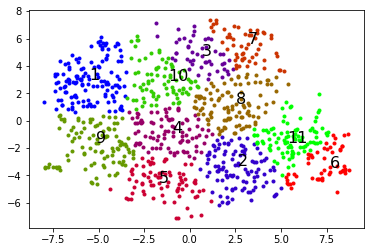

1:814
2:650
3:878
4:51
5:364
6:93
7:436
8:824
9:352
10:67
11:550
12:346


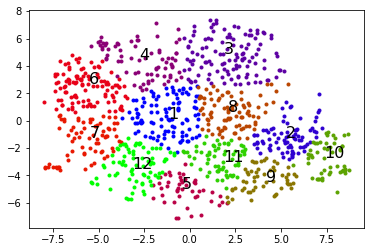

1:578
2:102
3:886
4:638
5:332
6:847
7:21
8:827
9:487
10:636
11:280
12:363
13:180


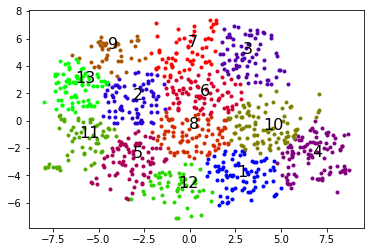

1:218
2:805
3:442
4:930
5:8
6:554
7:481
8:263
9:651
10:613
11:21
12:304
13:578
14:155


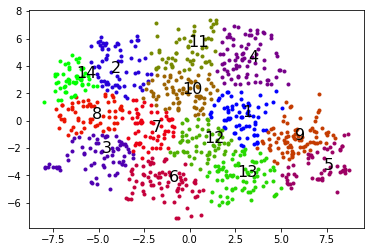

1:602
2:635
3:168
4:351
5:52
6:360
7:776
8:913
9:566
10:648
11:289
12:93
13:935
14:771
15:379


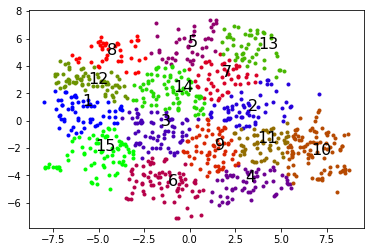

1:246
2:154
3:887
4:373
5:660
6:650
7:680
8:428
9:554
10:900
11:67
12:733
13:169
14:316
15:913
16:488


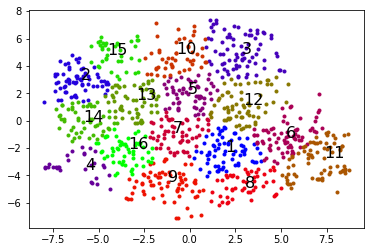

1:119
2:565
3:910
4:203
5:394
6:67
7:872
8:834
9:337
10:92
11:595
12:481
13:923
14:901
15:448
16:36
17:438


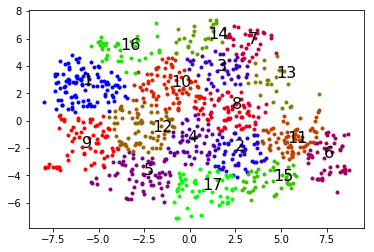

1:119
2:565
3:910
4:203
5:394
6:67
7:872
8:824
9:337
10:92
11:596
12:481
13:921
14:896
15:448
16:36
17:438
18:229


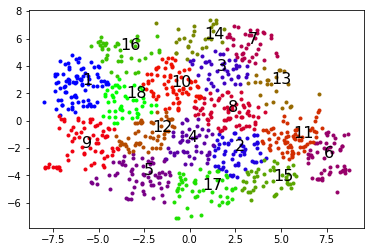

1:119
2:565
3:910
4:203
5:394
6:67
7:872
8:834
9:437
10:92
11:596
12:481
13:921
14:896
15:448
16:36
17:438
18:102
19:373


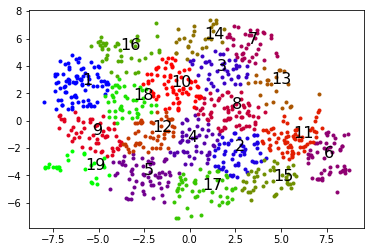

1:757
2:227
3:95
4:360
5:929
6:707
7:704
8:39
9:875
10:678
11:32
12:437
13:556
14:843
15:831
16:373
17:310
18:842
19:567
20:915


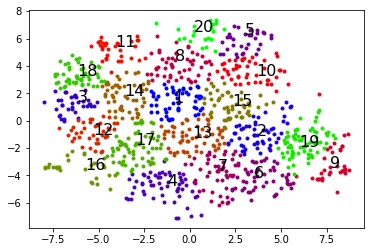

1:767
2:283
3:898
4:202
5:344
6:67
7:470
8:678
9:218
10:823
11:12
12:933
13:265
14:501
15:418
16:352
17:32
18:281
19:822
20:596
21:675


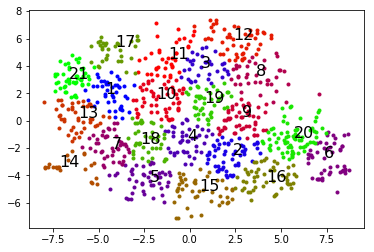

1:767
2:550
3:898
4:204
5:375
6:67
7:470
8:678
9:635
10:235
11:10
12:933
13:265
14:501
15:418
16:352
17:32
18:491
19:129
20:596
21:675
22:621


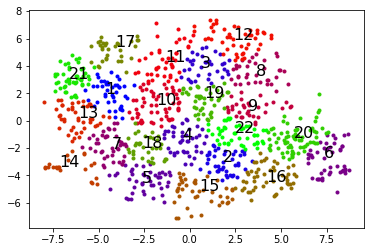

1:767
2:550
3:898
4:204
5:375
6:875
7:470
8:42
9:635
10:235
11:38
12:880
13:265
14:501
15:418
16:352
17:32
18:491
19:822
20:651
21:675
22:621
23:896


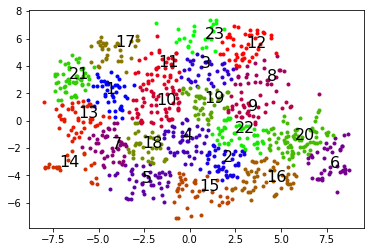

1:767
2:550
3:898
4:859
5:375
6:875
7:470
8:42
9:635
10:614
11:912
12:880
13:265
14:501
15:418
16:352
17:32
18:281
19:135
20:651
21:675
22:594
23:896
24:173


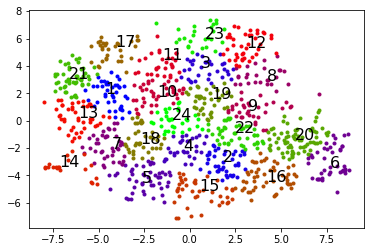

1:767
2:550
3:750
4:859
5:375
6:875
7:470
8:40
9:635
10:287
11:38
12:872
13:265
14:501
15:418
16:352
17:32
18:491
19:135
20:651
21:802
22:594
23:31
24:690
25:821


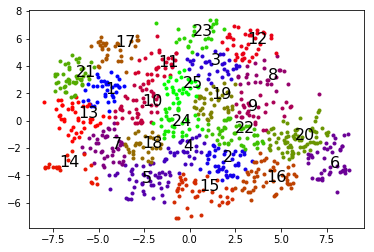

1:767
2:550
3:750
4:859
5:344
6:67
7:335
8:40
9:841
10:287
11:38
12:872
13:265
14:503
15:418
16:352
17:32
18:491
19:135
20:596
21:675
22:594
23:31
24:690
25:620
26:273


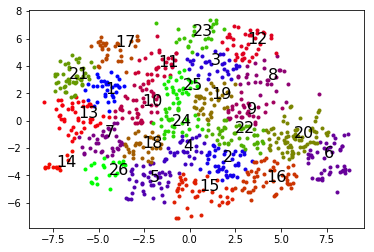

1:767
2:550
3:750
4:859
5:539
6:67
7:335
8:40
9:635
10:172
11:10
12:872
13:265
14:503
15:438
16:352
17:32
18:298
19:135
20:596
21:802
22:594
23:31
24:173
25:821
26:273
27:466


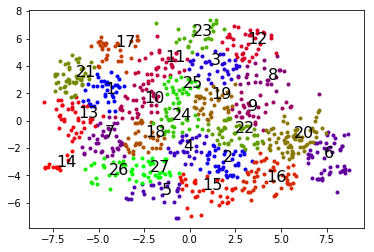

1:767
2:550
3:750
4:859
5:539
6:67
7:335
8:40
9:635
10:633
11:12
12:872
13:265
14:503
15:438
16:352
17:32
18:281
19:135
20:596
21:802
22:594
23:906
24:681
25:821
26:273
27:466
28:121


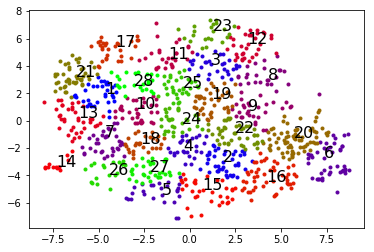

1:767
2:550
3:750
4:722
5:292
6:67
7:335
8:40
9:635
10:657
11:12
12:872
13:265
14:503
15:438
16:352
17:32
18:299
19:135
20:596
21:675
22:594
23:906
24:173
25:821
26:387
27:405
28:116
29:327


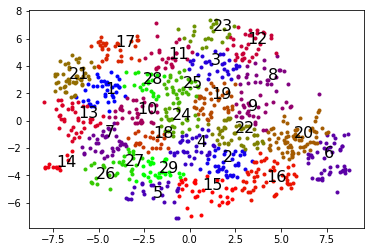

1:767
2:550
3:750
4:722
5:539
6:623
7:470
8:40
9:760
10:657
11:12
12:872
13:265
14:501
15:438
16:352
17:32
18:299
19:761
20:658
21:675
22:594
23:80
24:681
25:620
26:387
27:405
28:85
29:327
30:724


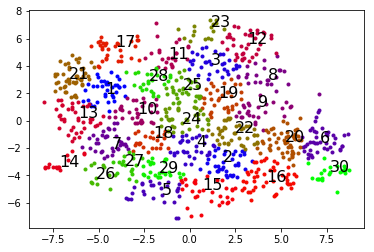

1:90
2:550
3:750
4:722
5:539
6:623
7:470
8:40
9:635
10:165
11:12
12:872
13:265
14:503
15:438
16:352
17:32
18:299
19:619
20:658
21:802
22:594
23:906
24:482
25:620
26:387
27:359
28:117
29:327
30:724
31:731


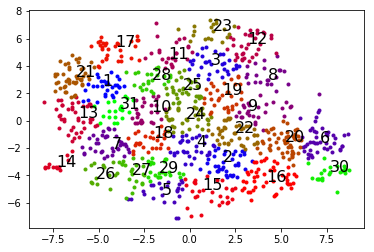

1:90
2:550
3:750
4:203
5:360
6:623
7:470
8:40
9:635
10:165
11:12
12:872
13:265
14:503
15:438
16:351
17:32
18:269
19:619
20:199
21:802
22:594
23:906
24:482
25:620
26:273
27:353
28:85
29:453
30:724
31:731
32:696


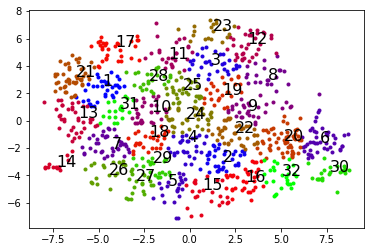

1:90
2:550
3:45
4:203
5:292
6:623
7:470
8:678
9:88
10:165
11:12
12:872
13:265
14:501
15:418
16:351
17:32
18:299
19:619
20:198
21:802
22:621
23:906
24:482
25:620
26:387
27:508
28:85
29:453
30:724
31:676
32:696
33:744


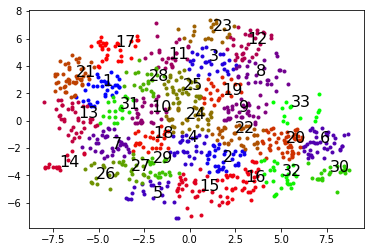

1:837
2:550
3:750
4:859
5:292
6:623
7:470
8:678
9:88
10:165
11:925
12:872
13:265
14:503
15:418
16:351
17:32
18:281
19:619
20:665
21:802
22:616
23:906
24:681
25:620
26:273
27:359
28:117
29:453
30:724
31:500
32:696
33:745
34:227


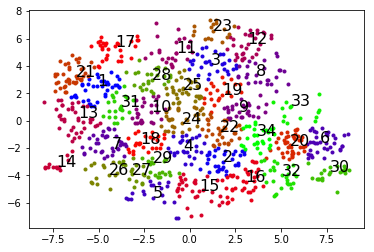

1:837
2:550
3:45
4:203
5:292
6:623
7:470
8:678
9:88
10:165
11:12
12:872
13:265
14:503
15:425
16:164
17:32
18:269
19:619
20:665
21:802
22:616
23:80
24:681
25:620
26:387
27:412
28:85
29:327
30:724
31:676
32:696
33:744
34:227
35:537


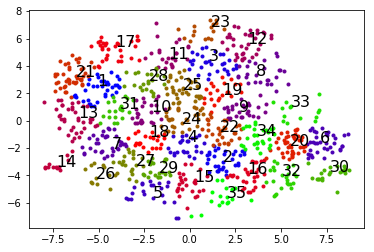

1:753
2:550
3:50
4:203
5:292
6:623
7:470
8:40
9:88
10:165
11:12
12:69
13:265
14:503
15:425
16:164
17:32
18:269
19:135
20:665
21:675
22:616
23:906
24:681
25:821
26:387
27:346
28:116
29:327
30:724
31:500
32:696
33:936
34:227
35:537
36:775


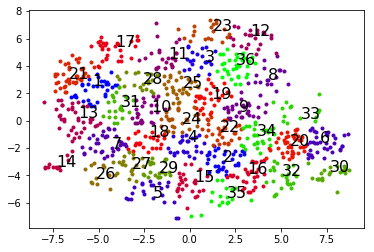

1:837
2:565
3:50
4:203
5:539
6:623
7:345
8:40
9:88
10:165
11:12
12:69
13:265
14:503
15:401
16:707
17:32
18:281
19:135
20:665
21:802
22:615
23:906
24:681
25:821
26:273
27:353
28:116
29:453
30:724
31:500
32:696
33:936
34:227
35:537
36:775
37:560


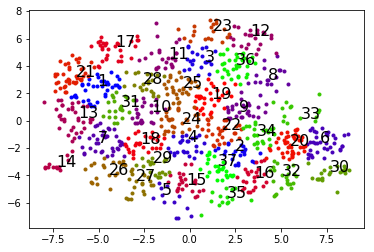

1:767
2:283
3:50
4:859
5:292
6:623
7:470
8:40
9:88
10:165
11:12
12:69
13:234
14:503
15:401
16:707
17:32
18:269
19:619
20:665
21:109
22:615
23:906
24:681
25:620
26:387
27:346
28:85
29:327
30:724
31:731
32:696
33:744
34:227
35:537
36:775
37:563
38:157


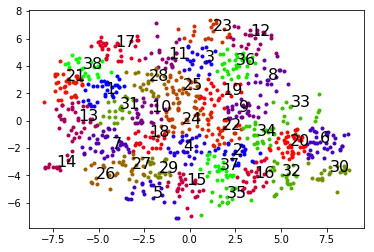

1:767
2:246
3:50
4:859
5:292
6:623
7:470
8:40
9:88
10:165
11:12
12:69
13:265
14:503
15:401
16:707
17:32
18:281
19:619
20:665
21:123
22:176
23:906
24:815
25:620
26:273
27:359
28:85
29:453
30:724
31:676
32:696
33:744
34:227
35:537
36:62
37:563
38:132
39:627


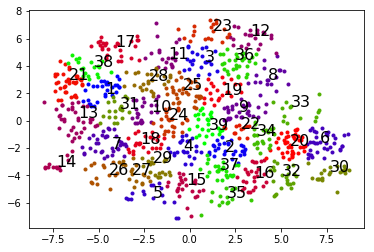

1:767
2:246
3:50
4:859
5:292
6:623
7:470
8:40
9:88
10:823
11:10
12:68
13:265
14:503
15:401
16:707
17:32
18:298
19:619
20:665
21:118
22:300
23:906
24:173
25:620
26:387
27:405
28:116
29:466
30:902
31:175
32:696
33:744
34:208
35:537
36:62
37:563
38:157
39:627
40:709


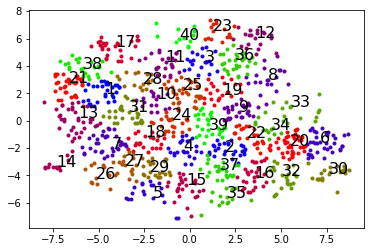

1:837
2:565
3:50
4:859
5:543
6:623
7:572
8:40
9:88
10:165
11:10
12:68
13:267
14:503
15:401
16:707
17:32
18:269
19:619
20:665
21:118
22:300
23:906
24:173
25:620
26:387
27:375
28:116
29:445
30:724
31:731
32:696
33:812
34:631
35:537
36:62
37:563
38:157
39:627
40:709
41:437


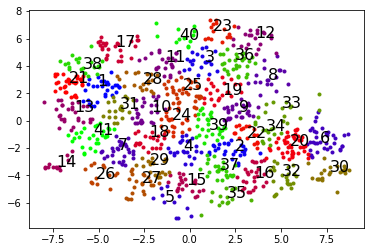

1:90
2:283
3:50
4:859
5:292
6:623
7:311
8:40
9:88
10:233
11:10
12:68
13:267
14:503
15:401
16:707
17:32
18:269
19:619
20:665
21:123
22:621
23:906
24:173
25:620
26:387
27:508
28:116
29:466
30:724
31:175
32:696
33:812
34:227
35:537
36:62
37:563
38:917
39:627
40:709
41:437
42:99


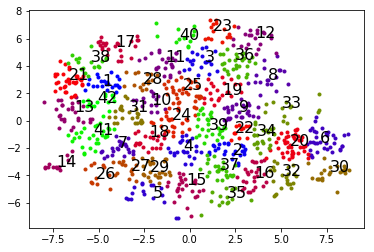

1:754
2:594
3:387
4:68
5:12
6:428
7:496
8:555
9:355
10:488
11:29
12:46
13:782
14:544
15:101
16:635
17:523
18:816
19:286
20:755
21:502
22:466
23:722
24:234
25:120
26:906
27:771
28:931
29:19
30:285
31:36
32:161
33:532
34:696
35:418
36:65
37:744
38:619
39:44
40:94
41:185
42:334
43:563


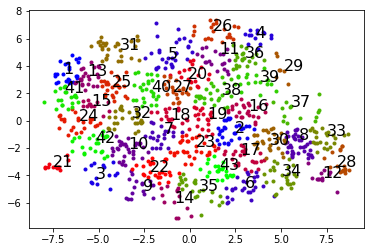

1:171
2:246
3:50
4:859
5:292
6:623
7:311
8:40
9:88
10:233
11:10
12:929
13:234
14:503
15:561
16:341
17:28
18:269
19:619
20:665
21:802
22:176
23:80
24:690
25:620
26:387
27:405
28:116
29:466
30:902
31:161
32:696
33:744
34:227
35:404
36:62
37:563
38:15
39:627
40:709
41:264
42:99
43:868
44:190


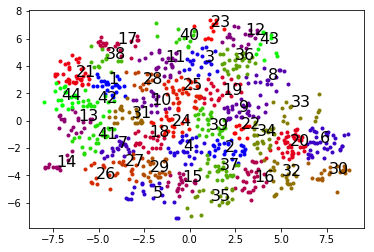

1:171
2:565
3:50
4:585
5:292
6:83
7:311
8:40
9:88
10:233
11:10
12:933
13:234
14:503
15:561
16:707
17:28
18:269
19:619
20:245
21:802
22:621
23:80
24:173
25:620
26:387
27:405
28:116
29:466
30:724
31:161
32:725
33:812
34:227
35:404
36:775
37:563
38:15
39:627
40:709
41:264
42:99
43:868
44:185
45:212


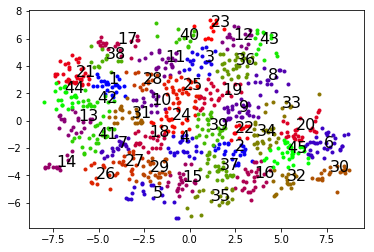

1:171
2:565
3:50
4:570
5:292
6:672
7:470
8:40
9:88
10:233
11:912
12:933
13:234
14:501
15:561
16:707
17:28
18:471
19:3
20:245
21:802
22:240
23:80
24:482
25:821
26:387
27:405
28:116
29:466
30:724
31:161
32:725
33:812
34:636
35:404
36:62
37:563
38:15
39:627
40:709
41:264
42:99
43:868
44:185
45:212
46:592


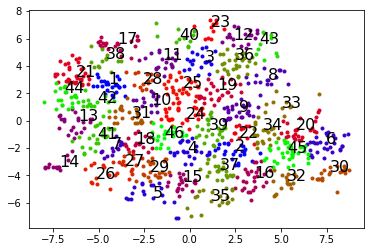

1:906
2:566
3:549
4:245
5:127
6:338
7:308
8:68
9:352
10:692
11:366
12:735
13:88
14:802
15:757
16:779
17:538
18:490
19:184
20:502
21:924
22:916
23:25
24:301
25:487
26:234
27:436
28:84
29:387
30:680
31:597
32:364
33:627
34:563
35:29
36:672
37:332
38:212
39:740
40:324
41:619
42:145
43:743
44:709
45:23
46:877
47:377


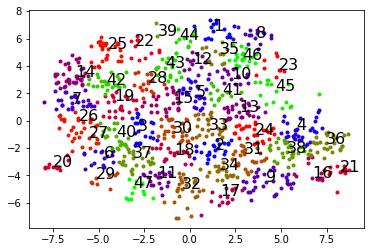

1:171
2:565
3:50
4:575
5:292
6:672
7:311
8:44
9:88
10:233
11:912
12:762
13:234
14:503
15:561
16:707
17:28
18:571
19:3
20:245
21:802
22:621
23:80
24:815
25:821
26:387
27:405
28:85
29:466
30:724
31:161
32:725
33:746
34:227
35:538
36:775
37:560
38:15
39:627
40:709
41:264
42:99
43:20
44:190
45:653
46:592
47:68
48:769


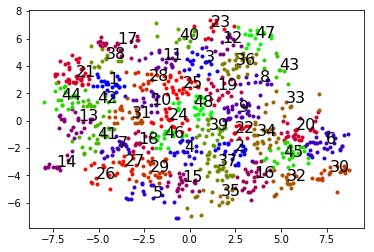

1:171
2:283
3:50
4:570
5:355
6:672
7:311
8:44
9:88
10:233
11:912
12:35
13:234
14:503
15:561
16:351
17:32
18:281
19:619
20:66
21:802
22:668
23:906
24:815
25:821
26:387
27:405
28:85
29:445
30:724
31:161
32:725
33:746
34:604
35:404
36:775
37:563
38:917
39:627
40:709
41:264
42:99
43:20
44:190
45:640
46:592
47:68
48:769
49:285


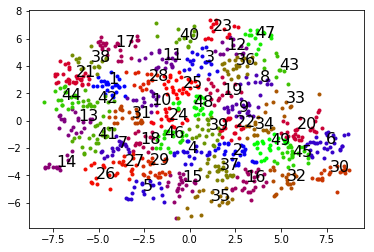

1:171
2:283
3:50
4:570
5:355
6:672
7:311
8:44
9:88
10:233
11:912
12:35
13:540
14:501
15:561
16:351
17:32
18:281
19:619
20:66
21:842
22:670
23:906
24:815
25:821
26:387
27:405
28:116
29:453
30:724
31:161
32:725
33:150
34:604
35:404
36:775
37:704
38:917
39:627
40:709
41:264
42:106
43:19
44:107
45:586
46:592
47:68
48:769
49:285
50:95


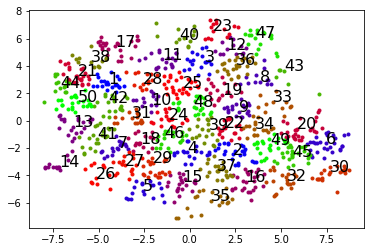

In [22]:
#ノイズ処理済みの3つのインバータ音声データに対し，
#50個のクラスタを分割
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

func.save_tsne_result(ceps6000, "./npys_tsne/tsne_rem_6000", perNum=100)
clusta_leader6000 = func.plot_clusta("./npys_tsne/tsne_rem_6000.npy", numClusta=50)

func.save_tsne_result(ceps1000, "./npys_tsne/tsne_rem_1000", perNum=100)
clusta_leader1000 = func.plot_clusta("./npys_tsne/tsne_rem_1000.npy", numClusta=50)

func.save_tsne_result(ceps209, "./npys_tsne/tsne_rem_209", perNum=100)
clusta_leader209 = func.plot_clusta("./npys_tsne/tsne_rem_209.npy", numClusta=50)

In [23]:
#各クラスタリーダーのcepstrum波形を比較し相関値を求める（0.9はデータを見ながら感覚的に決めた）
#戻り値は shape = (ceps1の該当クラスタ番号, ceps2の該当クラスタ番号，coef)
#6000と1000，6000と209のセットで確認する
Threshold = 0.9 #相関係数の閾値
srv_6000_1000 = func.clusta_coefficient(ceps6000, ceps1000, clusta_leader6000, clusta_leader1000, Threshold, plot_figure = False)
srv_6000_209 = func.clusta_coefficient(ceps6000, ceps209, clusta_leader6000, clusta_leader209, Threshold, plot_figure = False)

In [24]:
#srv_clstには，閾値を良インバータ共に超えたクラスタ番号だけを格納
#not_srv_clstには，そうではないものを格納
srv_clst = []
not_srv_clst = []
for i in np.unique(np.array(srv_6000_1000)[np.array(srv_6000_1000)[:,2]>=Threshold][:,0]):
    if i in np.unique(np.array(srv_6000_209)[np.array(srv_6000_209)[:,2]>=Threshold][:,0]):
        srv_clst.append(int(i))

for i in np.arange(1,51):
    if i not in srv_clst:
        not_srv_clst.append(i)

In [26]:
#低い相関だったクラスタを除去
#rem_rem_は，ノイズと低相関のクラスタをremoveしたという意味
#(良い変数名が思いつかなかったので適当に)
a,b,c = func.calculate_clusta("./npys_tsne/tsne_rem_6000.npy", numClusta=50)
rem_rem_stft6000 = func.remove_noise(stft6000, a, b, not_srv_clst)

(1025, 1860)
(47,)
(35,)
(34,)
(44,)
(36,)
(37,)
(26,)
(25,)
(38,)
(22,)
(41,)
(42,)
(23,)
(28,)
(25,)
(64,)
(35,)
(46,)
(55,)
(33,)
(54,)
(35,)
(10,)
(47,)
(882,)
(1025, 978)


1:766


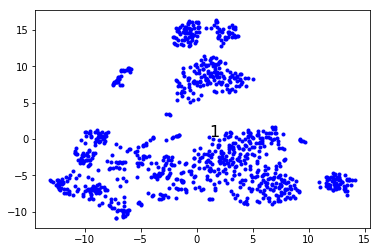

1:151
2:688


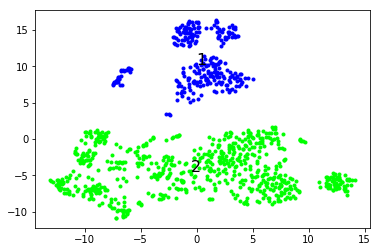

1:636
2:340
3:835


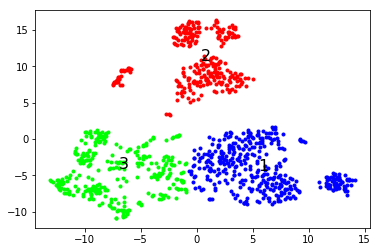

1:838
2:283
3:340
4:689


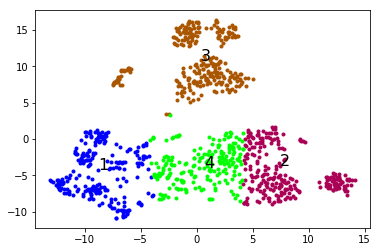

1:405
2:342
3:789
4:304
5:508


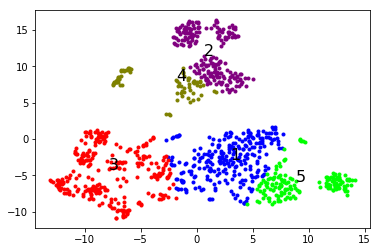

1:970
2:666
3:297
4:342
5:510
6:906


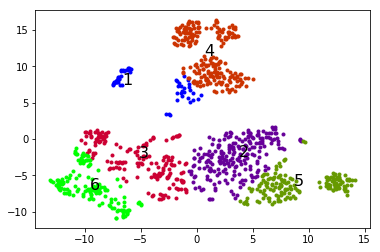

1:275
2:67
3:895
4:23
5:484
6:365
7:237


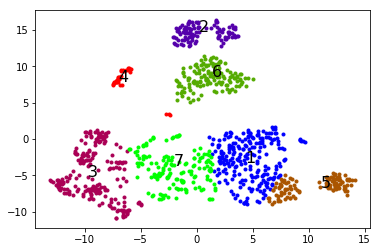

1:758
2:67
3:911
4:493
5:896
6:606
7:325
8:582


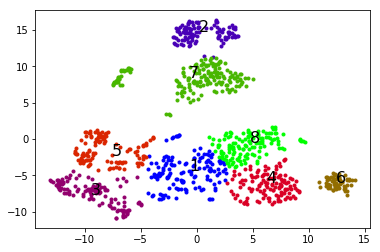

1:495
2:931
3:375
4:442
5:19
6:67
7:911
8:236
9:526


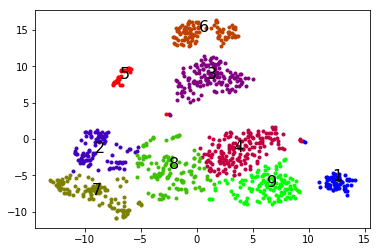

1:911
2:67
3:526
4:434
5:961
6:375
7:606
8:3
9:765
10:256


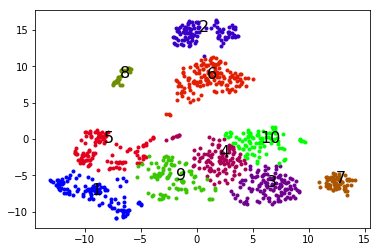

1:492
2:335
3:931
4:19
5:687
6:375
7:606
8:911
9:256
10:414
11:113


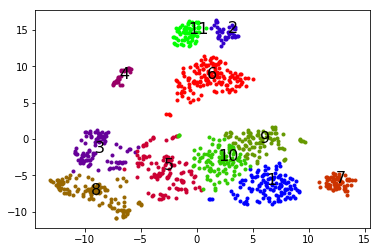

1:375
2:446
3:931
4:526
5:79
6:925
7:256
8:606
9:825
10:722
11:147
12:3


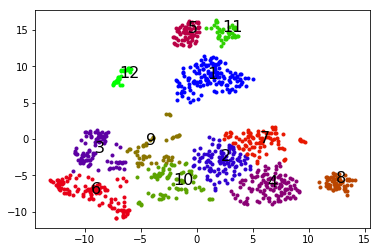

1:526
2:335
3:931
4:3
5:762
6:188
7:606
8:911
9:256
10:446
11:113
12:302
13:825


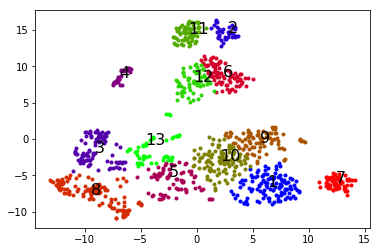

1:492
2:335
3:793
4:19
5:762
6:188
7:506
8:848
9:458
10:414
11:113
12:366
13:870
14:961


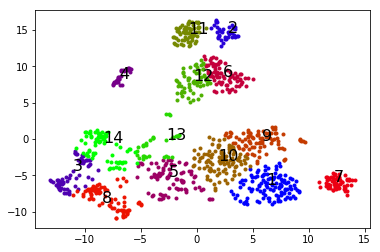

1:455
2:335
3:793
4:19
5:762
6:378
7:606
8:848
9:458
10:434
11:113
12:366
13:870
14:961
15:519


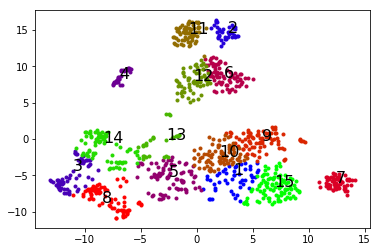

1:606
2:722
3:113
4:256
5:966
6:187
7:850
8:626
9:479
10:19
11:147
12:741
13:840
14:921
15:434
16:516


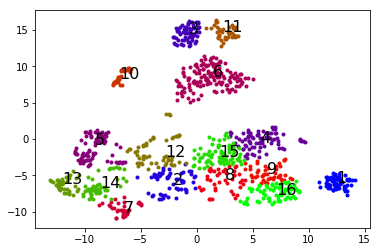

1:79
2:745
3:549
4:187
5:258
6:840
7:3
8:812
9:932
10:606
11:719
12:624
13:470
14:335
15:241
16:950
17:870


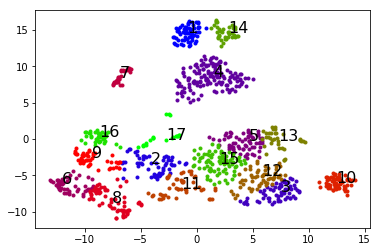

1:610
2:3
3:825
4:147
5:951
6:932
7:606
8:368
9:330
10:856
11:79
12:406
13:926
14:348
15:249
16:717
17:840
18:690


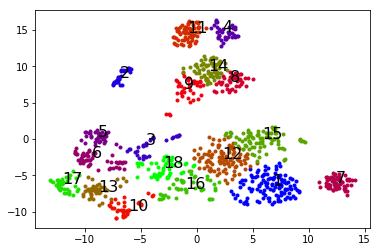

1:840
2:670
3:79
4:516
5:370
6:764
7:951
8:606
9:3
10:624
11:813
12:821
13:438
14:240
15:926
16:932
17:147
18:182
19:470


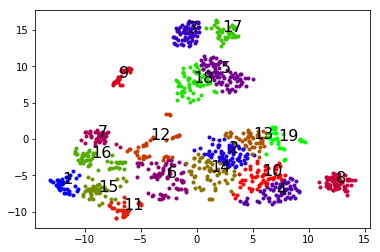

1:792
2:366
3:624
4:606
5:926
6:335
7:19
8:253
9:710
10:79
11:840
12:238
13:549
14:957
15:465
16:850
17:738
18:647
19:378
20:824


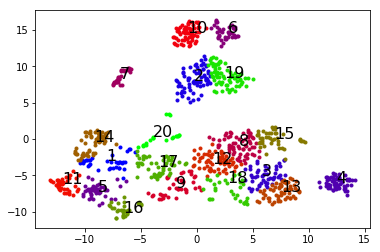

1:576
2:147
3:939
4:713
5:366
6:606
7:439
8:19
9:744
10:919
11:951
12:604
13:113
14:247
15:840
16:381
17:870
18:727
19:783
20:850
21:435


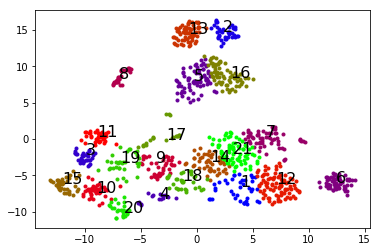

1:580
2:147
3:46
4:713
5:348
6:606
7:439
8:3
9:690
10:928
11:951
12:514
13:79
14:247
15:840
16:368
17:824
18:637
19:781
20:853
21:442
22:186


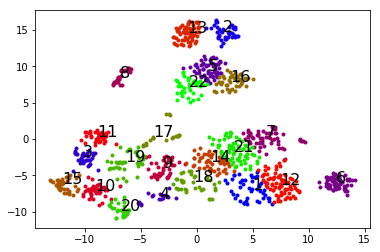

1:496
2:210
3:840
4:147
5:782
6:639
7:19
8:606
9:415
10:250
11:951
12:364
13:79
14:813
15:368
16:821
17:919
18:46
19:435
20:611
21:756
22:169
23:687


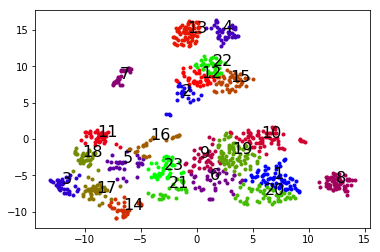

1:79
2:540
3:919
4:821
5:344
6:606
7:262
8:756
9:147
10:813
11:3
12:348
13:951
14:414
15:46
16:368
17:782
18:840
19:584
20:690
21:549
22:639
23:430
24:615


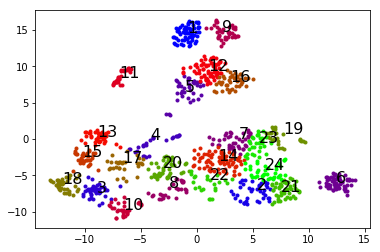

1:414
2:186
3:926
4:606
5:277
6:147
7:938
8:747
9:276
10:5
11:348
12:639
13:554
14:79
15:870
16:368
17:813
18:781
19:482
20:262
21:840
22:951
23:496
24:722
25:21


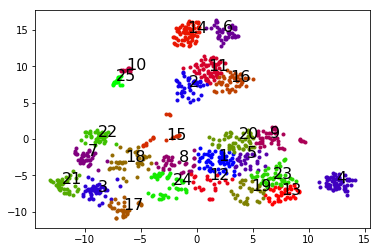

1:659
2:147
3:46
4:753
5:364
6:606
7:249
8:3
9:690
10:928
11:951
12:472
13:89
14:247
15:840
16:216
17:870
18:768
19:781
20:853
21:280
22:344
23:70
24:170
25:572
26:516


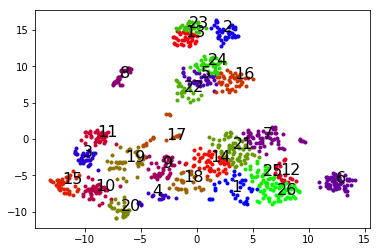

1:68
2:428
3:840
4:606
5:348
6:456
7:864
8:3
9:785
10:813
11:464
12:479
13:335
14:549
15:258
16:482
17:201
18:295
19:759
20:46
21:579
22:919
23:951
24:731
25:118
26:219
27:330


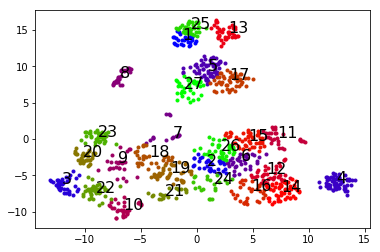

1:418
2:5
3:754
4:79
5:186
6:608
7:46
8:690
9:479
10:840
11:723
12:606
13:812
14:147
15:860
16:951
17:445
18:339
19:870
20:665
21:230
22:466
23:528
24:289
25:201
26:928
27:21
28:781


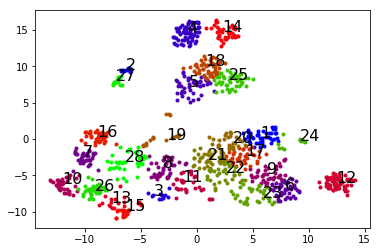

1:813
2:169
3:277
4:3
5:939
6:554
7:79
8:234
9:870
10:606
11:438
12:926
13:482
14:223
15:301
16:335
17:883
18:739
19:781
20:655
21:840
22:455
23:951
24:763
25:473
26:630
27:368
28:661
29:579


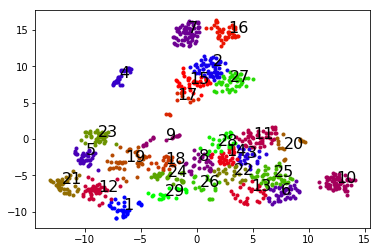

1:186
2:558
3:917
4:482
5:254
6:79
7:836
8:3
9:412
10:711
11:864
12:606
13:147
14:202
15:473
16:639
17:840
18:951
19:46
20:874
21:367
22:818
23:862
24:693
25:284
26:687
27:318
28:860
29:719
30:415


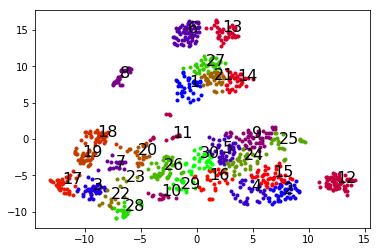

In [27]:
#初期値依存性に対する対策（今回は取りうるf0を元に30クラスタにしている）
rem_rem_ceps6000 = func.extract_ceps(rem_rem_stft6000)
func.save_tsne_result(rem_rem_ceps6000, "./npys_tsne/tsne_rem_rem_6000", perNum=100)
rem_rem_clusta_leader6000 = func.plot_clusta("./npys_tsne/tsne_rem_rem_6000.npy", numClusta=30)

In [57]:
#これらの処理をいちいちやり直すのは面倒臭いので，保存
for i in range(30):
    one = rem_rem_stft6000[:,rem_rem_clusta_leader6000[i]]
    np.save('./npys/rem_common_for_basis_30_'+str(i)+".npy", one)

In [44]:
np.save("./rem_rem_stft6000",rem_rem_stft6000)

In [3]:
rem_rem_stft6000 = np.load("./rem_rem_stft6000.npy")

# これ以下は従来同様の処理（音源分離精度の比較）

In [1]:
import numpy as np
import pandas as pd
import librosa
import os
import scipy
import pickle
import random
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from copy import deepcopy
from sep import Functions
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from IPython.display import display, Audio
import mir_eval
%matplotlib inline

In [4]:
#初期値を調波構造を持つように設定
#rem_rem_stft6000 = np.load("./rem_rem_stft6000.npy")
init_F = []
for i in range(30):
    init_F.append(np.load('./npys/rem_common_for_basis_30_'+str(i)+".npy"))
init_F = np.array(init_F)
# F.shape=(30, 1025)
init_G = np.random.rand(init_F.T.shape[1], rem_rem_stft6000.shape[1])

In [5]:
def time_norm(s_inv, s_veh):
    len_min = min([len(s_veh), len(s_inv)])
    s_inv = s_inv[:len_min]
    s_veh = s_veh[:len_min]
    return s_inv, s_veh

def eval_mir(est_inv, est_veh, s_inv_re, s_veh_re):    
    (sdr, sir, sar, perm) = mir_eval.separation.bss_eval_sources(np.array([s_inv_re, s_veh_re]), np.array([est_inv, est_veh]))
    return sdr, sir, sar

In [6]:
#SNRを調整する
#(音源は正規化済みであるが，全体的な正規化はなされていないためSNRは音源毎に変わる)
#今回はRMSを用いる
def check_snr(invrms, noirms, snr):
    a = 0
    coef_list = np.arange(0.1, 10, 0.001, dtype=float)
    for coef in coef_list:
        invrms = np.sqrt(np.square(s_inv).mean())
        noirms = np.sqrt(np.square(coef * s_veh).mean())
        a = 20 * np.log10(invrms/noirms)
        if (a >= snr ) and (a <= snr + 0.1):
            break
    print("SNR:{}, mix_coef:{}".format(a, coef))
    return coef

In [7]:
foldername = "mir_eval_data"
train_list = [
    os.path.join(foldername,"6000inv_norm.wav"), 
    os.path.join(foldername,"209inv_norm.wav"),
    #os.path.join(foldername,"5000inv_norm.wav"),
    os.path.join(foldername,"7000inv_norm.wav"),
    os.path.join(foldername,"50000inv_norm.wav"),
    os.path.join(foldername,"9050inv_norm.wav"),
]
tr_name = [
    "6000",
    "209",
    #"5000",
    "7000",
    "50000",
    "9050"
]
vehiclename = os.path.join(foldername, "train.wav")

In [8]:
func = Functions(basis=30, iter=150, ss_basis=50, ss_iter=150)

In [130]:
#####IS-NMFはpowerを使用
##### 各SNRごとにも導出してみる
eval_snr_dic = {}
snr_list = [0, 5,10,15, 20,25]
for k in snr_list:
    eval_dic = {}
    SNR =  k
    for i in range(len(train_list)):
        s_inv, sr_inv = librosa.load(train_list[i])
        s_veh, sr_veh = librosa.load(vehiclename)

        if len(s_veh) != len(s_inv): 
            s_inv, s_veh = time_norm(s_inv, s_veh)
        if sr_inv != sr_veh:
            print("Not muching sampling rate!")

        mix_coef = check_snr(s_inv, s_veh, snr=SNR)

        s_inv_stft = librosa.stft(s_inv)
        s_veh_stft = librosa.stft(s_veh)
        s_inv_abs = np.abs(s_inv_stft)
        s_veh_abs = np.abs(s_veh_stft)

        #復元時に窓間隔による誤差が出るから帳尻を合わせるためのifft
        s_inv_re = librosa.istft(s_inv_abs * (np.cos(np.angle(s_inv_stft)) + 1j * np.sin(np.angle(s_inv_stft))))
        s_veh_re = librosa.istft(s_veh_abs * (np.cos(np.angle(s_veh_stft)) + 1j * np.sin(np.angle(s_veh_stft))))

        fake_data = s_inv + mix_coef * s_veh
        fake_stft = librosa.stft(fake_data)
        fake_abs = np.abs(fake_stft)

        eval_df = pd.DataFrame([], index=["SDR","SIR","SAR"])
        #学習・抽出作業
        for j in range(3):
            if j == 0:
                F, G, cost = func.train_vvvf(rem_rem_stft6000**2, init_F=init_F.T, init_G=init_G, init='custom', beta=j)
                ssnmf_beta = func.extract_vvvf(fake_abs**2, F=F, beta=j)
                ssnmf_beta_p = func.extract_vvvf(fake_abs**2, F=F, beta=j, p=True)
            else :
                F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=j)
                ssnmf_beta = func.extract_vvvf(fake_abs, F=F, beta=j)
                ssnmf_beta_p = func.extract_vvvf(fake_abs, F=F, beta=j, p=True)

            if j == 0:
                #penaltyなし
                #各音復元
                est_inv = librosa.istft((np.sqrt(np.dot(ssnmf_beta[0], ssnmf_beta[1])) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
                est_veh = librosa.istft(np.sqrt((np.dot(ssnmf_beta[2], ssnmf_beta[3])) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            else :
                est_inv = librosa.istft((np.dot(ssnmf_beta[0], ssnmf_beta[1]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
                est_veh = librosa.istft((np.dot(ssnmf_beta[2], ssnmf_beta[3]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            #評価値
            sdr, sir, sar = eval_mir(est_inv, est_veh, s_inv_re, s_veh_re)
            lis = [sdr[0], sir[0], sar[0]]
            not_p_df = pd.DataFrame(lis, index=["SDR", "SIR", "SAR"], columns=["Beta{}".format(j)])
            #display(Audio(fake_data, rate=sr_inv))
            print(sdr, sir, sar)
            #display(Audio(est_inv, rate=sr_inv))

            if j == 0:
                #penaltyなし
                #各音復元
                est_inv = librosa.istft((np.sqrt(np.dot(ssnmf_beta_p[0], ssnmf_beta_p[1])) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
                est_veh = librosa.istft(np.sqrt((np.dot(ssnmf_beta_p[2], ssnmf_beta_p[3])) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            else :
                est_inv = librosa.istft((np.dot(ssnmf_beta_p[0], ssnmf_beta_p[1]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
                est_veh = librosa.istft((np.dot(ssnmf_beta_p[2], ssnmf_beta_p[3]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            #評価値
            sdr, sir, sar = eval_mir(est_inv, est_veh, s_inv_re, s_veh_re)
            lis = [sdr[0], sir[0], sar[0]]
            p_df = pd.DataFrame(lis, index=["SDR", "SIR", "SAR"], columns=["Beta{}_p".format(j)])
            print(sdr, sir, sar)
            #display(Audio(est_veh, rate=sr_inv))

            _ = pd.concat([not_p_df, p_df], axis=1)
            eval_df = pd.concat([eval_df, _], axis=1)

        eval_dic[tr_name[i]] = eval_df
    eval_snr_dic[k] = eval_dic

SNR:0.09863903746008873, mix_coef:2.8050000000000024


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.08  1.63] [ 3.01  9.97] [ 4.93  2.74]
[-0.23  1.86] [ 3.35  10.06] [ 3.94  2.98]


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.62  2.25] [ 1.90  10.83] [ 15.88  3.24]
[ 1.60  2.19] [ 1.88  10.51] [ 15.84  3.25]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.30  3.32] [ 2.75  9.59] [ 14.24  4.94]
[ 2.28  3.25] [ 2.74  9.36] [ 14.17  4.95]
SNR:0.09871786460280418, mix_coef:3.074000000000003


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-2.05  1.19] [ 0.85  8.15] [ 3.68  2.79]
[-4.66  1.27] [ 5.06  8.18] [-2.99  2.88]


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.39  1.72] [ 1.70  8.90] [ 15.15  3.17]
[ 1.38  1.68] [ 1.70  8.95] [ 15.07  3.10]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.84  2.68] [ 2.35  8.22] [ 13.43  4.72]
[ 1.88  2.71] [ 2.39  8.17] [ 13.41  4.78]
SNR:0.09961972944438457, mix_coef:3.026000000000003


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-2.07 -3.04] [ 0.84 -0.15] [ 3.66  3.19]
[-2.23 -3.06] [ 0.74 -0.26] [ 3.48  3.31]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.51 -0.42] [ 1.89  0.50] [ 5.38  9.51]
[-0.58 -0.50] [ 1.79  0.40] [ 5.39  9.59]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.87 -0.76] [ 1.05  0.06] [ 6.12  9.86]
[-1.24 -0.92] [ 0.62 -0.12] [ 6.05  9.89]
SNR:0.09833190590143204, mix_coef:3.252000000000003


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.56  0.65] [ 4.18  6.02] [ 6.39  3.11]
[ 1.29  0.94] [ 3.78  5.97] [ 6.41  3.56]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.82  3.72] [ 7.81  5.64] [ 8.52  9.24]
[ 4.60  3.31] [ 7.74  5.14] [ 8.16  9.10]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.32  3.29] [ 6.50  5.18] [ 9.23  8.95]
[ 4.63  3.62] [ 6.73  5.57] [ 9.64  9.09]
SNR:0.09957877919077873, mix_coef:3.309000000000003


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.57 -1.10] [ 1.86  2.35] [ 5.28  3.50]
[-0.31 -1.20] [ 2.02  2.32] [ 5.63  3.35]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.12  0.52] [ 3.63  1.50] [ 6.25  9.80]
[ 1.22  0.45] [ 3.88  1.51] [ 6.10  9.43]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.35  0.58] [ 3.20  1.60] [ 7.65  9.66]
[ 1.46  0.56] [ 3.36  1.65] [ 7.60  9.35]
SNR:0.09830835275352001, mix_coef:3.709000000000003


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.37 -2.59] [ 2.43  3.04] [ 4.83  0.54]
[-0.09 -1.36] [ 2.68  3.26] [ 5.06  2.16]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.20 -0.51] [ 2.92  0.09] [ 5.30  11.35]
[ 0.67 -0.20] [ 3.54  0.51] [ 5.42  10.73]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.14  0.09] [ 3.12  1.02] [ 7.21  9.75]
[ 1.17  0.06] [ 3.19  0.98] [ 7.16  9.85]
SNR:5.095157027244568, mix_coef:1.5780000000000014


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.20  0.27] [ 7.54  6.88] [ 4.40  2.15]
[ 1.89  0.55] [ 7.72  7.32] [ 3.89  2.31]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.76  0.89] [ 7.16  7.24] [ 18.08  2.78]
[ 6.73  0.95] [ 7.11  7.46] [ 18.30  2.77]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.45  0.94] [ 8.14  4.94] [ 16.43  4.34]
[ 7.46  0.86] [ 8.16  4.73] [ 16.36  4.40]
SNR:5.096893906593323, mix_coef:1.7290000000000014


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.83 -0.80] [ 6.87  4.64] [ 2.89  1.94]
[ 1.43 -0.62] [ 7.26  4.82] [ 3.49  2.07]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.48 -0.02] [ 6.98  5.47] [ 16.91  2.51]
[ 6.50 -0.00] [ 6.98  5.55] [ 17.06  2.48]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.90  0.05] [ 7.71  3.91] [ 15.23  3.83]
[ 6.87  0.12] [ 7.67  4.03] [ 15.34  3.83]
SNR:5.097806453704834, mix_coef:1.7020000000000015


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.17 -5.93] [ 6.16 -4.08] [ 1.93  4.18]
[-0.12 -5.92] [ 6.08 -3.85] [ 2.03  3.66]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.34 -6.19] [ 5.37 -4.80] [ 8.73  5.48]
[ 3.52 -6.16] [ 5.57 -4.73] [ 8.85  5.36]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.05 -6.05] [ 5.82 -4.71] [ 9.79  5.71]
[ 3.97 -6.01] [ 5.83 -4.71] [ 9.54  5.82]
SNR:5.097070336341858, mix_coef:1.8290000000000015


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.87 -2.57] [ 7.40  1.15] [ 7.14  2.31]
[ 3.95 -2.69] [ 7.72  0.97] [ 7.00  2.31]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 5.57 -3.13] [ 11.03 -1.95] [ 7.36  7.21]
[ 5.85 -2.96] [ 11.21 -1.70] [ 7.66  6.98]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.06 -1.60] [ 11.76 -0.41] [ 10.75  7.83]
[ 7.86 -1.64] [ 11.63 -0.40] [ 10.52  7.62]
SNR:5.098587274551392, mix_coef:1.8610000000000015


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.65 -5.80] [ 5.30 -3.38] [ 5.23  2.92]
[ 1.69 -5.99] [ 5.36 -3.42] [ 5.23  2.56]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.34 -5.43] [ 7.15 -4.70] [ 6.45  8.64]
[ 3.25 -5.31] [ 7.06 -4.55] [ 6.36  8.49]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.46 -4.99] [ 7.65 -4.30] [ 7.98  8.97]
[ 4.45 -5.06] [ 7.77 -4.33] [ 7.84  8.76]
SNR:5.097160339355469, mix_coef:2.0860000000000016


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.03 -8.49] [ 6.09 -2.33] [ 5.16 -2.96]
[ 1.96 -7.27] [ 5.86 -2.01] [ 5.25 -1.60]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.79 -5.77] [ 7.04 -5.41] [ 5.63  11.70]
[ 2.84 -5.46] [ 7.23 -4.96] [ 5.56  10.34]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.55 -5.19] [ 7.95 -4.62] [ 7.84  9.87]
[ 4.48 -5.34] [ 7.77 -4.80] [ 7.90  10.07]
SNR:10.098824501037598, mix_coef:0.8870000000000007


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.86 -1.41] [ 12.59  4.30] [ 4.72  1.32]
[ 3.35 -1.28] [ 12.24  4.43] [ 4.20  1.42]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 11.74 -1.10] [ 12.33  4.30] [ 20.92  1.75]
[ 11.74 -1.11] [ 12.32  4.32] [ 21.04  1.73]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 12.19 -2.59] [ 13.51  0.30] [ 18.18  3.42]
[ 12.18 -2.77] [ 13.49  0.04] [ 18.20  3.44]
SNR:10.099468231201172, mix_coef:0.9720000000000008


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.11 -3.39] [ 11.81  1.23] [ 2.89  0.89]
[ 1.02 -3.46] [ 12.35  1.20] [ 1.60  0.81]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 11.34 -2.48] [ 12.18  2.25] [ 19.17  1.33]
[ 11.40 -2.60] [ 12.25  2.05] [ 19.15  1.33]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 11.51 -3.22] [ 12.98 -0.01] [ 17.14  2.61]
[ 11.37 -3.60] [ 12.97 -0.35] [ 16.70  2.37]
SNR:10.09876012802124, mix_coef:0.9570000000000007


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.32 -9.10] [ 12.10 -7.41] [ 0.88  3.95]
[ 0.01 -9.07] [ 12.23 -7.45] [ 0.53  4.18]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.21 -9.46] [ 11.49 -8.16] [ 8.03  5.20]
[ 6.60 -9.34] [ 11.40 -8.03] [ 8.66  5.17]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.20 -10.44] [ 11.26 -9.25] [ 9.69  5.48]
[ 7.16 -10.42] [ 11.42 -9.18] [ 9.51  5.30]
SNR:10.093036890029907, mix_coef:1.0290000000000008


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 5.41 -7.48] [ 10.51 -4.35] [ 7.39  1.12]
[ 5.71 -7.01] [ 10.93 -4.20] [ 7.60  1.81]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.68 -7.83] [ 15.24 -6.58] [ 8.65  5.62]
[ 8.41 -7.36] [ 15.78 -6.02] [ 9.40  5.39]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 10.24 -6.76] [ 16.97 -5.76] [ 11.37  6.87]
[ 10.16 -6.76] [ 16.79 -5.74] [ 11.32  6.81]
SNR:10.09458065032959, mix_coef:1.0470000000000008


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.20 -11.79] [ 9.37 -9.39] [ 4.87  1.80]
[ 1.02 -11.00] [ 9.52 -9.61] [ 2.14  4.71]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.38 -10.63] [ 11.81 -9.91] [ 8.13  7.86]
[ 5.38 -11.13] [ 10.89 -10.51] [ 7.15  8.48]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.71 -10.48] [ 12.69 -9.88] [ 8.19  8.65]
[ 6.81 -10.50] [ 12.70 -9.90] [ 8.33  8.74]
SNR:10.097484588623047, mix_coef:1.173000000000001


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.39 -12.29] [ 9.23 -7.35] [ 5.19 -2.53]
[ 3.43 -10.59] [ 9.18 -6.60] [ 5.28 -0.92]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.26 -11.36] [ 11.16 -10.99] [ 5.57  10.76]
[ 4.22 -11.14] [ 11.38 -10.73] [ 5.46  10.43]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.33 -10.90] [ 12.25 -10.44] [ 7.87  9.95]
[ 6.30 -10.83] [ 12.33 -10.36] [ 7.80  9.75]
SNR:15.095285177230835, mix_coef:0.49900000000000033


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.69 -3.66] [ 15.33  1.36] [ 4.13  0.37]
[ 4.49 -3.78] [ 16.82  1.32] [ 4.84  0.22]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 16.40 -3.76] [ 17.52  1.06] [ 22.88  0.49]
[ 16.42 -3.59] [ 17.46  1.26] [ 23.22  0.55]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 15.86 -7.13] [ 18.81 -4.66] [ 18.98  2.42]
[ 16.01 -7.14] [ 18.69 -4.80] [ 19.44  2.71]
SNR:15.093047618865967, mix_coef:0.5470000000000004


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 2.05 -6.84] [ 17.15 -2.62] [ 2.27 -0.26]
[ 0.77 -6.95] [ 17.01 -2.77] [ 0.96 -0.24]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 15.50 -5.98] [ 17.34 -1.75] [ 20.19  0.05]
[ 15.48 -6.06] [ 17.32 -1.74] [ 20.18 -0.10]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 14.68 -8.17] [ 17.97 -5.13] [ 17.49  1.11]
[ 15.03 -7.68] [ 17.98 -4.68] [ 18.18  1.29]
SNR:15.085223913192749, mix_coef:0.5390000000000004


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.41 -12.57] [ 17.52 -10.81] [ 0.57  3.35]
[ 0.26 -12.77] [ 17.60 -11.19] [ 0.42  3.89]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.28 -13.02] [ 17.08 -11.81] [ 7.84  5.23]
[ 7.71 -13.22] [ 17.07 -12.03] [ 8.33  5.30]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.68 -14.78] [ 16.63 -13.60] [ 9.54  5.26]
[ 8.72 -14.70] [ 16.65 -13.54] [ 9.58  5.33]
SNR:15.087772607803345, mix_coef:0.5790000000000004


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.39 -12.53] [ 14.71 -10.09] [ 7.22  1.63]
[ 6.57 -13.67] [ 15.09 -10.38] [ 7.36 -0.16]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.51 -13.65] [ 19.07 -12.43] [ 8.96  5.11]
[ 8.80 -13.12] [ 19.12 -11.83] [ 9.28  4.87]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 10.84 -12.36] [ 21.24 -11.38] [ 11.29  6.29]
[ 10.41 -12.52] [ 21.20 -11.47] [ 10.82  5.92]
SNR:15.091209411621094, mix_coef:0.5890000000000004


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.35 -14.70] [ 15.53 -13.50] [ 1.63  5.16]
[ 1.88 -14.69] [ 14.95 -13.43] [ 2.24  4.94]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.51 -16.32] [ 16.13 -15.42] [ 7.11  6.51]
[ 7.74 -16.05] [ 16.41 -15.19] [ 8.48  6.74]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.31 -16.16] [ 16.86 -15.58] [ 7.91  8.57]
[ 7.47 -15.98] [ 17.10 -15.39] [ 8.06  8.47]
SNR:15.092567205429077, mix_coef:0.6600000000000005


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-1.66 -13.31] [ 13.63 -12.06] [-1.35  5.04]
[-2.12 -13.24] [ 13.72 -11.93] [-1.82  4.80]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.88 -14.94] [ 16.85 -13.69] [ 10.94  4.95]
[ 9.61 -15.80] [ 16.78 -14.79] [ 10.63  5.94]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.66 -16.17] [ 16.95 -15.74] [ 8.29  9.95]
[ 7.90 -16.13] [ 17.14 -15.70] [ 8.53  9.94]
SNR:20.08317232131958, mix_coef:0.28100000000000014


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 4.75 -6.60] [ 20.10 -1.77] [ 4.92 -0.89]
[ 3.23 -6.60] [ 17.32 -1.82] [ 3.48 -0.82]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 20.28 -6.89] [ 22.64 -2.17] [ 24.08 -0.87]
[ 20.31 -6.70] [ 22.73 -2.00] [ 24.02 -0.78]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 18.04 -11.61] [ 23.92 -9.17] [ 19.36  1.74]
[ 18.09 -11.86] [ 23.80 -9.50] [ 19.47  1.88]
SNR:20.081779956817627, mix_coef:0.30800000000000016


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.74 -10.93] [ 21.50 -6.74] [ 1.82 -1.28]
[ 1.61 -10.89] [ 24.49 -6.77] [ 1.65 -1.18]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 18.73 -9.99] [ 22.37 -5.69] [ 21.21 -1.24]
[ 18.38 -10.70] [ 22.37 -6.52] [ 20.61 -1.22]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 17.21 -12.74] [ 22.79 -9.80] [ 18.65  0.57]
[ 16.93 -13.13] [ 22.78 -10.21] [ 18.27  0.57]
SNR:20.08814573287964, mix_coef:0.30300000000000016


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.29 -16.58] [ 21.65 -14.93] [ 0.35  3.49]
[-0.41 -16.23] [ 22.16 -14.80] [-0.36  4.21]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.03 -16.59] [ 22.61 -15.46] [ 8.21  5.38]
[ 8.30 -16.60] [ 22.63 -15.43] [ 8.49  5.25]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.53 -18.14] [ 22.00 -16.96] [ 9.81  5.16]
[ 9.47 -18.10] [ 21.96 -16.91] [ 9.75  5.09]
SNR:20.076992511749268, mix_coef:0.3260000000000002


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 6.49 -19.30] [ 19.12 -15.47] [ 6.79 -1.39]
[ 6.90 -18.27] [ 18.84 -15.21] [ 7.24  0.04]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.52 -17.98] [ 23.44 -16.51] [ 9.72  4.05]
[ 7.94 -19.37] [ 22.87 -17.96] [ 8.11  4.24]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 11.28 -17.56] [ 26.20 -16.65] [ 11.43  6.45]
[ 11.24 -17.28] [ 26.09 -16.31] [ 11.39  6.13]
SNR:20.09695529937744, mix_coef:0.3310000000000002


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.78 -19.05] [ 20.63 -17.58] [ 1.87  4.04]
[ 1.58 -18.73] [ 20.57 -17.57] [ 1.67  5.22]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.84 -21.18] [ 21.76 -20.57] [ 8.05  8.29]
[ 7.63 -21.13] [ 21.62 -20.53] [ 7.84  8.39]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.76 -20.94] [ 21.28 -20.36] [ 7.99  8.51]
[ 8.15 -20.91] [ 21.38 -20.38] [ 8.39  8.92]
SNR:20.09596824645996, mix_coef:0.3710000000000002


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-3.95 -16.40] [ 16.44 -15.15] [-3.82  4.90]
[-2.33 -16.59] [ 18.15 -15.34] [-2.23  4.91]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 10.64 -18.63] [ 22.28 -17.49] [ 10.97  5.32]
[ 9.61 -19.70] [ 21.79 -18.85] [ 9.91  6.73]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 10.20 -20.61] [ 21.71 -20.04] [ 10.55  8.59]
[ 9.58 -20.70] [ 21.72 -20.11] [ 9.88  8.40]
SNR:25.08415460586548, mix_coef:0.15800000000000006


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 3.89 -10.00] [ 22.72 -5.18] [ 3.97 -1.93]
[ 2.88 -10.11] [ 21.37 -5.38] [ 2.97 -1.85]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 22.66 -10.66] [ 27.82 -5.83] [ 24.24 -2.10]
[ 23.03 -10.47] [ 27.80 -5.92] [ 24.80 -1.69]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 18.85 -15.50] [ 28.91 -13.07] [ 19.31  1.47]
[ 18.96 -15.93] [ 28.77 -13.53] [ 19.44  1.51]
SNR:25.091872215270996, mix_coef:0.17300000000000007


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 0.71 -15.25] [ 25.74 -11.07] [ 0.74 -1.76]
[ 0.82 -15.29] [ 23.01 -10.97] [ 0.87 -1.98]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 20.23 -15.26] [ 27.42 -11.01] [ 21.16 -1.88]
[ 20.29 -15.13] [ 27.38 -11.00] [ 21.24 -1.67]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 17.76 -18.45] [ 27.36 -15.50] [ 18.27  0.25]
[ 17.89 -18.34] [ 27.37 -15.44] [ 18.42  0.34]
SNR:25.057075023651123, mix_coef:0.17100000000000007


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-0.52 -20.02] [ 22.37 -18.37] [-0.47  3.42]
[-0.27 -20.01] [ 24.18 -18.51] [-0.24  3.90]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.28 -19.68] [ 27.24 -18.45] [ 8.35  4.94]
[ 7.55 -19.91] [ 27.05 -18.71] [ 7.60  5.02]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.74 -21.18] [ 27.02 -19.98] [ 9.83  5.01]
[ 9.46 -21.28] [ 26.70 -20.09] [ 9.55  5.07]
SNR:25.092322826385498, mix_coef:0.18300000000000008


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.00 -23.53] [ 23.27 -20.13] [ 7.12 -0.72]
[ 6.78 -22.45] [ 23.32 -19.17] [ 6.90 -0.48]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.08 -22.29] [ 27.87 -20.88] [ 9.14  4.20]
[ 9.19 -22.36] [ 27.65 -20.85] [ 9.26  3.84]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 11.06 -22.15] [ 30.15 -21.15] [ 11.12  5.93]
[ 11.09 -21.89] [ 30.48 -20.91] [ 11.14  5.98]
SNR:25.056681632995605, mix_coef:0.18700000000000008


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 1.36 -23.05] [ 24.11 -21.76] [ 1.40  4.63]
[ 2.05 -22.89] [ 24.31 -21.78] [ 2.09  5.39]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 7.48 -25.09] [ 25.74 -24.28] [ 7.55  6.89]
[ 7.53 -25.27] [ 26.60 -24.69] [ 7.59  8.45]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 8.43 -24.42] [ 25.64 -23.89] [ 8.53  8.85]
[ 8.18 -24.35] [ 25.61 -23.78] [ 8.27  8.58]
SNR:25.08052110671997, mix_coef:0.2090000000000001


/Users/hori/.pyenv/versions/anaconda3-5.1.0/envs/ubi_train/lib/python3.7/site-packages/sklearn/decomposition/nmf.py:1050: ConvergenceWarning: Maximum number of iteration 150 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[-3.00 -19.60] [ 19.33 -18.27] [-2.92  4.53]
[ 4.43 -23.60] [ 18.80 -18.11] [ 4.65 -3.98]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 9.64 -22.23] [ 26.60 -21.44] [ 9.73  6.99]
[ 9.62 -21.19] [ 28.07 -19.81] [ 9.69  4.31]
NMF extract
Iteration : 150
SSNMF extract
SSNMF extract
[ 10.21 -23.37] [ 27.10 -22.84] [ 10.31  8.90]
[ 9.57 -23.28] [ 27.01 -22.66] [ 9.66  8.11]


In [71]:
from sep import Functions
func = Functions(basis=30, iter=500, ss_basis=50, ss_iter=500)
#####IS-NMFはamptitudeを使用
##### 各SNRごとにも導出してみる
eval_snr_dic = {}
snr_list = [0, 5,10,15, 20,25]
for k in snr_list:
    eval_dic = {}
    SNR =  k
    for i in range(len(train_list)):
        s_inv, sr_inv = librosa.load(train_list[i])
        s_veh, sr_veh = librosa.load(vehiclename)

        if len(s_veh) != len(s_inv): 
            s_inv, s_veh = time_norm(s_inv, s_veh)
        if sr_inv != sr_veh:
            print("Not muching sampling rate!")

        mix_coef = check_snr(s_inv, s_veh, snr=SNR)

        s_inv_stft = librosa.stft(s_inv)
        s_veh_stft = librosa.stft(s_veh)
        s_inv_abs = np.abs(s_inv_stft)
        s_veh_abs = np.abs(s_veh_stft)

        #復元時に窓間隔による誤差が出るから帳尻を合わせるためのifft
        s_inv_re = librosa.istft(s_inv_abs * (np.cos(np.angle(s_inv_stft)) + 1j * np.sin(np.angle(s_inv_stft))))
        s_veh_re = librosa.istft(s_veh_abs * (np.cos(np.angle(s_veh_stft)) + 1j * np.sin(np.angle(s_veh_stft))))

        fake_data = s_inv + mix_coef * s_veh
        fake_stft = librosa.stft(fake_data)
        fake_abs = np.abs(fake_stft)

        eval_df = pd.DataFrame([], index=["SDR","SIR","SAR"])
        #学習・抽出作業
        for j in range(3):
            F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=j)
            ssnmf_beta = func.extract_vvvf(fake_abs, F=F, beta=j)
            ssnmf_beta_p = func.extract_vvvf(fake_abs, F=F, beta=j, p=True)

            est_inv = librosa.istft((np.dot(ssnmf_beta[0], ssnmf_beta[1]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            est_veh = librosa.istft((np.dot(ssnmf_beta[2], ssnmf_beta[3]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            #評価値
            sdr, sir, sar = eval_mir(est_inv, est_veh, s_inv_re, s_veh_re)
            lis = [sdr[0], sir[0], sar[0]]
            not_p_df = pd.DataFrame(lis, index=["SDR", "SIR", "SAR"], columns=["Beta{}".format(j)])
            #display(Audio(fake_data, rate=sr_inv))
            print(sdr, sir, sar)
            #display(Audio(est_inv, rate=sr_inv))

            est_inv = librosa.istft((np.dot(ssnmf_beta_p[0], ssnmf_beta_p[1]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            est_veh = librosa.istft((np.dot(ssnmf_beta_p[2], ssnmf_beta_p[3]) * (np.cos(np.angle(fake_stft)) + 1j * np.sin(np.angle(fake_stft)))))
            #評価値
            sdr, sir, sar = eval_mir(est_inv, est_veh, s_inv_re, s_veh_re)
            lis = [sdr[0], sir[0], sar[0]]
            p_df = pd.DataFrame(lis, index=["SDR", "SIR", "SAR"], columns=["Beta{}_p".format(j)])
            print(sdr, sir, sar)
            #display(Audio(est_veh, rate=sr_inv))

            _ = pd.concat([not_p_df, p_df], axis=1)
            eval_df = pd.concat([eval_df, _], axis=1)

        eval_dic[tr_name[i]] = eval_df
    eval_snr_dic[k] = eval_dic

SNR:0.09863903746008873, mix_coef:2.8050000000000024
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 0.38 -0.66] [ 2.30  11.40] [ 6.86 -0.08]
[ 0.39 -0.79] [ 2.41  11.00] [ 6.66 -0.16]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 1.28  1.02] [ 1.52  10.02] [ 16.36  2.01]
[ 1.30  1.14] [ 1.52  9.76] [ 16.61  2.21]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 1.81  2.56] [ 2.14  10.11] [ 15.36  3.81]
[ 1.81  2.41] [ 2.14  9.43] [ 15.33  3.84]
SNR:0.09871786460280418, mix_coef:3.074000000000003
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[-0.39 -1.28] [ 0.63  6.19] [ 9.08  0.51]
[-1.79 -0.86] [ 1.10  7.17] [ 3.83  0.64]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 1.07  0.58] [ 1.34  7.93] [ 15.64  2.11]
[ 1.16  0.79] [ 1.44  8.53] [ 15.45  2.16]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 1.63  2.39] [ 2.00  9.61] [ 14.62  3.75]
[ 1.61  2.36] [ 1.97  9.44] [ 14.70  3.78]
SNR:0.09833190590143204, mix_coef:3.2520000

NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 4.78 -12.53] [ 17.57 -10.63] [ 5.09  2.97]
[ 4.25 -15.00] [ 17.14 -11.06] [ 4.56 -1.37]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 4.48 -14.95] [ 20.39 -14.05] [ 4.63  6.54]
[ 4.41 -15.15] [ 19.70 -14.29] [ 4.59  6.75]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 7.94 -13.67] [ 20.55 -12.85] [ 8.23  7.06]
[ 8.10 -13.82] [ 20.42 -13.04] [ 8.40  7.27]
SNR:15.091209411621094, mix_coef:0.5890000000000004
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 3.59 -16.60] [ 15.80 -15.35] [ 3.97  4.89]
[ 2.96 -17.24] [ 15.50 -15.49] [ 3.33  3.17]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 8.34 -17.53] [ 16.17 -16.17] [ 9.23  4.47]
[ 8.52 -17.47] [ 16.19 -15.90] [ 9.44  3.70]
NMF extract
Iteration : 500
SSNMF extract
SSNMF extract
[ 5.61 -16.44] [ 16.10 -16.01] [ 6.13  9.92]
[ 6.00 -16.23] [ 16.20 -15.82] [ 6.54  10.17]
SNR:15.092567205429077, mix_coef:0.6600000000000005
NMF extract
Iterati

In [134]:
import pandas as pd
import matplotlib.pyplot as plt
pd.options.display.precision = 4
for k in snr_list:
    for j in tr_name:
        print(k,j)
        display(eval_snr_dic[k][j])
        """
        fig,ax = plt.subplots(figsize=((len(eval_snr_dic[k][j].columns)+1)*1.2, (len(eval_snr_dic[k][j])+1)*0.4))
        ax.axis('off')
        tbl = ax.table(cellText=eval_snr_dic[k][j].values,
               bbox=[0,0,1,1],
               colLabels=eval_snr_dic[k][j].columns,
               rowLabels=eval_snr_dic[k][j].index)
        plt.show() 
        """

0 6000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,1.1807,0.1850,1.2668,1.2021,1.8193,1.8194
SIR,2.7002,1.4179,1.4724,1.4083,2.1551,2.1642
SAR,8.3458,8.6144,16.9533,16.9036,15.1677,15.0542


0 209


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-0.1332,-1.1422,1.0148,1.0005,1.6582,1.6232
SIR,0.7956,2.4253,1.2439,1.2251,2.0308,1.9911
SAR,9.6523,3.3391,16.3383,16.4168,14.6209,14.6540


0 5000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-0.5542,-0.9457,-0.9477,-0.8214,-1.2344,-1.2261
SIR,3.1367,2.7062,1.9685,2.2421,0.9763,0.9941
SAR,3.5871,3.3704,4.2955,4.1687,5.3064,5.2925


0 7000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,2.1398,2.3368,3.7037,2.1675,3.2504,3.4034
SIR,7.2346,7.5514,8.6955,7.8230,6.5433,6.7865
SAR,4.4994,4.5950,5.9084,4.2093,6.8647,6.8968


0 50000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-0.1812,-0.8076,-0.3443,0.6836,0.7404,0.3795
SIR,4.8071,3.9866,3.3697,4.5910,3.1807,2.7813
SAR,2.7155,2.4011,3.7050,4.2460,6.1119,5.9363


0 9050


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-1.6086,-1.1764,-2.1566,-2.5723,0.0116,0.1739
SIR,4.1981,4.2526,1.6807,1.2636,2.2456,2.4781
SAR,1.1145,1.6745,2.4099,2.1688,5.9989,5.9735


5 6000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,3.3709,2.1311,6.3972,6.3568,7.0637,7.0376
SIR,9.2200,9.8178,6.6597,6.6244,7.5107,7.5081
SAR,5.1699,3.3729,19.5634,19.4464,17.8692,17.6319


5 209


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,2.0386,1.2443,6.2089,6.2562,6.8965,6.8732
SIR,7.1226,8.5175,6.5397,6.5854,7.4173,7.4224
SAR,4.4212,2.7170,18.4258,18.4843,17.0888,16.8485


5 5000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,1.1399,0.6674,4.0958,4.1924,4.2210,4.2495
SIR,6.1128,7.1158,5.8188,5.7882,5.7956,5.8397
SAR,3.7542,2.5542,9.9543,10.3306,10.4059,10.3896


5 7000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,3.6979,4.7960,4.5603,3.3645,5.5757,5.6830
SIR,11.1827,11.9921,12.9526,11.9450,11.2751,11.3087
SAR,4.8703,5.9812,5.4543,4.2818,7.2500,7.3824


5 50000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,1.2262,1.1688,2.0134,1.7937,2.9447,3.2505
SIR,7.6602,7.6282,7.7312,7.3434,6.8257,7.0618
SAR,3.0331,2.9730,4.0453,3.9470,6.0497,6.3645


5 9050


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,0.1125,-0.6350,4.7101,4.8824,3.1715,3.4597
SIR,8.1195,6.8758,5.6834,5.7626,6.6798,7.3633
SAR,1.4834,1.0240,12.7215,13.2694,6.5801,6.4612


10 6000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,5.6899,4.1638,11.3583,11.4121,11.9260,11.9590
SIR,12.8678,12.7615,11.7305,11.7906,12.8257,12.7667
SAR,6.8320,5.0333,22.4952,22.4752,19.4260,19.8856


10 209


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,4.8345,2.9287,11.1215,11.2624,11.7061,11.7070
SIR,14.2933,13.3234,11.7512,11.8419,12.7058,12.6897
SAR,5.5153,3.5420,20.0999,20.5714,18.8023,18.8706


10 5000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,1.2953,-0.2035,7.6366,7.7403,7.6145,7.5345
SIR,12.4381,13.8372,11.4400,11.5108,11.2066,11.1866
SAR,1.8836,0.1472,10.2776,10.4002,10.4289,10.3042


10 7000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,5.7445,4.7191,5.2425,3.8320,7.0804,6.9002
SIR,14.5949,14.8280,16.4388,15.9346,15.8490,16.0495
SAR,6.4990,5.3053,5.6830,4.2176,7.8106,7.5699


10 50000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,2.3319,1.9881,7.3938,3.2237,5.0338,4.8266
SIR,10.9437,10.3005,10.9813,11.4464,11.6504,11.4832
SAR,3.3113,3.0686,10.2281,4.2330,6.3887,6.1813


10 9050


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,0.9979,0.2680,9.0963,2.1383,4.8937,5.7481
SIR,12.2386,12.2046,11.1907,11.2263,11.1987,12.0003
SAR,1.5891,0.8092,13.5870,3.0259,6.3700,7.1886


15 6000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,6.9518,3.5524,16.2938,16.2547,16.2641,16.1368
SIR,18.5421,19.5587,17.0341,17.0403,18.0053,18.1086
SAR,7.3242,3.7105,24.4278,24.1525,21.1433,20.5814


15 209


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-0.0848,4.3740,15.6610,15.7504,15.4947,15.6218
SIR,23.4154,18.5140,16.9338,17.0455,17.6682,17.6757
SAR,-0.0457,4.6055,21.6993,21.7216,19.6162,19.9339


15 5000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-0.1590,0.3686,9.2758,9.5925,9.4928,9.6760
SIR,18.8890,19.6045,17.1182,17.0993,16.7228,16.7552
SAR,-0.0489,0.4680,10.1391,10.5253,10.4952,10.7137


15 7000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,4.9876,4.8368,3.3254,3.9712,7.2995,7.7017
SIR,17.9376,17.2784,19.4938,19.9396,20.5266,20.9076
SAR,5.2828,5.1721,3.4802,4.1264,7.5495,7.9495


15 50000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,5.2621,4.7386,9.1133,3.9593,5.5128,5.7298
SIR,14.9648,15.0777,16.4162,15.7452,15.8354,15.9139
SAR,5.8903,5.2930,10.1055,4.3713,6.0478,6.2773


15 9050


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,0.2882,-1.2229,10.1406,10.6283,9.8888,6.0210
SIR,20.0336,17.7810,16.6605,16.7094,16.5504,16.4235
SAR,0.3774,-1.0961,11.3282,11.9494,11.0390,6.5340


20 6000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,7.4646,7.6471,20.7593,20.7244,19.1633,19.0329
SIR,23.2417,22.1770,22.4118,22.3503,23.1167,23.1969
SAR,7.6015,7.8291,25.7807,25.8043,21.4204,21.1533


20 209


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,-1.1120,2.3904,19.1999,19.3128,18.3023,18.3398
SIR,20.2843,22.1998,22.0424,22.2100,22.5339,22.5978
SAR,-1.0399,2.4621,22.4118,22.4652,20.3847,20.4058


20 5000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,1.1697,-0.9186,10.3628,10.3325,10.5823,10.3029
SIR,22.4433,24.8460,22.6780,22.5474,22.0336,22.0743
SAR,1.2269,-0.8929,10.6489,10.6255,10.9320,10.6286


20 7000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,5.5483,5.0643,3.6376,3.4588,7.5989,7.7146
SIR,20.9588,21.2437,23.1508,22.3338,25.0349,24.9301
SAR,5.7097,5.2028,3.7074,3.5407,7.6916,7.8118


20 50000


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,4.5472,4.7088,9.2062,9.4184,10.0078,6.1647
SIR,21.3083,21.5676,21.6261,21.6692,21.2288,20.5056
SAR,4.6717,4.8294,9.4922,9.7146,10.3813,6.3661


20 9050


,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p
SDR,0.5204,-0.9894,11.4756,11.7437,10.8123,10.6740
SIR,24.2196,24.7114,22.1532,21.8024,21.9928,21.9934
SAR,0.5554,-0.9631,11.8904,12.2234,11.1839,11.0343


25 6000


KeyError: 25

In [103]:
df_snr = eval_snr_dic
    
#結合した表について，全てのSNRについてSDR,SIR,SARの平均をとる
#冗長なので後で要改善
mtd_name = ["Beta0", "Beta0_p", "Beta1", "Beta1_p", "Beta2", "Beta2_p"]
snr_res = {}
#methodごと
for k in mtd_name:
    sdr_ = []
    sir_ = []
    sar_ = []
    #SNRごと
    for j in snr_list:
        df_ = df_snr[j]
        sdr = 0
        sir = 0
        sar = 0
        for i in tr_name:
            sdr += df_[i][k]["SDR"]
            sir += df_[i][k]["SIR"]
            sar += df_[i][k]["SAR"]
        #平均を出す
        sdr = sdr/len(tr_name)
        sir = sir/len(tr_name)
        sar = sar/len(tr_name)
        #各SNRに対する平均値のリストを作成
        sdr_.append(sdr)
        sir_.append(sir)
        sar_.append(sar)
    snr_res[k] = [sdr_, sir_, sar_]

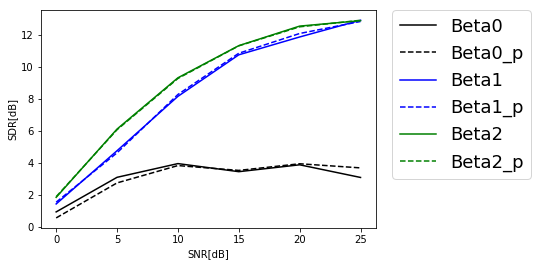

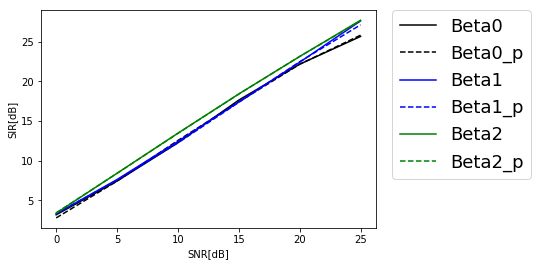

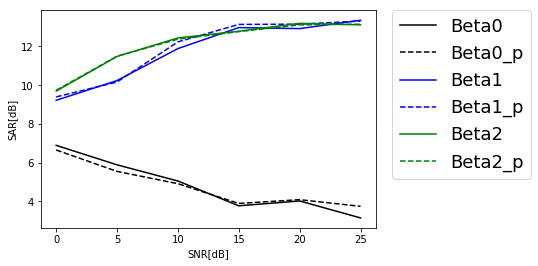

In [104]:
x = np.array([0,5,10,15,20,25])
#plt.title("SDR")
plt.plot(x, snr_res["Beta0"][0], "k", label="Beta0")
plt.plot(x, snr_res["Beta0_p"][0], "k", label="Beta0_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][0], "b", label="Beta1")
plt.plot(x, snr_res["Beta1_p"][0], "b", label="Beta1_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][0], "g", label="Beta2")
plt.plot(x, snr_res["Beta2_p"][0], "g", label="Beta2_p", linestyle = "dashed")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SDR[dB]")
plt.show()
           
           
           
x = np.array([0,5,10,15,20,25])
#plt.title("SIR")
plt.plot(x, snr_res["Beta0"][1], "k", label="Beta0")
plt.plot(x, snr_res["Beta0_p"][1], "k", label="Beta0_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][1], "b", label="Beta1")
plt.plot(x, snr_res["Beta1_p"][1], "b", label="Beta1_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][1], "g", label="Beta2")
plt.plot(x, snr_res["Beta2_p"][1], "g", label="Beta2_p", linestyle = "dashed")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SIR[dB]")
plt.show()
           
           
           
x = np.array([0,5,10,15,20,25])
#plt.title("SAR")
plt.plot(x, snr_res["Beta0"][2], "k", label="Beta0")
plt.plot(x, snr_res["Beta0_p"][2], "k", label="Beta0_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][2], "b", label="Beta1")
plt.plot(x, snr_res["Beta1_p"][2], "b", label="Beta1_p", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][2], "g", label="Beta2")
plt.plot(x, snr_res["Beta2_p"][2], "g", label="Beta2_p", linestyle = "dashed")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SAR[dB]")
plt.show()

In [72]:
#SEDNNも色々なSNRに対して試す
#とりあえず分離後の音源を準備してそれを読み込むだけ
snr_list = [0, 5, 10, 15, 20, 25]
sednn_snr_dic = {}
for j in snr_list:
    sednn_mix_list = [os.path.join("./SEDNN_Data_%ddb/test_wavs/mix" % j, t + "inv_norm.trainonly.mix.wav") for t in tr_name]
    sednn_pred_list = [os.path.join("./SEDNN_Data_%ddb/test_wavs/pred" % j, t + "inv_norm.trainonly.wav") for t in tr_name]
    sednn_inv_list = [os.path.join("./SEDNN_Data_%ddb/test_wavs/inv" % j, t + "inv_norm.trainonly.inv.wav") for t in tr_name]
    sednn_noise_list = [os.path.join("./SEDNN_Data_%ddb/test_wavs/noise" % j, t + "inv_norm.trainonly.noise.wav") for t in tr_name]
    eval_sednn_dic = {}
    for i in range(len(sednn_mix_list)):
        s_inv, sr_inv = librosa.load(sednn_inv_list[i])
        s_veh, sr_veh = librosa.load(sednn_noise_list[i])
        #if len(s_veh) != len(s_inv): 
        #    s_inv, s_veh = time_norm(s_inv, s_veh)
        if sr_inv != sr_veh:
            print("Not muching sampling rate!")

        pred_inv, pred_sr_inv = librosa.load(sednn_pred_list[i])
        pred_mix, pred_sr_mix = librosa.load(sednn_mix_list[i])
        if pred_sr_inv != pred_sr_mix:
            print("Not muching sampling rate!")

        pred_noise = pred_mix - pred_inv
        sdr, sir, sar = eval_mir(pred_inv, pred_noise, s_inv, s_veh)
        print(sdr, sir, sar)

        lis = [sdr[0], sir[0], sar[0]]
        p_df = pd.DataFrame(lis, index=["SDR", "SIR", "SAR"], columns=["SEDNN"])
        eval_sednn_dic[tr_name[i]] = p_df

        #display(Audio(pred_mix, rate=pred_sr_inv))
        #display(Audio(s_inv, rate=pred_sr_inv))
        #display(Audio(pred_inv, rate=pred_sr_inv))
    sednn_snr_dic[j] = eval_sednn_dic

[ 3.41  2.41] [ 4.13  10.17] [ 12.98  3.61]
[ 4.40  2.61] [ 5.62  11.12] [ 11.55  3.59]
[ 4.43  4.41] [ 8.43  5.84] [ 7.22  10.92]
[ 4.56  3.49] [ 9.10  5.04] [ 6.95  9.91]
[ 4.57  3.74] [ 8.98  5.13] [ 7.04  10.52]
[ 8.27  2.08] [ 9.83  8.11] [ 13.90  3.95]
[ 9.17  2.59] [ 11.80  9.48] [ 12.88  4.04]
[ 7.34  0.40] [ 12.35  1.58] [ 9.24  8.91]
[ 6.36 -1.34] [ 11.72 -0.10] [ 8.14  7.80]
[ 6.62 -0.62] [ 12.38  0.52] [ 8.21  8.49]
[ 13.44  1.68] [ 16.27  7.07] [ 16.75  3.95]
[ 13.82  1.59] [ 19.06  7.32] [ 15.43  3.67]
[ 9.03 -3.17] [ 16.01 -2.01] [ 10.10  7.28]
[ 6.60 -3.29] [ 14.53 -2.55] [ 7.51  9.22]
[ 8.13 -4.37] [ 15.73 -3.39] [ 9.07  7.61]
[ 18.12  0.87] [ 24.42  5.25] [ 19.30  3.98]
[ 17.04  0.60] [ 27.66  3.84] [ 17.44  4.88]
[ 6.99 -3.48] [ 19.96 -2.99] [ 7.26  10.93]
[ 7.38 -3.51] [ 18.96 -2.91] [ 7.74  10.16]
[ 7.44 -5.45] [ 21.37 -4.96] [ 7.65  10.41]
[ 22.39 -1.13] [ 31.13  4.03] [ 23.02  1.89]
[ 19.84 -0.82] [ 30.83  2.84] [ 20.21  3.45]
[ 5.93 -4.19] [ 21.37 -3.72] [ 6.08 

In [73]:
#SSNMFとSEDNNの結果を結合

#df_snrが全部の情報入り
#shape = (SNR, 磁励音の種類, 各手法)

#5000は削る
tr_name = [
    "6000",
    "209",
    "7000",
    "50000",
    "9050"
]

df_snr = {}
for j in snr_list:
    df_ = {}
    for i in tr_name:
        df_[i] = pd.concat([eval_snr_dic[j][i], sednn_snr_dic[j][i]], axis=1)
    df_snr[j] = df_

#結合した表について，全てのSNRについてSDR,SIR,SARの平均をとる
#冗長なので後で要改善
mtd_name = ["Beta0", "Beta0_p", "Beta1", "Beta1_p", "Beta2", "Beta2_p", "SEDNN"]
snr_res = {}
#methodごと
for k in mtd_name:
    sdr_ = []
    sir_ = []
    sar_ = []
    #SNRごと
    for j in snr_list:
        df_ = df_snr[j]
        sdr = 0
        sir = 0
        sar = 0
        for i in tr_name:
            sdr += df_[i][k]["SDR"]
            sir += df_[i][k]["SIR"]
            sar += df_[i][k]["SAR"]
        #平均を出す
        sdr = sdr/len(tr_name)
        sir = sir/len(tr_name)
        sar = sar/len(tr_name)
        #各SNRに対する平均値のリストを作成
        sdr_.append(sdr)
        sir_.append(sir)
        sar_.append(sar)
    snr_res[k] = [sdr_, sir_, sar_]

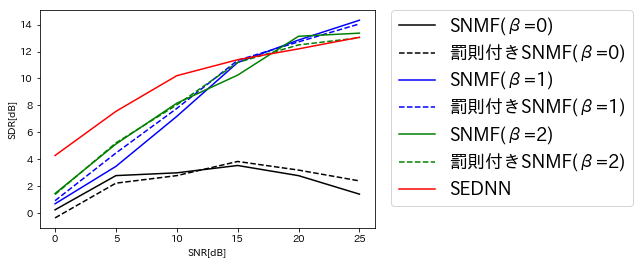

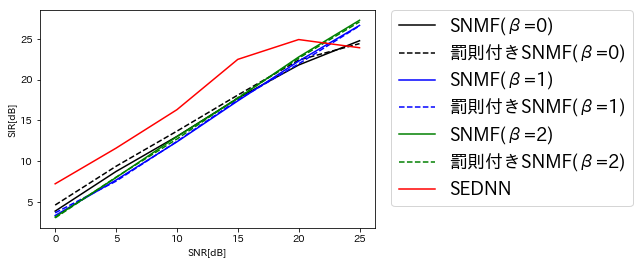

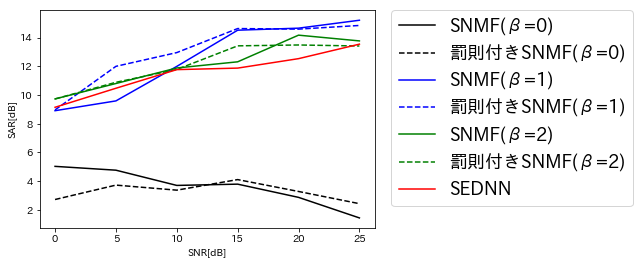

In [140]:
x = np.array([0,5,10,15,20,25])
#plt.title("SDR")
plt.plot(x, snr_res["Beta0"][0], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][0], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][0], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][0], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][0], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][0], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][0], "r", label="SEDNN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SDR[dB]")
plt.show()
           
           
x = np.array([0,5,10,15,20,25])
#plt.title("SIR")
plt.plot(x, snr_res["Beta0"][1], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][1], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][1], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][1], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][1], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][1], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][1], "r", label="SEDNN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SIR[dB]")
plt.show()
           
           
           
x = np.array([0,5,10,15,20,25])
#plt.title("SAR")
plt.plot(x, snr_res["Beta0"][2], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][2], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][2], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][2], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][2], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][2], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][2], "r", label="SEDNN")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
#plt.set_xticks(np.linspace(0, 30, 5))
plt.xlabel("SNR[dB]")
plt.ylabel("SAR[dB]")
plt.show()

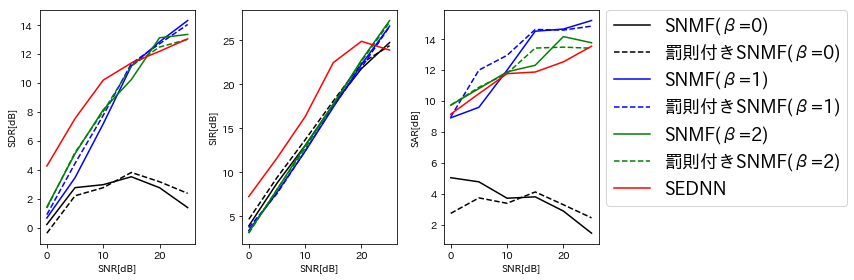

In [151]:
x = np.array([0,5,10,15,20,25])
plt.figure(figsize=(12, 4))

#plt.title("SDR")
plt.subplot(1, 3, 1)
plt.plot(x, snr_res["Beta0"][0], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][0], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][0], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][0], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][0], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][0], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][0], "r", label="SEDNN")
plt.xlabel("SNR[dB]")
plt.ylabel("SDR[dB]")
           
           
x = np.array([0,5,10,15,20,25])
plt.subplot(1, 3, 2)
plt.plot(x, snr_res["Beta0"][1], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][1], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][1], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][1], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][1], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][1], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][1], "r", label="SEDNN")
plt.xlabel("SNR[dB]")
plt.ylabel("SIR[dB]")
           
           
x = np.array([0,5,10,15,20,25])
plt.subplot(1, 3, 3)
plt.plot(x, snr_res["Beta0"][2], "k", label="SNMF(β=0)")
plt.plot(x, snr_res["Beta0_p"][2], "k", label="罰則付きSNMF(β=0)", linestyle = "dashed")
plt.plot(x, snr_res["Beta1"][2], "b", label="SNMF(β=1)")
plt.plot(x, snr_res["Beta1_p"][2], "b", label="罰則付きSNMF(β=1)", linestyle = "dashed")
plt.plot(x, snr_res["Beta2"][2], "g", label="SNMF(β=2)")
plt.plot(x, snr_res["Beta2_p"][2], "g", label="罰則付きSNMF(β=2)", linestyle = "dashed")
plt.plot(x, snr_res["SEDNN"][2], "r", label="SEDNN")
plt.xlabel("SNR[dB]")
plt.ylabel("SAR[dB]")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=18)
plt.tight_layout()
# plt.show()
plt.savefig('paper_img/bunri.eps', bbox_inches="tight", pad_inches=0.05)

In [289]:
#SIR,SAR,SDRに分けて情報を表を作成

#df_snrが全部の情報入り
#shape = (SNR, 磁励音の種類, 各手法)
columns_name = ["磁励音A","磁励音B","磁励音C","磁励音D","磁励音E"]
index_name = ["β=0", "罰則付きβ=0", "β=1", "罰則付きβ=1", "β=2", "罰則付きβ=2", "SEDNN"]
tab_sir = {}
tab_sar = {}
tab_sdr = {}
for one in x:
    dict_sir = pd.DataFrame([], columns=columns_name, index=index_name)
    dict_sar = pd.DataFrame([], columns=columns_name, index=index_name)
    dict_sdr = pd.DataFrame([], columns=columns_name, index=index_name)
    for no_tr,tr in enumerate(tr_name):
        for no_mtd,mtd in enumerate(mtd_name):
            dict_sir.loc[index_name[no_mtd],columns_name[no_tr]] = str(df_snr[one][tr][mtd].SIR.round(2)) + "dB"
            dict_sar.loc[index_name[no_mtd],columns_name[no_tr]] = str(df_snr[one][tr][mtd].SAR.round(2)) + "dB"
            dict_sdr.loc[index_name[no_mtd],columns_name[no_tr]] = str(df_snr[one][tr][mtd].SDR.round(2)) + "dB"
    tab_sir[one] = dict_sir
    tab_sar[one] = dict_sar
    tab_sdr[one] = dict_sdr

\begin{tabular}{llllll}
{} &   磁励音A &    磁励音B &   磁励音C &   磁励音D &   磁励音E \\
\textbf{β=0    } &  1.363 &  0.1964 &  4.983 &  1.573 & -1.109 \\
\textbf{罰則付きβ=0} &  5.279 & -0.4671 &  4.965 &  3.336 & -1.185 \\
\textbf{β=1    } &  23.98 &   21.57 &  3.574 &  9.918 &  12.59 \\
\textbf{罰則付きβ=1} &  23.79 &   20.79 &  3.755 &  9.254 &  12.68 \\
\textbf{β=2    } &  20.82 &   19.87 &  8.092 &  6.934 &  11.12 \\
\textbf{罰則付きβ=2} &  20.54 &   19.95 &  7.455 &  6.262 &  10.91 \\
\textbf{SEDNN  } &  23.04 &   18.86 &  10.65 &  5.741 &  7.016 \\
\centering
\caption{各音声と手法に対するSDR(SNR=25時)}
\label{tab:SDR_25}
\end{tabular}



In [291]:
#tex用の表自動生成
for one in [0,10,15,20,25]:
    #print("\n\n{}dB:SDR\n\n".format(str(one)))
    otheropt = "\\centering\n\\caption{{各音声と手法に対する{}(SNR={}時)}}\n\\label{{tab:{}_{}}}\n".format("SDR",str(one),"SDR",str(one))
    print("\\begin{table}\n"+tab_sdr[one].to_latex(bold_rows=True).replace("\\toprule\n","").replace("\\midrule\n","").replace("\\bottomrule\n","")+otheropt+"\end{table}")
    #print("\n\n{}dB:SIR\n\n".format(str(one)))
    otheropt = "\\centering\n\\caption{{各音声と手法に対する{}(SNR={}時)}}\n\\label{{tab:{}_{}}}\n".format("SIR",str(one),"SIR",str(one))
    print("\\begin{table}\n"+tab_sir[one].to_latex(bold_rows=True).replace("\\toprule\n","").replace("\\midrule\n","").replace("\\bottomrule\n","")+otheropt+"\end{table}")
    #print("\n\n{}dB:SAR\n\n".format(str(one)))
    otheropt = "\\centering\n\\caption{{各音声と手法に対する{}(SNR={}時)}}\n\\label{{tab:{}_{}}}\n".format("SAR",str(one),"SAR",str(one))
    print("\\begin{table}\n"+tab_sar[one].to_latex(bold_rows=True).replace("\\toprule\n","").replace("\\midrule\n","").replace("\\bottomrule\n","")+otheropt+"\end{table}")
    
    
    

\begin{table}
\begin{tabular}{llllll}
{} &     磁励音A &    磁励音B &    磁励音C &     磁励音D &     磁励音E \\
\textbf{β=0    } &   0.82dB &  0.49dB &   1.3dB &  -0.36dB &  -1.06dB \\
\textbf{罰則付きβ=0} &  -2.68dB &  0.02dB &  2.62dB &  -0.57dB &  -1.23dB \\
\textbf{β=1    } &   1.14dB &  1.05dB &  2.54dB &   0.18dB &  -1.49dB \\
\textbf{罰則付きβ=1} &   1.26dB &  1.12dB &  3.02dB &  -0.57dB &  -0.27dB \\
\textbf{β=2    } &    1.8dB &  1.66dB &  3.03dB &   0.66dB &   0.09dB \\
\textbf{罰則付きβ=2} &   1.84dB &  1.68dB &  3.08dB &   0.07dB &    0.2dB \\
\textbf{SEDNN  } &   3.41dB &   4.4dB &  4.43dB &   4.56dB &   4.57dB \\
\end{tabular}
\centering
\caption{各音声と手法に対するSDR(SNR=0時)}
\label{tab:SDR_0}
\end{table}
\begin{table}
\begin{tabular}{llllll}
{} &    磁励音A &    磁励音B &    磁励音C &    磁励音D &    磁励音E \\
\textbf{β=0    } &  2.51dB &  1.57dB &  6.75dB &  4.51dB &  4.21dB \\
\textbf{罰則付きβ=0} &   3.2dB &  3.08dB &  8.01dB &  4.46dB &  4.52dB \\
\textbf{β=1    } &  1.35dB &  1.29dB &  7.88dB &  4.06dB &   2.3dB \\
\

In [224]:
display(df_snr[10]["9050"])

,Beta0,Beta0_p,Beta1,Beta1_p,Beta2,Beta2_p,SEDNN
SDR,1.2369,0.9921,2.4587,8.8351,5.2363,4.9784,8.1302
SIR,13.1079,13.6769,11.3555,11.1677,11.4941,11.2726,15.7297
SAR,1.7361,1.4151,3.3649,12.9687,6.7069,6.4528,9.0740


# beta=0がおかしいので検証

In [ ]:
F, G, cost = func.train_vvvf(rem_rem_stft6000, init_F=init_F.T, init_G=init_G, init='custom', beta=j)
ssnmf_beta = func.extract_vvvf(fake_abs, F=F, beta=0)

# 結果

In [232]:
#google colabで結果は出してるから，その結果を配列に格納（手動）
results={}
results["SNMF_KNN_NO"]=[
    [12,0,0,0,0,0],
    [0,12,0,0,0,0],
    [0,0,11,1,0,0],
    [0,0,8,4,0,0],
    [0,0,1,2,4,5],
    [0,0,2,2,0,8]
]
results["SNMF_KNN_FT"]=[
    [11,1,0,0,0,0],
    [0,12,0,0,0,0],
    [0,0,9,1,0,2],
    [0,0,2,8,2,0],
    [0,0,0,2,9,1],
    [0,0,2,0,3,7]
]
results["SNMF_KNN_MFCC"]=[
    [11,1,0,0,0,0],
    [2,4,3,3,0,0],
    [0,2,6,2,0,2],
    [0,1,2,5,1,3],
    [0,0,0,1,9,2],
    [0,0,0,4,1,7]
]
results["SNMF_SVM_NO"]=[
    [12,0,0,0,0,0],
    [0,11,1,0,0,0],
    [0,2,9,1,0,0],
    [0,0,4,7,0,1],
    [0,0,0,0,6,6],
    [0,0,0,1,2,9]
]
results["SNMF_SVM_FT"]=[
    [12,0,0,0,0,0],
    [0,12,0,0,0,0],
    [0,0,7,4,0,1],
    [0,0,1,9,0,2],
    [0,0,0,2,7,3],
    [0,0,0,0,3,9]
]
results["SNMF_SVM_MFCC"]=[
    [11,1,0,0,0,0],
    [3,4,4,1,0,0],
    [0,2,5,4,0,1],
    [0,2,5,3,1,1],
    [0,0,0,1,9,2],
    [0,0,1,3,2,6]
]
results["SEDNN_KNN_NO"]=[
    [12,0,0,0,0,0],
    [12,0,0,0,0,0],
    [12,0,0,0,0,0],
    [12,0,0,0,0,0],
    [12,0,0,0,0,0],
    [12,0,0,0,0,0]
]
results["SEDNN_KNN_FT"]=[
    [4,2,2,1,1,2],
    [4,2,3,1,0,2],
    [1,4,0,2,3,2],
    [1,4,3,1,1,2],
    [2,3,3,2,0,2],
    [3,3,4,0,0,2]
]
results["SEDNN_KNN_MFCC"]=[
    [10,2,0,0,0,0],
    [1,9,2,0,0,0],
    [0,0,7,5,0,0],
    [0,0,4,6,2,0],
    [0,0,0,0,12,0],
    [0,0,0,3,5,4]
]
results["SEDNN_SVM_NO"]=[
    [12,0,0,0,0,0],
    [12,0,0,0,0,0],
    [1,10,0,1,0,0],
    [0,7,4,0,0,1],
    [0,0,0,1,4,7],
    [0,0,0,9,2,1]
]
results["SEDNN_SVM_FT"]=[
    [2,6,1,1,1,1],
    [3,3,2,0,3,1],
    [0,4,1,5,1,1],
    [2,1,6,0,2,1],
    [2,2,5,2,0,1],
    [1,3,3,2,3,0]
]
results["SEDNN_SVM_MFCC"]=[
    [12,0,0,0,0,0],
    [2,9,1,0,0,0],
    [0,2,6,4,0,0],
    [0,0,2,8,0,2],
    [0,0,0,0,9,3],
    [0,0,0,2,4,6]
]

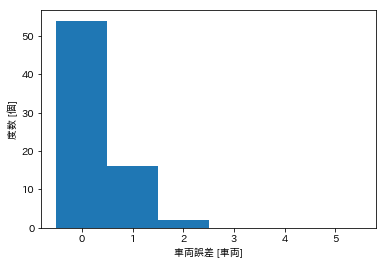

In [169]:
#confからacc
import numpy as np
import matplotlib.pyplot as plt
def conf_acc(conf):
    conf = np.array(conf)
    N = conf.sum()
    acc_sum = 0
    for i in range(len(conf)):
        for j in range(len(conf[0])):
            if i == j :
                acc_sum += conf[i][j]
    return acc_sum/N

#confから平均推定誤差
def conf_meanerror(conf):
    conf = np.array(conf)
    N = conf.sum()
    error_sum = 0
    for i in range(len(conf)):
        for j in range(len(conf[0])):
            if i == j :
                continue
            else :
                err = abs(i-j)
                error_sum += conf[i][j] * err
    return error_sum/N

#車両誤差の分布
def conf_plot_error(conf,fname):
    xxx = np.arange(0,6)
    err_loc = [0] * 6
    for i in range(len(conf)):
        for j in range(len(conf[0])):
            err = abs(i-j)
            err_loc[err] += conf[i][j]
    plt.figure()
    plt.bar(xxx, err_loc, width=1.0)
    plt.xlabel("車両誤差 [車両]")
    plt.ylabel("度数 [個]")
    plt.savefig('paper_img/'+fname, bbox_inches="tight", pad_inches=0.05)
    #plt.show()

#分布をplot
conf_plot_error(results["SNMF_SVM_NO"], "snmf_NO_SVM_errordist.eps")

#accと平均推定誤差
# for key in results.keys():
#     print(key)
#     print("{}個".format(np.array(results[key]).sum()))
#     print(conf_acc(results[key]))
#     print(conf_meanerror(results[key]))

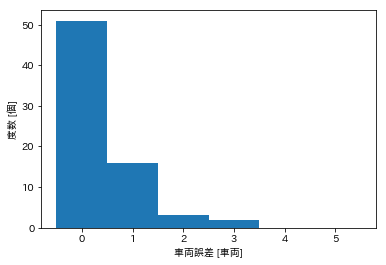

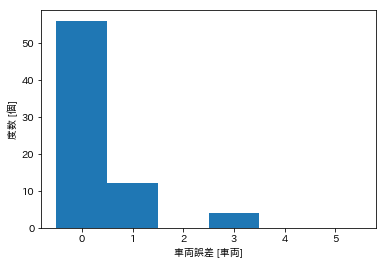

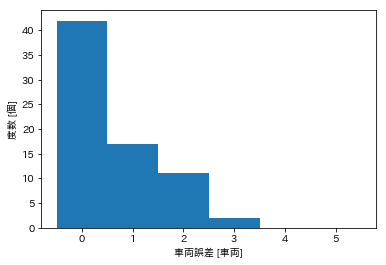

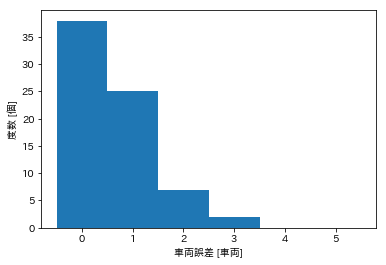

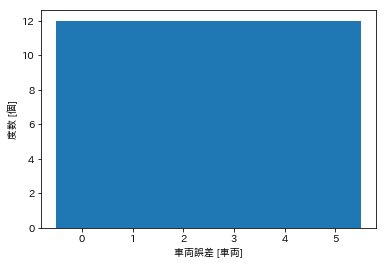

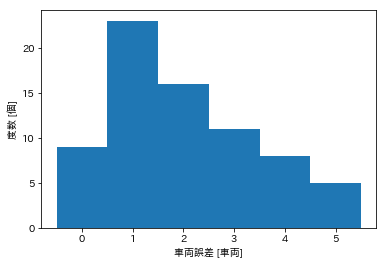

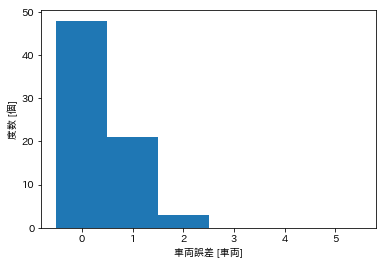

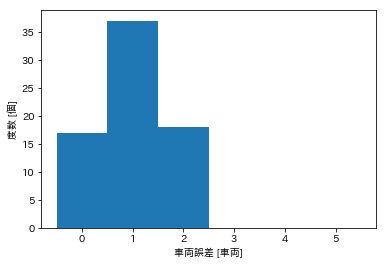

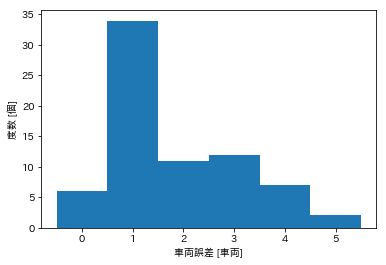

In [294]:
import seaborn as sns

for key in results.keys():
    if key in ["SNMF_SVM_NO","SNMF_SVM_FT","SEDNN_SVM_MFCC"]:
        continue
    #plt.figure()
    #sns.heatmap(np.array(results[key]),annot=True)
    #plt.savefig('paper_img/heatmap_{}.eps'.format(key), bbox_inches="tight", pad_inches=0.05)
    conf_plot_error(results[key], key+".eps")

array([[11,  1,  0,  0,  0,  0],
       [ 3,  4,  4,  1,  0,  0],
       [ 0,  2,  5,  4,  0,  1],
       [ 0,  2,  5,  3,  1,  1],
       [ 0,  0,  0,  1,  9,  2],
       [ 0,  0,  1,  3,  2,  6]])